#Functions

In [1]:
!pip install Bio asyncpraw pandas tqdm nest_asyncio praw beautifulsoup4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.3/321.3 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.3/189.3 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 4.2 MB/s eta 0:00:00
  Attempting uninstall: aiosqlite
    Found existing installation: aiosqlite 0.22.1
    Uninstalling aiosqlite-0.22.1:
      Successfully uninstalled aiosqlite-0.22.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-adk 1.23.0 requires aiosqlite>=0.21.0, but you have aiosqlite 0.17.0 which is incompatible.


In [2]:
from Bio import Entrez
from unicodedata import normalize
import os
import re
import json
from typing import Dict, Any
import datetime
import requests
from bs4 import BeautifulSoup
import time
import logging
import os
import glob
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
from typing import List, Optional, Tuple, Dict
import torch
import math
from transformers import AutoTokenizer, AutoModelForCausalLM
import statistics
import random
from datetime import datetime, timedelta
import pandas as pd
import praw
import pandas as pd
from tqdm.notebook import tqdm
from google.colab import drive

In [3]:
drive.mount('/content/drive')
os.chdir("/content/drive/MyDrive/data/perplexity")

Mounted at /content/drive


In [4]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed Feb  4 00:05:51 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   40C    P0             56W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [5]:
def extract_country(address):
    """
    Extract country name from an address string.

    Args:
        address (str): The input address string

    Returns:
        str or None: Extracted country name if found, None otherwise
    """
    # List of country names (sorted by length to match longest names first)
    countries = [
        'Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Argentina', 'Armenia', 'Australia', 'Austria',
        'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
        'Bhutan', 'Bolivia', 'Bosnia', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi',
        'Cambodia', 'Cameroon', 'Canada', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Croatia',
        'Cuba', 'Cyprus', 'Czech Republic', 'Denmark', 'Djibouti', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia',
        'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
        'Grenada', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'Hungary', 'Iceland', 'India',
        'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan',
        'Kenya', 'Korea', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya',
        'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali',
        'Malta', 'Mauritania', 'Mauritius', 'Mexico', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco',
        'Mozambique', 'Myanmar', 'Namibia', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger',
        'Nigeria', 'North Korea', 'Norway', 'Oman', 'Pakistan', 'Panama', 'Paraguay', "People's Republic of China", 'Peru', 'Philippines',
        'Poland', 'Portugal', 'Qatar', 'Republic of Korea', 'Romania', 'Russia', 'Rwanda', 'Saudi Arabia', 'Senegal', 'Serbia',
        'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Somalia', 'South Africa',
        'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Swaziland', 'Sweden',
        'Switzerland', 'Syria', 'Taiwan', 'Tajikistan', 'Tanzania', 'Thailand', 'Togo', 'Tonga',
        'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Uganda', 'Ukraine', 'UAE',
        'United Arab Emirates', 'United Kingdom', 'UK', 'United States', 'USA', 'US', 'Uruguay', 'Uzbekistan',
        'Vatican City', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe',
        "Alabama", "Alaska", "Arizona", "Arkansas", "California", "Colorado", "Connecticut", "Delaware", "Florida",
        "Georgia", "Hawaii", "Idaho", "Illinois", "Indiana", "Iowa", "Kansas", "Kentucky", "Louisiana", "Maine",
        "Maryland", "Massachusetts", "Michigan", "Minnesota", "Mississippi", "Missouri", "Montana", "Nebraska",
        "Nevada", "New Hampshire", "New Jersey", "New Mexico", "New York", "North Carolina", "North Dakota", "Ohio",
        "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas",
        "Utah", "Vermont", "Virginia", "Washington", "West Virginia", "Wisconsin", "Wyoming"
        "Alberta", "British Columbia", "Manitoba", "New Brunswick", "Newfoundland and Labrador", "Northwest Territories",
        "Nova Scotia", "Nunavut", "Ontario", "Prince Edward Island", "Quebec", "Saskatchewan", "Yukon",
        "AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
        "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
        "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ",
        "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC",
        "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY", "DC",
        "AB", "BC", "MB", "NB", "NL", "NS", "NT", "NU", "ON", "PE",
        "QC", "SK", "YT"
    ]

    # Sort countries by length (longest first) to match longest country names first
    countries.sort(key=len, reverse=True)

    # Create regex pattern
    pattern = r'\b(' + '|'.join(re.escape(country) for country in countries) + r')\b'


    # Search for match in address
    match = re.search(pattern, address)

    return match.group(1) if match else None

In [6]:
def get_journal_quartile(journal_name, csv_file_path='journal_ranking_data.csv'):
    """
    Find the Best Quartile value for a given journal name in the journal ranking data.
    Normalizes journal names by:
    - Removing 'the'
    - Replacing '&' with 'and'
    - Removing text in parentheses and brackets
    - Removing text after a colon
    - Removing special characters
    - Normalizing whitespace

    Args:
        journal_name (str): The name of the journal to search for
        csv_file_path (str): Path to the journal ranking CSV file

    Returns:
        str or None: The Best Quartile value if found, None if the journal is not found
    """
    # Normalize journal name function
    def normalize_journal_name(name):
        if pd.isna(name) or not isinstance(name, str):
            return ''

        # Convert to string if not already
        name_str = str(name)

        # Remove text after colon (keep only the part before the first colon)
        if ':' in name_str:
            name_str = name_str.split(':', 1)[0]

        # Remove 'the' (case insensitive)
        name_str = re.sub(r'\bthe\s+', ' ', name_str, flags=re.IGNORECASE)

        # Replace '&' with 'and'
        name_str = name_str.replace('&', ' and ')

        # Remove text in parentheses and the parentheses themselves
        name_str = re.sub(r'\([^)]*\)', ' ', name_str)  # (text)
        name_str = re.sub(r'\[[^\]]*\]', ' ', name_str)  # [text]
        name_str = re.sub(r'\{[^}]*\}', ' ', name_str)   # {text}

        # Remove special characters (dashes, colons, etc.) and replace with space
        name_str = re.sub(r'[^\w\s]', ' ', name_str)

        # Replace multiple spaces with a single space and strip
        name_str = re.sub(r'\s+', ' ', name_str).strip()

        return name_str

    # Normalize input journal name
    normalized_journal_name = normalize_journal_name(journal_name)

    try:
        # Read the CSV file
        # Note: We're setting low_memory=False to avoid mixed type inference warnings
        df = pd.read_csv(csv_file_path, low_memory=False)

        # Create a normalized version of the Title column
        df['Normalized_Title'] = df['Title'].apply(normalize_journal_name)

        # Case-insensitive search for the journal name in the normalized Title column
        # First try exact match
        matches = df[df['Normalized_Title'].str.lower() == normalized_journal_name.lower()]

        # If no exact match, try to find it as a substring
        if len(matches) == 0:
            matches = df[df['Normalized_Title'].str.lower().str.contains(normalized_journal_name.lower(), na=False)]

        # Return results
        if len(matches) == 0:
            print(f"No journal found with name '{journal_name}'")
            return None
        elif len(matches) > 1:
            print(f"Multiple journals found matching '{journal_name}':")
            for i, (_, row) in enumerate(matches.iterrows()):
                print(f"{i+1}. {row['Title']} - {row['Best Quartile']}")
            # Return the first match but inform the user
            print(f"Returning information for: {matches.iloc[0]['Title']}")
            return matches.iloc[0]['Best Quartile']
        else:
            # Exactly one match found
            return matches.iloc[0]['Best Quartile']

    except FileNotFoundError:
        print(f"Error: File '{csv_file_path}' not found")
        return None
    except Exception as e:
        print(f"Error processing file: {str(e)}")
        return None


In [7]:
def get_article(pmid_list):
  Entrez.email = "Your.Name.Here@example.org"
  handle = Entrez.efetch(db="pubmed", id=','.join(map(str, pmid_list)),
                       rettype="xml", retmode="text")
  records = Entrez.read(handle)

  grand_dict = {}

  count = 0

  eng_countries = ['Australia', 'Canada', 'Ireland', 'New Zealand', 'United Kingdom', 'UK', 'United States', 'USA', 'US', 'United States of America',
                  "Alabama", "Alaska", "Arizona", "Arkansas", "California", "Colorado", "Connecticut", "Delaware", "Florida",
                  "Georgia", "Hawaii", "Idaho", "Illinois", "Indiana", "Iowa", "Kansas", "Kentucky", "Louisiana", "Maine",
                  "Maryland", "Massachusetts", "Michigan", "Minnesota", "Mississippi", "Missouri", "Montana", "Nebraska",
                  "Nevada", "New Hampshire", "New Jersey", "New Mexico", "New York", "North Carolina", "North Dakota", "Ohio",
                  "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas",
                  "Utah", "Vermont", "Virginia", "Washington", "West Virginia", "Wisconsin", "Wyoming"
                  "Alberta", "British Columbia", "Manitoba", "New Brunswick", "Newfoundland and Labrador", "Northwest Territories",
                  "Nova Scotia", "Nunavut", "Ontario", "Prince Edward Island", "Quebec", "Saskatchewan", "Yukon",
                  "AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
                  "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
                  "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ",
                  "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC",
                  "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY",
                  "DC",
                  "AB", "BC", "MB", "NB", "NL", "NS", "NT", "NU", "ON", "PE",
                  "QC", "SK", "YT"
                 ]

  for record in records['PubmedArticle']:

    # get pmid
    pmid = record['MedlineCitation']['PMID']
    pmid = pmid[:15]
    print(f'Processing {pmid}')
    grand_dict[pmid] = {}


    # process country
    try:
      first_aff = record['MedlineCitation']['Article']['AuthorList'][0]['AffiliationInfo'][0]['Affiliation']
      last_aff = record['MedlineCitation']['Article']['AuthorList'][-1]['AffiliationInfo'][0]['Affiliation']

      first_country = extract_country(first_aff)
      last_country = extract_country(last_aff)

      if first_country == last_country:
        country = first_country
      else:
        if first_country in eng_countries:
          if last_country in eng_countries:
            country = first_country
          else:
            country = last_country
        else:
          country = first_country

      grand_dict[pmid]['country'] = country
    except:
      grand_dict[pmid]['country'] = None

    # process year
    try:
      year = record['MedlineCitation']['Article']['ArticleDate'][0]['Year']
      grand_dict[pmid]['year'] = int(year)
    except:
      grand_dict[pmid]['year'] = None

    # process journal
    try:
      journal = record['MedlineCitation']['Article']['Journal']['Title']
      grand_dict[pmid]['journal'] = journal
    except:
      grand_dict[pmid]['journal'] = None

    # process journal quartile
    try:
      quartile = get_journal_quartile(journal)
      grand_dict[pmid]['quartile'] = quartile
    except:
      grand_dict[pmid]['quartile'] = None

    # process abstract
    abs = ''
    try:
      for t in record['MedlineCitation']['Article']['Abstract']['AbstractText']:
        abs += t
        abs += ' '
      abs = normalize('NFKD', abs).encode('ascii','ignore')
      abs = abs.decode('utf-8')
      grand_dict[pmid]['abs'] = abs
    except:
      abs = ''
      grand_dict[pmid]['abs'] = abs

  return grand_dict

In [8]:
class PubMedJSONEncoder(json.JSONEncoder):
    """Custom JSON encoder to handle special types from PubMed data"""
    def default(self, obj):
        # Handle StringElement type from Bio.Entrez
        if hasattr(obj, '__str__'):
            return str(obj)
        # Handle bytes type
        if isinstance(obj, bytes):
            return obj.decode('utf-8')
        # Handle sets
        if isinstance(obj, set):
            return list(obj)
        # Handle other special types as needed
        return super().default(obj)

def save_pubmed_data(grand_dict: Dict[str, Any], filename: str) -> None:
    """
    Save the PubMed data dictionary to a JSON file.

    Args:
        grand_dict (Dict): Dictionary containing PubMed data
        filename (str): Name of the output JSON file
    """
    try:
        # Add metadata to the output
        output_data = {
            'metadata': {
                'created_at': datetime.now().isoformat(),
                'record_count': len(grand_dict)
            },
            'data': grand_dict
        }

        # Save to JSON file with custom encoder and pretty printing
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(output_data, f,
                     cls=PubMedJSONEncoder,
                     indent=2,
                     ensure_ascii=False)

        print(f"Successfully saved {len(grand_dict)} records to {filename}")

    except Exception as e:
        print(f"Error saving data to JSON: {str(e)}")
        raise

def load_pubmed_data(filename: str) -> Dict[str, Any]:
    """
    Load the PubMed data from a JSON file.

    Args:
        filename (str): Name of the JSON file to load

    Returns:
        Dict: The loaded data dictionary
    """
    try:
        with open(filename, 'r', encoding='utf-8') as f:
            data = json.load(f)
        print(f"Successfully loaded {len(data['data'])} records from {filename}")
        return data['data']

    except Exception as e:
        print(f"Error loading data from JSON: {str(e)}")
        raise

In [9]:
def create_nested_lists(file_path, chunk_size=100):
    """
    Read a file line by line and create a list of lists, where each inner list
    contains 'chunk_size' elements from the file.

    Args:
        file_path (str): Path to the file to read
        chunk_size (int): Number of elements in each inner list

    Returns:
        list: A list of lists, where each inner list contains chunk_size elements
    """
    result = []
    current_chunk = []

    try:
        with open(file_path, 'r') as file:
            for line in file:
                # Strip whitespace and add non-empty lines to the current chunk
                line_content = line.strip()
                if line_content:
                    current_chunk.append(line_content)

                    # If the current chunk has reached the chunk_size, add it to the result
                    # and start a new chunk
                    if len(current_chunk) == chunk_size:
                        result.append(current_chunk)
                        current_chunk = []

            # Add any remaining elements if file doesn't have an exact multiple of chunk_size
            if current_chunk:
                result.append(current_chunk)

        print(f"Successfully created {len(result)} chunks of size {chunk_size}")
        return result

    except FileNotFoundError:
        print(f"Error: File not found at {file_path}")
        return []

    except Exception as e:
        print(f"Error processing file: {str(e)}")
        return []

In [10]:
def split_file_into_chunks(input_file, output_prefix, lines_per_chunk=1000):
    """
    Split a large text file into smaller files with a specified number of lines each.

    Args:
        input_file (str): Path to the input file
        output_prefix (str): Prefix for output files
        lines_per_chunk (int): Number of lines per output file

    Returns:
        list: List of generated output file paths
    """
    output_files = []

    try:
        # Count total lines in the file
        with open(input_file, 'r') as f:
            total_lines = sum(1 for _ in f)

        # Calculate number of chunks
        num_chunks = (total_lines + lines_per_chunk - 1) // lines_per_chunk

        print(f"Input file: {input_file}")
        print(f"Total lines: {total_lines}")
        print(f"Lines per chunk: {lines_per_chunk}")
        print(f"Number of chunks to create: {num_chunks}")

        # Read the file and split into chunks
        with open(input_file, 'r') as infile:
            chunk_num = 1
            line_count = 0
            output_file = None

            for line in infile:
                # If at the start of a chunk, open a new file
                if line_count % lines_per_chunk == 0:
                    # Close previous file if open
                    if output_file is not None:
                        output_file.close()

                    # Create a new file with formatted chunk number
                    output_filename = f"{output_prefix}_{chunk_num:03d}.txt"
                    output_file = open(output_filename, 'w')
                    output_files.append(output_filename)
                    print(f"Creating: {output_filename}")
                    chunk_num += 1

                # Write the line to the current output file
                output_file.write(line)
                line_count += 1

            # Close the last file
            if output_file is not None:
                output_file.close()

        print(f"\nSuccessfully split into {len(output_files)} files.")
        return output_files

    except Exception as e:
        print(f"Error splitting file: {str(e)}")
        return output_files

In [11]:
# https://stackoverflow.com/questions/12093940/reading-files-in-a-particular-order-in-python
def numericalSort(value):
    parts = re.compile(r'(\d+)').split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

In [12]:
from typing import List, Optional, Tuple
import matplotlib.pyplot as plt
import numpy as np

def plot_multiple_distributions(data_lists: List[List[float]],
                               labels: Optional[List[str]] = None,
                               colors: Optional[List[str]] = None,
                               bin_width: float = 0.001,
                               title: str = "",
                               figsize: Tuple[int, int] = (12, 6)):
    """
    Plot histograms for multiple distributions with custom bin width.

    Args:
        data_lists: List of lists, where each list contains the data for one distribution
        labels: List of labels for each distribution (defaults to "List 1", "List 2", etc.)
        colors: List of colors for each distribution (uses default color cycle if None)
        bin_width: Width of each bin (default is 0.001)
        title: Title for the plot
        figsize: Figure size as (width, height)
    """
    # Set default labels if not provided
    if labels is None:
        labels = [f"List {i+1}" for i in range(len(data_lists))]

    # Set default colors if not provided
    if colors is None:
        # Use default matplotlib color cycle
        colors = plt.cm.tab10.colors[:len(data_lists)]

    # Find global min and max for consistent binning
    all_values = [val for sublist in data_lists for val in sublist]
    min_val = min(all_values)
    #max_val = max(all_values)
    max_val = 200

    # Create bins with specified width
    bin_min = int(np.floor(min_val))
    bin_max = int(np.ceil(max_val)) + 1
    bins = np.arange(bin_min, bin_max, bin_width)

    # Create individual plots (one per distribution)
    num_plots = len(data_lists)
    fig, axes = plt.subplots(1, num_plots, figsize=(figsize[0], figsize[1]))

    # Handle the case where there's only one distribution
    if num_plots == 1:
        axes = [axes]

    # Plot each distribution
    for i, (data, label, color, ax) in enumerate(zip(data_lists, labels, colors, axes)):
        ax.hist(data, bins=bins, density=True, alpha=0.7, color=color, edgecolor='none')  # Removed borders
        ax.set_title(f'{label}')
        ax.set_xlabel('Perplexity')
        ax.set_ylabel('Proportion')
        ax.grid(axis='y', alpha=0.75)

        # Set y-axis limit to 0.05
        #ax.set_ylim(0, 0.05)
        ax.set_ylim(0, 0.05)

        # Set x-ticks every 5 units to avoid cluttering
        #ax.set_xticks(np.arange(bin_min, bin_max, 5))
        ax.set_xticks(np.arange(bin_min, bin_max, 25))

    plt.tight_layout()
    plt.show()

    # Create combined plot for comparison
    plt.figure(figsize=figsize)

    for data, label, color in zip(data_lists, labels, colors):
        plt.hist(data, bins=bins, density=True, alpha=0.6, color=color, edgecolor='none', label=label)  # Removed borders

    plt.title(title)
    plt.xlabel('Perplexity')
    plt.ylabel('Proportion')
    plt.legend()
    plt.grid(axis='y', alpha=0.75)

    # Set x-ticks every 5 units to avoid cluttering
    plt.xticks(np.arange(bin_min, bin_max, 5))

    plt.tight_layout()
    plt.show()

    # Print bin information for reference
    #print(f"Using bins from {bin_min} to {bin_max - 1} with width of {bin_width}")
    #print(f"Total number of bins: {len(bins) - 1}")

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from typing import List, Optional, Tuple

def plot_multiple_bin_distributions(data_lists: List[List[float]],
                               labels: Optional[List[str]] = None,
                               colors: Optional[List[str]] = None,
                               bin_width: float = 0.01,
                               title: str = "Comparison of Distributions",
                               figsize: Tuple[int, int] = (12, 6),
                               max_x_value: float = 1.0):
    """
    Plot histograms for multiple distributions with custom bin width.

    Args:
        data_lists: List of lists, where each list contains the data for one distribution
        labels: List of labels for each distribution (defaults to "List 1", "List 2", etc.)
        colors: List of colors for each distribution (uses default color cycle if None)
        bin_width: Width of each bin (default is 0.01)
        title: Title for the plot
        figsize: Figure size as (width, height)
        max_x_value: Maximum value for x-axis (default is 1.0)
    """
    # Set default labels if not provided
    if labels is None:
        labels = [f"List {i+1}" for i in range(len(data_lists))]

    # Set default colors if not provided
    if colors is None:
        # Use default matplotlib color cycle
        colors = plt.cm.tab10.colors[:len(data_lists)]

    # Find global min for consistent binning
    all_values = [val for sublist in data_lists for val in sublist]
    min_val = min(all_values)

    # Use 0 as min_val if it's greater than 0, otherwise use the actual min_val
    bin_min = 0 if min_val > 0 else min_val

    # Create bins with specified width, max value is fixed at max_x_value
    bins = np.arange(bin_min, max_x_value + bin_width, bin_width)

    # Create individual plots (one per distribution)
    num_plots = len(data_lists)
    fig, axes = plt.subplots(1, num_plots, figsize=(figsize[0], figsize[1]))

    # Handle the case where there's only one distribution
    if num_plots == 1:
        axes = [axes]

    # Plot each distribution
    for i, (data, label, color, ax) in enumerate(zip(data_lists, labels, colors, axes)):
        ax.hist(data, bins=bins, density=True, alpha=0.7, color=color, edgecolor='none')
        ax.set_title(f'{label}')
        ax.set_xlabel('Binoculars')
        ax.set_ylabel('Density')
        ax.grid(axis='y', alpha=0.75)

        # Calculate appropriate y-axis limit based on the data
        counts, _ = np.histogram(data, bins=bins, density=True)
        y_max = max(counts) * 1.2  # Add 20% margin
        ax.set_ylim(0, y_max)

        # Set x-axis limit
        ax.set_xlim(bin_min, max_x_value)

        # Set x-ticks at appropriate intervals
        if max_x_value <= 1:
            ax.set_xticks(np.arange(0, max_x_value + 0.1, 0.1))
        else:
            # For larger ranges, choose an appropriate tick interval
            tick_interval = max(0.1, round((max_x_value - bin_min) / 10, 1))
            ax.set_xticks(np.arange(bin_min, max_x_value + tick_interval, tick_interval))

    plt.tight_layout()
    plt.show()

    # Create combined plot for comparison
    plt.figure(figsize=figsize)

    for data, label, color in zip(data_lists, labels, colors):
        plt.hist(data, bins=bins, density=True, alpha=0.6, color=color, edgecolor='none', label=label)

    plt.title(title)
    plt.xlabel('Binoculars')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(axis='y', alpha=0.75)

    # Set x-axis limit
    plt.xlim(bin_min, max_x_value)

    # Set x-ticks at appropriate intervals
    if max_x_value <= 1:
        plt.xticks(np.arange(0, max_x_value + 0.1, 0.1))
    else:
        # For larger ranges, choose an appropriate tick interval
        tick_interval = max(0.1, round((max_x_value - bin_min) / 10, 1))
        plt.xticks(np.arange(bin_min, max_x_value + tick_interval, tick_interval))

    plt.tight_layout()
    plt.show()

    # Print bin information for reference
    print(f"Using bins from {bin_min} to {max_x_value} with width of {bin_width}")
    print(f"Total number of bins: {len(bins) - 1}")


In [14]:
def fix_environment():
    """Fix common environment issues with protobuf in Colab"""
    try:
        # Fix for protobuf issues
        import os
        os.environ["PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION"] = "python"

        # Downgrade protobuf if needed
        import subprocess
        subprocess.run(["pip", "install", "protobuf==3.20.0", "--quiet"], check=True)

        # Force reimport
        import importlib
        import sys
        if "google.protobuf" in sys.modules:
            importlib.reload(sys.modules["google.protobuf"])

        print("Environment fixed successfully")
        return True
    except Exception as e:
        print(f"Error fixing environment: {e}")
        return False

def calculate_perplexity_simple(model_id: str, texts: List[str], max_length: int = 512) -> Dict[str, float]:
    """
    Calculate perplexity scores for a list of texts using a Hugging Face model.
    This is a simplified version that avoids TensorFlow dependencies.

    Args:
        model_id (str): Hugging Face model ID (e.g., 'gpt2', 'facebook/opt-350m')
        texts (List[str]): List of text strings to evaluate
        max_length (int, optional): Maximum sequence length. Defaults to 512.

    Returns:
        Dict[str, float]: Dictionary mapping each text to its perplexity score
    """
    # Try to fix the environment first
    fix_environment()

    # Configure PyTorch
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load tokenizer first
    try:
        tokenizer = AutoTokenizer.from_pretrained(model_id)
        if tokenizer.pad_token is None:
            # Add padding token if needed
            tokenizer.pad_token = tokenizer.eos_token if tokenizer.eos_token else "[PAD]"
    except Exception as e:
        print(f"Error loading tokenizer: {e}")
        raise Exception(f"Failed to load tokenizer for {model_id}")

    # Then load the model
    try:
        # Try with minimal configuration to avoid TensorFlow dependencies
        model = AutoModelForCausalLM.from_pretrained(
            model_id,
            torch_dtype=torch.float32,  # Use FP32 to avoid potential issues
            device_map=device,
            low_cpu_mem_usage=True,
            trust_remote_code=False
        )
    except Exception as e:
        print(f"Error loading model with standard config: {e}")
        try:
            # Try alternative loading with fewer options
            model = AutoModelForCausalLM.from_pretrained(model_id)
        except Exception as e2:
            print(f"Error loading model with minimal config: {e2}")

            # Try one more approach with explicit revision
            try:
                model = AutoModelForCausalLM.from_pretrained(
                    model_id,
                    revision="main",
                    trust_remote_code=False
                )
            except Exception as e3:
                print(f"All model loading approaches failed: {e3}")
                raise Exception(f"Could not load model {model_id} after multiple attempts")

    # Move model to device and set to evaluation mode
    model = model.to(device)
    model.eval()

    result = {}

    for text in texts:
        try:
            # Simple perplexity calculation
            encodings = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_length)
            input_ids = encodings.input_ids.to(device)
            target_ids = input_ids.clone()

            with torch.no_grad():
                outputs = model(input_ids, labels=target_ids)
                loss = outputs.loss.item()
                perplexity = math.exp(loss)
                result[text] = perplexity

        except Exception as e:
            print(f"Error processing text: {e}")
            result[text] = float('inf')  # Indicate error with infinity

    return result

# Alternative approach using a very minimal implementation
def calculate_perplexity_minimal(model_id: str, texts: List[str], max_length: int = 512) -> Dict[str, float]:
    """
    Calculate perplexity with a minimal implementation to avoid dependency issues.

    Args:
        model_id (str): Hugging Face model ID (e.g., 'gpt2', 'facebook/opt-350m')
        texts (List[str]): List of text strings to evaluate
        max_length (int, optional): Maximum sequence length. Defaults to 512.

    Returns:
        Dict[str, float]: Dictionary mapping each text to its perplexity score
    """
    # Fix environment
    fix_environment()

    # Configure PyTorch
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"Using device: {device}")

    # Load basic models directly without AutoModel
    if 'gpt2' in model_id.lower():
        from transformers import GPT2LMHeadModel, GPT2Tokenizer
        try:
            tokenizer = GPT2Tokenizer.from_pretrained(model_id)
            model = GPT2LMHeadModel.from_pretrained(model_id)
            model_type = "gpt2"
        except Exception as e:
            print(f"Error loading GPT2 model: {e}")
            raise
    elif 'opt' in model_id.lower():
        from transformers import OPTForCausalLM, AutoTokenizer
        try:
            tokenizer = AutoTokenizer.from_pretrained(model_id)
            model = OPTForCausalLM.from_pretrained(model_id)
            model_type = "opt"
        except Exception as e:
            print(f"Error loading OPT model: {e}")
            raise
    elif 'llama' in model_id.lower():
        from transformers import LlamaForCausalLM, LlamaTokenizer
        try:
            tokenizer = LlamaTokenizer.from_pretrained(model_id)
            model = LlamaForCausalLM.from_pretrained(model_id)
            model_type = "llama"
        except Exception as e:
            print(f"Error loading LLaMA model: {e}")
            raise
    else:
        # For other models, try AutoModel but with fallbacks
        try:
            tokenizer = AutoTokenizer.from_pretrained(model_id)
            model = AutoModelForCausalLM.from_pretrained(model_id)
            model_type = "auto"
        except Exception as e:
            print(f"Error loading model with AutoModel: {e}")
            raise

    # Ensure tokenizer has pad token
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token if tokenizer.eos_token else "[PAD]"

    # Move model to device
    model = model.to(device)
    model.eval()

    results = {}

    for text in texts:
        try:
            # Tokenize input
            encodings = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_length)
            input_ids = encodings.input_ids.to(device)

            # Get sequence length
            seq_len = input_ids.size(1)

            # Forward pass with labels=input_ids for masked loss calculation
            with torch.no_grad():
                outputs = model(input_ids=input_ids, labels=input_ids)
                neg_log_likelihood = outputs.loss.item()

                # Perplexity = exp(average negative log likelihood)
                perplexity = np.exp(neg_log_likelihood)
                results[text] = perplexity

        except Exception as e:
            print(f"Error calculating perplexity for text: {e}")
            results[text] = float('inf')

    return results


In [15]:
import requests
import json
import time

import re
import random
from datetime import datetime, timedelta

class WikipediaRandomHarvester:
    def __init__(self):
        self.session = requests.Session()
        self.session.headers.update({
            'User-Agent': 'WikipediaSnapshotCollector/1.0 (research purposes; contact@example.org)',
            'Accept-Encoding': 'gzip, deflate',
            'Accept': '*/*'
        })
        self.base_url = "https://en.wikipedia.org/w/api.php"
        self.rate_limit_delay = 0.5  # Half second between requests

    def get_random_page_titles(self, count=1000, batch_size=50):
        """
        Retrieve random page titles from Wikipedia.

        Args:
            count: Total number of random pages to retrieve
            batch_size: Number of pages to retrieve in each API request (max 50)

        Returns:
            List of random page titles
        """
        all_titles = []
        batch_size = min(batch_size, 50)  # API limit is 50

        print(f"Retrieving {count} random Wikipedia page titles...")

        while len(all_titles) < count:
            params = {
                "action": "query",
                "format": "json",
                "list": "random",
                "rnnamespace": 0,  # Main article namespace only
                "rnlimit": min(batch_size, count - len(all_titles)),
                "formatversion": "2"
            }

            try:
                response = self.session.get(self.base_url, params=params)
                response.raise_for_status()
                data = response.json()

                if "query" in data and "random" in data["query"]:
                    for page in data["query"]["random"]:
                        if "title" in page and page["title"] not in all_titles:
                            all_titles.append(page["title"])

                    print(f"  Retrieved {len(all_titles)}/{count} titles")

                time.sleep(self.rate_limit_delay)

            except Exception as e:
                print(f"Error retrieving random pages: {str(e)}")
                time.sleep(2)  # Wait longer after an error

        print(f"Successfully retrieved {len(all_titles)} random page titles")
        return all_titles

    def get_article_content_at_date(self, title, target_date):
        """
        Get the content of a Wikipedia article as it appeared on a specific date.

        Args:
            title: The title of the Wikipedia article
            target_date: The date for which to retrieve the article version

        Returns:
            Dictionary with article data or None if not found
        """
        # First, get the page ID
        params = {
            "action": "query",
            "format": "json",
            "titles": title,
            "prop": "info",
            "formatversion": "2"
        }

        try:
            response = self.session.get(self.base_url, params=params)
            response.raise_for_status()
            data = response.json()

            page_id = None
            if "query" in data and "pages" in data["query"]:
                for page in data["query"]["pages"]:
                    if "pageid" in page:
                        page_id = str(page["pageid"])
                        break

            if not page_id:
                return None

            # Get the revision closest to the target date
            target_date_iso = target_date.isoformat() + "Z"

            params = {
                "action": "query",
                "format": "json",
                "prop": "revisions",
                "pageids": page_id,
                "rvlimit": 1,
                "rvprop": "ids|timestamp|content",
                "rvdir": "older",
                "rvstart": target_date_iso,
                "rvslots": "main",
                "formatversion": "2"
            }

            response = self.session.get(self.base_url, params=params)
            response.raise_for_status()
            data = response.json()

            if "query" in data and "pages" in data["query"]:
                page = data["query"]["pages"][0]

                if "revisions" in page and page["revisions"]:
                    revision = page["revisions"][0]

                    if "slots" in revision and "main" in revision["slots"]:
                        content = revision["slots"]["main"]["content"]

                        # Convert wiki markup to plain text
                        text = self._wiki_markup_to_text(content)

                        # Remove all newlines
                        text = re.sub(r'\s+', ' ', text)
                        text = text.replace('\n', ' ')
                        text = re.sub(r' {2,}', ' ', text)

                        return {
                            "id": page_id,
                            "title": title,
                            "text": text.strip()
                        }

            return None

        except Exception as e:
            print(f"  Error retrieving {title}: {str(e)}")
            return None

    def _wiki_markup_to_text(self, markup):
        """
        Convert wiki markup to plain text.
        This is a simplified converter - for production use, consider using
        libraries like mwparserfromhell.
        """
        # Remove references
        text = re.sub(r'<ref[^>]*>.*?</ref>', '', markup, flags=re.DOTALL)

        # Remove comments
        text = re.sub(r'<!--.*?-->', '', text, flags=re.DOTALL)

        # Remove templates {{...}}
        text = re.sub(r'{{[^{]*?}}', '', text, flags=re.DOTALL)

        # Remove complex nested templates (simplified approach)
        for _ in range(3):  # Handle up to 3 levels of nesting
            text = re.sub(r'{{[^{]*?}}', '', text, flags=re.DOTALL)

        # Remove tables
        text = re.sub(r'\{\|[\s\S]*?\|\}', '', text, flags=re.DOTALL)

        # Remove files/images
        text = re.sub(r'\[\[File:.*?\]\]', '', text, flags=re.DOTALL)
        text = re.sub(r'\[\[Image:.*?\]\]', '', text, flags=re.DOTALL)

        # Convert internal links to just their text
        text = re.sub(r'\[\[(?:[^|\]]*\|)?([^\]]*)\]\]', r'\1', text)

        # Remove external links
        text = re.sub(r'\[http[^\]]*\]', '', text)
        text = re.sub(r'\[http[^\]]*\s([^\]]*)\]', r'\1', text)

        # Remove categories
        text = re.sub(r'\[\[Category:.*?\]\]', '', text)

        # Remove HTML tags
        text = re.sub(r'<[^>]*>', '', text)

        # Remove extra whitespace
        text = re.sub(r'\n{2,}', '\n\n', text)

        return text.strip()

    def harvest_random_articles(self, target_date, count=1000, output_file='wikipedia_random.json'):
        """
        Harvest random Wikipedia articles as they appeared on a specific date.

        Args:
            target_date: Date for which to retrieve the article versions
            count: Number of articles to collect
            output_file: Output JSON file path

        Returns:
            List of collected articles
        """
        # First get random page titles
        titles = self.get_random_page_titles(count)
        random.shuffle(titles)  # Add extra randomization

        articles_data = []
        success_count = 0

        print(f"\nHarvesting {count} articles as they appeared on {target_date.strftime('%Y-%m-%d')}...")

        for i, title in enumerate(titles):
            try:
                print(f"[{i+1}/{len(titles)}] Processing: {title}")
                article = self.get_article_content_at_date(title, target_date)

                if article and len(article["text"]) > 200:  # Ensure it has meaningful content
                    articles_data.append(article)
                    success_count += 1
                    print(f"  Successfully harvested: {title}")

                    # If we've collected enough articles, stop
                    if success_count >= count:
                        break
                else:
                    print(f"  Skipped (insufficient content): {title}")

                time.sleep(self.rate_limit_delay)

            except Exception as e:
                print(f"  Error harvesting {title}: {str(e)}")

        # Write to JSON file
        with open(output_file, 'w', encoding='utf-8') as f:
            json.dump(articles_data, f, indent=1, ensure_ascii=False)

        print(f"\nSuccessfully saved {len(articles_data)} articles to {output_file}")
        return articles_data

def create_random_wikipedia_json(year, month, day, count=1000, output_file='wikipedia_random.json'):
    """
    Create a JSON file with random Wikipedia articles as they appeared on a specific date.

    Args:
        year: Year for the snapshot
        month: Month for the snapshot
        day: Day for the snapshot
        count: Number of articles to collect
        output_file: Output JSON file path

    Returns:
        List of collected articles
    """
    target_date = datetime(year, month, day)

    print(f"Creating snapshot of {count} random Wikipedia articles from {target_date.strftime('%Y-%m-%d')}")

    harvester = WikipediaRandomHarvester()
    articles = harvester.harvest_random_articles(target_date, count, output_file)

    print("\nCollection complete!")
    return articles


In [16]:
def extract_abstracts(json_file_path, limit=2500):
    """
    Extract the first 'limit' number of abstracts from the JSON file.

    Args:
        json_file_path: Path to the JSON file
        limit: Maximum number of abstracts to extract (default: 2500)

    Returns:
        List of abstract strings
    """
    try:
        # Read the JSON file
        with open(json_file_path, 'r', encoding='utf-8') as file:
            data = json.load(file)

        # Extract abstracts from the data
        abstracts = []

        # Check if data has the expected structure
        if 'data' in data and isinstance(data['data'], dict):
            # Iterate through the entries in the data dictionary
            for key, entry in data['data'].items():
                if 'abs' in entry and isinstance(entry['abs'], str):
                    abstracts.append(entry['abs'])

                    # Stop if we've reached the limit
                    if len(abstracts) >= limit:
                        break

        print(f"Successfully extracted {len(abstracts)} abstracts.")

        # If we couldn't find enough abstracts
        if len(abstracts) < limit:
            print(f"Warning: Only found {len(abstracts)} abstracts, fewer than the requested {limit}.")

        return abstracts

    except json.JSONDecodeError:
        print("Error: Invalid JSON file")
        return []
    except FileNotFoundError:
        print(f"Error: File not found at {json_file_path}")
        return []
    except Exception as e:
        print(f"An unexpected error occurred: {str(e)}")
        return []

def save_abstracts_to_file(abstracts, output_file_path):
    """
    Save the list of abstracts to a file.

    Args:
        abstracts: List of abstract strings
        output_file_path: Path to save the output file
    """
    try:
        with open(output_file_path, 'w', encoding='utf-8') as file:
            json.dump(abstracts, file, indent=2, ensure_ascii=False)
        print(f"Abstracts saved to {output_file_path}")
    except Exception as e:
        print(f"Error saving abstracts to file: {str(e)}")


In [18]:
import torch
import numpy as np
from typing import List, Dict, Union
from transformers import AutoModelForCausalLM, AutoTokenizer
import statistics

def calculate_binoculars_scores(
    model1_id: str,
    model2_id: str,
    texts: List[str],
    device: str = "cpu",
    max_length: int = 512
) -> Dict[str, float]:
    """
    Calculate the Binoculars score for each text in the input list and return as a dictionary.
    Handles models with different vocabulary sizes.

    The Binoculars score is defined as:
    B_{M1,M2}(s) = log(PPL_{M1}(s)) / log(XPPL_{M1,M2}(s))

    where:
    - PPL_{M1}(s) is the perplexity of string s according to model M1
    - XPPL_{M1,M2}(s) is the cross-perplexity between M1 and M2 on string s
    - log(XPPL_{M1,M2}(s)) = -(1/L)∑_{i=1}^{L}(M1(s)_i * log(M2(s)_i))

    Args:
        model1_id: Hugging Face model ID for the first model
        model2_id: Hugging Face model ID for the second model
        texts: List of input strings to evaluate
        device: Device to run models on ("cpu" or "cuda")
        max_length: Maximum sequence length for tokenization

    Returns:
        Dict[str, float]: Dictionary mapping each text to its Binoculars score
    """
    # Load models and tokenizers
    print(f"Loading model 1: {model1_id}")
    model1 = AutoModelForCausalLM.from_pretrained(model1_id)
    tokenizer1 = AutoTokenizer.from_pretrained(model1_id)

    print(f"Loading model 2: {model2_id}")
    model2 = AutoModelForCausalLM.from_pretrained(model2_id)
    tokenizer2 = AutoTokenizer.from_pretrained(model2_id)

    # Set padding token for tokenizers if needed
    if tokenizer1.pad_token is None:
        tokenizer1.pad_token = tokenizer1.eos_token
    if tokenizer2.pad_token is None:
        tokenizer2.pad_token = tokenizer2.eos_token

    # Move models to specified device
    model1 = model1.to(device)
    model2 = model2.to(device)

    # Set models to evaluation mode
    model1.eval()
    model2.eval()

    # Check vocabulary sizes
    vocab_size1 = model1.config.vocab_size
    vocab_size2 = model2.config.vocab_size

    print(f"Model 1 vocabulary size: {vocab_size1}")
    print(f"Model 2 vocabulary size: {vocab_size2}")

    # Dictionary to store results
    scores_dict = {}

    # Process each text in the list
    for idx, text in enumerate(texts):
        try:
            print(f"Processing text {idx+1}/{len(texts)}")

            # Ensure text is a string
            if not isinstance(text, str):
                print(f"Skipping text {idx+1}: Not a string type")
                continue

            # Process each model separately to handle vocabulary differences

            # Model 1 processing
            inputs1 = tokenizer1(text, return_tensors="pt", max_length=max_length, truncation=True)
            inputs1 = {k: v.to(device) for k, v in inputs1.items()}

            with torch.no_grad():
                outputs1 = model1(**inputs1, labels=inputs1["input_ids"])

                # Calculate perplexity for model1
                loss1 = outputs1.loss.item()
                ppl_m1 = torch.exp(torch.tensor(loss1))
                log_ppl_m1 = torch.log(ppl_m1).item()

                # Get token-level probabilities for model1
                logits1 = outputs1.logits[:, :-1, :]  # Remove last position
                probs1 = torch.softmax(logits1, dim=-1)

            # Model 2 processing
            inputs2 = tokenizer2(text, return_tensors="pt", max_length=max_length, truncation=True)
            inputs2 = {k: v.to(device) for k, v in inputs2.items()}

            with torch.no_grad():
                outputs2 = model2(**inputs2, labels=inputs2["input_ids"])

                # Get token-level probabilities for model2
                logits2 = outputs2.logits[:, :-1, :]  # Remove last position
                probs2 = torch.softmax(logits2, dim=-1)

            # Now calculate the cross-perplexity using a method that doesn't require
            # direct multiplication of probability vectors with different sizes

            # Use input tokens from each model to compute cross-entropy
            input_ids1 = inputs1["input_ids"][:, 1:]  # Start from second token
            input_ids2 = inputs2["input_ids"][:, 1:]  # Start from second token

            # Get the sequence length from both models
            seq_len1 = probs1.size(1)
            seq_len2 = probs2.size(1)

            # Use the smaller sequence length
            seq_len = min(seq_len1, seq_len2)

            if seq_len == 0:
                print(f"Skipping text {idx+1}: Zero sequence length after processing")
                continue

            # Compute cross-entropy between the models
            cross_entropy_sum = 0.0

            for i in range(seq_len):
                # For model1's probability distribution
                m1_probs = probs1[0, i, :]

                # Get model2's probability distribution
                m2_probs = probs2[0, i, :]

                # Get the top-k tokens from model1's probability distribution
                top_k = 100  # Adjust as needed
                topk_values1, topk_indices1 = torch.topk(m1_probs, min(top_k, vocab_size1))

                # Calculate cross-entropy using KL divergence approximation
                # We only consider the top-k tokens from model1
                partial_entropy = 0.0
                for j, idx1 in enumerate(topk_indices1):
                    token_id1 = idx1.item()
                    token_prob1 = topk_values1[j].item()

                    # Convert token from model1's vocab to string
                    token_str = tokenizer1.decode([token_id1])

                    # Convert string back to token in model2's vocab
                    token_id2 = tokenizer2.encode(token_str, add_special_tokens=False)

                    # If token exists in model2's vocab, get its probability
                    if token_id2:
                        idx2 = token_id2[0]  # Use the first token if multiple are returned
                        if idx2 < vocab_size2:
                            token_prob2 = m2_probs[idx2].item()
                            # Add to cross-entropy: p1 * log(p2)
                            if token_prob2 > 0:  # Avoid log(0)
                                partial_entropy -= token_prob1 * np.log(token_prob2)
                            else:
                                partial_entropy -= token_prob1 * np.log(1e-10)  # Small epsilon
                    else:
                        # Token not in model2's vocab, assign small probability
                        partial_entropy -= token_prob1 * np.log(1e-10)  # Small epsilon

                cross_entropy_sum += partial_entropy

            # Average cross-entropy to get XPPL
            log_xppl = cross_entropy_sum / seq_len

            # Calculate binoculars score for this text
            text_binoculars_score = log_ppl_m1 / log_xppl

            # Add to dictionary
            scores_dict[text] = text_binoculars_score
            print(f"Text {idx+1} Binoculars score: {text_binoculars_score:.4f}")

        except Exception as e:
            print(f"Error processing text {idx+1}: {str(e)}")
            continue

    # Print summary
    print(f"Successfully processed {len(scores_dict)}/{len(texts)} texts")

    if len(scores_dict) > 0:
        scores = list(scores_dict.values())
        median_score = statistics.median(scores)
        mean_score = statistics.mean(scores)
        print(f"Summary statistics - Median: {median_score:.4f}, Mean: {mean_score:.4f}")

    return scores_dict

In [19]:
def num_chunk(count):
  fileNum = '{0:03d}'.format(count)
  with open("pubmed5000_list_2020_"+str(fileNum)+".json", "w") as f:
    return f

In [20]:
import requests
import json
import random
import time
from datetime import datetime
from bs4 import BeautifulSoup
import html

def strip_html_tags(text):
    """Remove HTML tags from a string and decode HTML entities."""
    soup = BeautifulSoup(text, "html.parser")
    return html.unescape(soup.get_text())

def count_words(text):
    """Count the number of words in a text."""
    if not text:
        return 0
    return len(text.split())

def get_posts_by_date(site, target_date, min_words=25, max_posts=100):
    """
    Get posts from a specific date using the Stack Exchange API.

    Args:
        site: Stack Exchange site name (e.g., 'stackoverflow')
        target_date: Date in 'YYYY-MM-DD' format
        min_words: Minimum word count for posts
        max_posts: Maximum number of posts to retrieve

    Returns:
        List of post dictionaries
    """
    # Convert date to Unix timestamp (start and end of day)
    date_obj = datetime.strptime(target_date, "%Y-%m-%d")
    start_timestamp = int(date_obj.timestamp())
    end_timestamp = start_timestamp + 86400  # Add seconds in a day

    print(f"Searching for posts on {target_date} from {site}...")

    # Stack Exchange API endpoint
    url = "https://api.stackexchange.com/2.3/questions"

    page = 1
    has_more = True
    all_posts = []
    processed_ids = set()

    while has_more and len(all_posts) < max_posts:
        # Parameters for the API request
        params = {
            "site": site,
            "fromdate": start_timestamp,
            "todate": end_timestamp,
            "pagesize": 100,  # Maximum allowed
            "page": page,
            "order": "desc",
            "sort": "creation",
            "filter": "withbody"  # Include the body content
        }

        try:
            # Make the request
            response = requests.get(url, params=params)
            data = response.json()

            # Process the results
            for item in data.get("items", []):
                # Skip if we've already processed this post
                if item["question_id"] in processed_ids:
                    continue

                processed_ids.add(item["question_id"])

                # Clean the body text
                body_text = strip_html_tags(item.get("body", ""))

                # Check word count
                word_count = count_words(body_text)
                if word_count >= min_words:
                    # Create post object
                    post = {
                        "id": item["question_id"],
                        "title": item["title"],
                        "text": body_text,
                        "site": site,
                        "score": item["score"],
                        "created_date": datetime.fromtimestamp(item["creation_date"]).strftime("%Y-%m-%d %H:%M:%S"),
                        "tags": item["tags"],
                        "view_count": item.get("view_count", 0),
                        "author": item.get("owner", {}).get("display_name", "[deleted]"),
                        "word_count": word_count,
                        "url": item["link"]
                    }

                    all_posts.append(post)

                    # Break if we have enough posts
                    if len(all_posts) >= max_posts:
                        break

            # Check if there are more pages
            has_more = data.get("has_more", False)

            # Increment page number
            page += 1

            # Respect rate limits
            time.sleep(0.5)

            # Status update
            print(f"  Processed page {page-1}, found {len(all_posts)} eligible posts so far")

        except Exception as e:
            print(f"Error querying {site}: {str(e)}")
            break

    print(f"Found {len(all_posts)} posts from {site} on {target_date}")
    return all_posts

# Process Data

## Pubmed

In [ ]:
split_file_into_chunks("pmid20241230.txt", "pmid20241230", 256)

Input file: pmid20241230.txt
Total lines: 5377
Lines per chunk: 256
Number of chunks to create: 22
Creating: pmid20241230_001.txt
Creating: pmid20241230_002.txt
Creating: pmid20241230_003.txt
Creating: pmid20241230_004.txt
Creating: pmid20241230_005.txt
Creating: pmid20241230_006.txt
Creating: pmid20241230_007.txt
Creating: pmid20241230_008.txt
Creating: pmid20241230_009.txt
Creating: pmid20241230_010.txt
Creating: pmid20241230_011.txt
Creating: pmid20241230_012.txt
Creating: pmid20241230_013.txt
Creating: pmid20241230_014.txt
Creating: pmid20241230_015.txt
Creating: pmid20241230_016.txt
Creating: pmid20241230_017.txt
Creating: pmid20241230_018.txt
Creating: pmid20241230_019.txt
Creating: pmid20241230_020.txt
Creating: pmid20241230_021.txt
Creating: pmid20241230_022.txt

Successfully split into 22 files.


['pmid20241230_001.txt',
 'pmid20241230_002.txt',
 'pmid20241230_003.txt',
 'pmid20241230_004.txt',
 'pmid20241230_005.txt',
 'pmid20241230_006.txt',
 'pmid20241230_007.txt',
 'pmid20241230_008.txt',
 'pmid20241230_009.txt',
 'pmid20241230_010.txt',
 'pmid20241230_011.txt',
 'pmid20241230_012.txt',
 'pmid20241230_013.txt',
 'pmid20241230_014.txt',
 'pmid20241230_015.txt',
 'pmid20241230_016.txt',
 'pmid20241230_017.txt',
 'pmid20241230_018.txt',
 'pmid20241230_019.txt',
 'pmid20241230_020.txt',
 'pmid20241230_021.txt',
 'pmid20241230_022.txt']

In [ ]:
for file in sorted(glob.glob("pmid20241230_*.txt"), key=numericalSort):
  if file.startswith("pmid20241230_"):
    fileNum = re.findall(r'_(\d+)', file)[0]
    print('**********Processing file', file, '************')
    pmid_list = []
    with open(file, 'r') as file:
      for line in file:
        # Strip whitespace and add non-empty lines to the list
        code = line.strip()
        if code:
          pmid_list.append(code)
    result = get_article(pmid_list)
    print(result)
    save_pubmed_data(result, "result_20241230_"+str(fileNum)+".json")

Streaming output truncated to the last 5000 lines.
191. JMIR Medical Informatics - Q2
192. Mediators of Inflammation - Q2
193. Western Journal of Emergency Medicine - Q1
194. International Journal of Behavioral Medicine - Q2
195. Biomedical Optics Express - Q1
196. Clinics in Geriatric Medicine - Q2
197. Research in Sports Medicine - Q1
198. Reproductive BioMedicine Online - Q1
199. Journal of Sexual Medicine - Q1
200. Evolution, Medicine and Public Health - Q1
201. Annals of Laboratory Medicine - Q1
202. Irish Journal of Psychological Medicine - Q1
203. BMC Medical Informatics and Decision Making - Q1
204. Psychology, Health and Medicine - Q1
205. Medical Anthropology: Cross Cultural Studies in Health and Illness - Q1
206. World Medical and Health Policy - Q1
207. Internal and Emergency Medicine - Q1
208. Frontiers in Medicine - Q1
209. Emergency Medicine Journal - Q1
210. Clinical Medicine - Q1
211. Postgraduate Medical Journal - Q1
212. Journal of Medical Systems - Q1
213. BMC Medic

In [ ]:
data_merged = {}
for file in sorted(glob.glob("result_20241230_*.json"), key=numericalSort):
  loaded_data = load_pubmed_data(file)
  data_merged = {**data_merged, **loaded_data}
save_pubmed_data(data_merged, "result_20241230.json")

Successfully loaded 256 records from result_20241230_001.json
Successfully loaded 256 records from result_20241230_002.json
Successfully loaded 256 records from result_20241230_003.json
Successfully loaded 256 records from result_20241230_004.json
Successfully loaded 256 records from result_20241230_005.json
Successfully loaded 256 records from result_20241230_006.json
Successfully loaded 255 records from result_20241230_007.json
Successfully loaded 256 records from result_20241230_008.json
Successfully loaded 256 records from result_20241230_009.json
Successfully loaded 256 records from result_20241230_010.json
Successfully loaded 256 records from result_20241230_011.json
Successfully loaded 256 records from result_20241230_012.json
Successfully loaded 256 records from result_20241230_013.json
Successfully loaded 256 records from result_20241230_014.json
Successfully loaded 256 records from result_20241230_015.json
Successfully loaded 254 records from result_20241230_016.json
Successf

## Wikipedia historic

### Legends

In [ ]:
import requests
import json
import time
import re
from datetime import datetime, timedelta

class WikipediaHarvester:
    def __init__(self):
        self.session = requests.Session()
        self.session.headers.update({
            'User-Agent': 'WikipediaArticleCollector/1.0 (educational research; contact@example.org)',
            'Accept-Encoding': 'gzip, deflate',
            'Accept': '*/*'
        })
        self.base_url = "https://en.wikipedia.org/w/api.php"
        self.rate_limit_delay = 1  # Seconds between requests

    def get_recent_changes(self, start_date, end_date, namespace=0, limit=100, show_details=True):
        """Get articles that were changed within a date range."""
        # Format dates for API
        if isinstance(start_date, str):
            start_iso = start_date
        else:
            start_iso = start_date.isoformat() + "Z"

        if isinstance(end_date, str):
            end_iso = end_date
        else:
            end_iso = end_date.isoformat() + "Z"

        if show_details:
            print(f"Searching for changes between {start_iso} and {end_iso}")

        changes = []
        continue_param = None

        while len(changes) < limit:
            params = {
                "action": "query",
                "format": "json",
                "list": "recentchanges",
                "rcstart": end_iso,  # API uses reverse chronological order
                "rcend": start_iso,
                "rcnamespace": namespace,
                "rclimit": min(500, limit),  # API max is 500
                "rcprop": "title|ids|timestamp|user|sizes",
                "rctype": "edit|new"
            }

            if continue_param:
                params["rccontinue"] = continue_param

            try:
                response = self.session.get(self.base_url, params=params)
                response.raise_for_status()  # Check for HTTP errors
                data = response.json()

                if "query" in data and "recentchanges" in data["query"]:
                    batch = data["query"]["recentchanges"]
                    if show_details:
                        print(f"Found {len(batch)} changes in this batch")

                    for change in batch:
                        # Skip duplicates
                        if not any(c.get('title') == change.get('title') for c in changes):
                            changes.append(change)

                            if len(changes) >= limit:
                                break

                if "continue" in data and "rccontinue" in data["continue"]:
                    continue_param = data["continue"]["rccontinue"]
                else:
                    break

            except Exception as e:
                print(f"Error fetching recent changes: {str(e)}")
                break

            time.sleep(self.rate_limit_delay)

        # Extract just the titles and deduplicate
        titles = []
        for change in changes:
            if 'title' in change and change['title'] not in titles:
                titles.append(change['title'])

        if show_details:
            print(f"Found {len(titles)} unique article titles")

        return titles[:limit]

    def try_different_time_periods(self, target_date, max_articles=10):
        """
        Try multiple time periods to find articles when the target date returns none.
        """
        strategies = [
            # First try: exact day (24 hours)
            {
                "name": "Exact day",
                "start": target_date,
                "end": target_date + timedelta(days=1)
            },
            # Second try: 3-day window centered on target
            {
                "name": "3-day window",
                "start": target_date - timedelta(days=1),
                "end": target_date + timedelta(days=2)
            },
            # Third try: week containing the target date
            {
                "name": "Week window",
                "start": target_date - timedelta(days=3),
                "end": target_date + timedelta(days=4)
            },
            # Fourth try: month containing the target date
            {
                "name": "Month window",
                "start": target_date.replace(day=1),
                "end": (target_date.replace(day=28) + timedelta(days=4)).replace(day=1)
            }
        ]

        for strategy in strategies:
            print(f"\nTrying strategy: {strategy['name']}")
            titles = self.get_recent_changes(
                strategy["start"],
                strategy["end"],
                limit=max_articles
            )

            if titles:
                print(f"Success! Found {len(titles)} articles with {strategy['name']} strategy")
                return titles

            print(f"No articles found with {strategy['name']} strategy")

        # Last resort: try getting random featured articles
        print("\nFalling back to featured articles (not date-specific)")
        return self.get_featured_articles(max_articles)

    def get_featured_articles(self, limit=10):
        """Get a list of featured article titles as a fallback."""
        params = {
            "action": "query",
            "format": "json",
            "list": "categorymembers",
            "cmtitle": "Category:Featured_articles",
            "cmlimit": limit
        }

        try:
            response = self.session.get(self.base_url, params=params)
            data = response.json()

            if "query" in data and "categorymembers" in data["query"]:
                return [item["title"] for item in data["query"]["categorymembers"][:limit]]
        except Exception as e:
            print(f"Error fetching featured articles: {str(e)}")

        return []

    def get_article_content(self, title):
        """Get the full content of a Wikipedia article."""
        # First get the page ID
        params = {
            "action": "query",
            "format": "json",
            "titles": title,
            "prop": "info",
            "formatversion": "2"  # Simpler response format
        }

        try:
            response = self.session.get(self.base_url, params=params)
            data = response.json()

            page_id = None
            if "query" in data and "pages" in data["query"]:
                for page in data["query"]["pages"]:
                    if "pageid" in page:
                        page_id = str(page["pageid"])
                        break

            if not page_id:
                print(f"  Article not found: {title}")
                return None

            # Now get the content
            params = {
                "action": "query",
                "format": "json",
                "pageids": page_id,
                "prop": "extracts",
                "explaintext": True,
                "formatversion": "2"
            }

            response = self.session.get(self.base_url, params=params)
            data = response.json()

            if "query" in data and "pages" in data["query"]:
                page = data["query"]["pages"][0]

                if "extract" in page:
                    text = self._clean_text(page["extract"])

                    if len(text) > 200:  # Ensure it has meaningful content
                        return {
                            "id": page_id,
                            "title": title,
                            "text": text
                        }

            print(f"  No meaningful content: {title}")
            return None

        except Exception as e:
            print(f"  Error fetching content for {title}: {str(e)}")
            return None

    def _clean_text(self, text):
        """Clean and normalize article text."""
        # Remove multiple consecutive new lines
        text = re.sub(r'\n{3,}', '\n\n', text)

        # Remove excessive whitespace
        text = re.sub(r' {2,}', ' ', text)

        return text.strip()

    def harvest_articles(self, titles, output_file, max_attempts=3):
        """Harvest multiple articles and save to JSON."""
        articles_data = []

        print(f"Harvesting {len(titles)} articles...")

        for i, title in enumerate(titles):
            attempts = 0
            while attempts < max_attempts:
                try:
                    print(f"[{i+1}/{len(titles)}] Processing: {title} (attempt {attempts+1})")
                    article = self.get_article_content(title)

                    if article:
                        articles_data.append(article)
                        print(f"  Successfully harvested: {title}")
                        break

                    attempts += 1

                except Exception as e:
                    print(f"  Error harvesting {title}: {str(e)}")
                    attempts += 1
                    time.sleep(2)  # Longer delay after an error

                # Be nice to Wikipedia servers
                time.sleep(self.rate_limit_delay)

        # Write to JSON file
        with open(output_file, 'w', encoding='utf-8') as f:
            json.dump(articles_data, f, indent=1, ensure_ascii=False)

        print(f"\nSuccessfully saved {len(articles_data)} articles to {output_file}")
        return articles_data

# Main execution function for easy use
def create_wikipedia_json(year, month, day=None, output_file='wikipedia_articles.json', max_articles=10):
    """
    Create a JSON file with Wikipedia articles from a specific date or month.

    Args:
        year: Year to fetch articles from
        month: Month to fetch articles from (1-12)
        day: Day to fetch articles from (1-31), if None, fetches from entire month
        output_file: Output JSON file path
        max_articles: Maximum number of articles to collect
    """
    harvester = WikipediaHarvester()

    if day:
        # Specific day
        target_date = datetime(year, month, day)
        print(f"Looking for articles modified on {target_date.strftime('%Y-%m-%d')}")

        # Try different time periods until we find articles
        titles = harvester.try_different_time_periods(target_date, max_articles)
    else:
        # Entire month
        start_date = datetime(year, month, 1)
        if month == 12:
            end_date = datetime(year + 1, 1, 1)
        else:
            end_date = datetime(year, month + 1, 1)

        print(f"Looking for articles modified in {start_date.strftime('%B %Y')}")
        titles = harvester.get_recent_changes(start_date, end_date, limit=max_articles)

        # Fallback to featured articles if none found
        if not titles:
            print("No articles found for the specified month. Falling back to featured articles.")
            titles = harvester.get_featured_articles(max_articles)

    if not titles:
        print("Could not find any articles. Please try a different date or approach.")
        return []

    # Harvest the articles
    articles = harvester.harvest_articles(titles, output_file)

    print("\nCollected articles:")
    for article in articles:
        print(f"- {article['title']}")

    return articles

# Example usage (uncomment to run):
# create_wikipedia_json(2023, 6, 15)  # Specific day
# create_wikipedia_json(2023, 6)      # Entire month

In [ ]:
import requests
import json
import time
import re
from datetime import datetime

# ------------------------------
# CONFIGURATION - MODIFY THESE VALUES
# ------------------------------
OUTPUT_FILE = 'wikipedia_articles.json'  # Output file name
MAX_ARTICLES = 10                        # Number of articles to collect
# ------------------------------

print("Starting Wikipedia article collection process...")

# Initialize session with a good user agent
session = requests.Session()
session.headers.update({
    'User-Agent': 'ArticleCollector/1.0 (educational purpose; your-email@example.com)'
})
base_url = "https://en.wikipedia.org/w/api.php"

def get_article_content(title):
    """Get full content for a Wikipedia article by title."""
    # Get page ID first
    params = {
        "action": "query",
        "format": "json",
        "titles": title,
        "formatversion": "2"
    }

    response = session.get(base_url, params=params).json()

    if "query" in response and "pages" in response["query"]:
        page = response["query"]["pages"][0]

        if "missing" in page:
            print(f"Article not found: {title}")
            return None

        page_id = str(page["pageid"])

        # Now get the content
        params = {
            "action": "query",
            "format": "json",
            "pageids": page_id,
            "prop": "extracts",
            "explaintext": True,
            "formatversion": "2"
        }

        response = session.get(base_url, params=params).json()

        if "query" in response and "pages" in response["query"]:
            page = response["query"]["pages"][0]

            if "extract" in page:
                # Clean the text
                text = page["extract"]
                text = re.sub(r'\n{3,}', '\n\n', text)  # Remove excess newlines
                text = re.sub(r' {2,}', ' ', text)      # Remove excess spaces
                text = text.strip()

                return {
                    "id": page_id,
                    "title": title,
                    "text": text
                }

    return None

# STRATEGY 1: Try to get recent changes from today
print("\nStrategy 1: Getting today's changes...")
today = datetime.now()
today_iso = today.replace(hour=0, minute=0, second=0, microsecond=0).isoformat() + "Z"
tomorrow_iso = today.replace(hour=23, minute=59, second=59, microsecond=0).isoformat() + "Z"

params = {
    "action": "query",
    "format": "json",
    "list": "recentchanges",
    "rcstart": tomorrow_iso,
    "rcend": today_iso,
    "rcnamespace": 0,  # Articles namespace
    "rclimit": 10,
    "rcprop": "title"
}

response = session.get(base_url, params=params).json()
recent_titles = []

if "query" in response and "recentchanges" in response["query"]:
    for change in response["query"]["recentchanges"]:
        if "title" in change and change["title"] not in recent_titles:
            recent_titles.append(change["title"])
            if len(recent_titles) >= 10:
                break

if recent_titles:
    print(f"Found {len(recent_titles)} articles from today's changes")
else:
    print("Could not find articles from today's changes")

# STRATEGY 2: Get featured articles (reliable source of good content)
print("\nStrategy 2: Getting featured articles...")
params = {
    "action": "query",
    "format": "json",
    "list": "categorymembers",
    "cmtitle": "Category:Featured_articles",
    "cmlimit": MAX_ARTICLES
}

response = session.get(base_url, params=params).json()
featured_titles = []

if "query" in response and "categorymembers" in response["query"]:
    for member in response["query"]["categorymembers"]:
        if "title" in member and member["title"] not in featured_titles:
            featured_titles.append(member["title"])
            if len(featured_titles) >= MAX_ARTICLES:
                break

if featured_titles:
    print(f"Found {len(featured_titles)} featured articles")
else:
    print("Could not find featured articles")

# STRATEGY 3: Get specific known articles as a last resort
print("\nStrategy 3: Using known article titles...")
specific_titles = [
    "United States",
    "Albert Einstein",
    "World War II",
    "Solar System",
    "Artificial intelligence",
    "Climate change",
    "DNA",
    "Internet",
    "William Shakespeare",
    "New York City"
]

# Combine strategies, prioritizing recent changes, then featured, then specific
all_titles = []
for title in recent_titles + featured_titles + specific_titles:
    if title not in all_titles:
        all_titles.append(title)
        if len(all_titles) >= MAX_ARTICLES:
            break

print(f"\nCollecting content for {len(all_titles[:MAX_ARTICLES])} articles...")

# Collect the articles
articles_data = []

for i, title in enumerate(all_titles[:MAX_ARTICLES]):
    try:
        print(f"[{i+1}/{min(len(all_titles), MAX_ARTICLES)}] Processing: {title}")
        article = get_article_content(title)

        if article:
            articles_data.append(article)
            print(f"  Success!")
        else:
            print(f"  Failed to get content")

        # Be nice to Wikipedia servers
        time.sleep(1)

    except Exception as e:
        print(f"  Error: {str(e)}")
        time.sleep(1)

# Write to JSON file
with open(OUTPUT_FILE, 'w', encoding='utf-8') as f:
    json.dump(articles_data, f, indent=1, ensure_ascii=False)

print(f"\nSuccessfully saved {len(articles_data)} articles to {OUTPUT_FILE}")

# Display the articles
if articles_data:
    print("\nCollected the following articles:")
    for article in articles_data:
        print(f"- {article['title']}")
else:
    print("\nFailed to collect any articles. Please check your internet connection and try again.")

Starting Wikipedia article collection process...

Strategy 1: Getting today's changes...
Found 10 articles from today's changes

Strategy 2: Getting featured articles...
Found 10 featured articles

Strategy 3: Using known article titles...

[1/10] Processing: Donald Francis Roy
  Success!
[2/10] Processing: University of Kerala
  Success!
[3/10] Processing: G1 Climax 35
  Success!
[4/10] Processing: Waiouru
  Success!
[5/10] Processing: Silent Night (2012 film)
  Success!
[6/10] Processing: Bennett Freeze
  Success!
[7/10] Processing: U.S. Route 29 in Maryland
  Success!
[8/10] Processing: Dhirendra Krishna Shastri
  Success!
[9/10] Processing: Waitangi crown
  Success!
[10/10] Processing: List of companies of Japan
  Success!

Successfully saved 10 articles to wikipedia_articles.json

Collected the following articles:
- Donald Francis Roy
- University of Kerala
- G1 Climax 35
- Waiouru
- Silent Night (2012 film)
- Bennett Freeze
- U.S. Route 29 in Maryland
- Dhirendra Krishna Shastri


In [ ]:
import requests
import json
from datetime import datetime, timedelta

# This script diagnoses issues with retrieving Wikipedia article changes

def test_recent_changes_api(year, month, day=None, limit=50):
    """
    Test the Wikipedia recentchanges API to check if it's returning results.

    Args:
        year: Year to check
        month: Month to check
        day: Specific day to check (if None, checks the entire month)
        limit: Maximum number of changes to return

    Returns:
        Dictionary with diagnostic information
    """
    session = requests.Session()
    session.headers.update({'User-Agent': 'WikipediaDiagnosticTool/1.0 (troubleshooting)'})
    base_url = "https://en.wikipedia.org/w/api.php"

    # Set up date range
    if day:
        # Single day (24 hours)
        start_date = datetime(year, month, day)
        end_date = start_date + timedelta(days=1)
    else:
        # Full month
        start_date = datetime(year, month, 1)
        if month == 12:
            end_date = datetime(year + 1, 1, 1)
        else:
            end_date = datetime(year, month + 1, 1)

    # Format dates for API
    start_iso = start_date.isoformat() + "Z"
    end_iso = end_date.isoformat() + "Z"

    # Test with different namespace configurations
    test_cases = [
        {"name": "Articles only (namespace 0)", "namespace": 0},
        {"name": "All namespaces", "namespace": ""},
        {"name": "Articles + Talk (0|1)", "namespace": "0|1"}
    ]

    results = {}

    for test in test_cases:
        params = {
            "action": "query",
            "format": "json",
            "list": "recentchanges",
            "rcstart": end_iso,
            "rcend": start_iso,
            "rcnamespace": test["namespace"],
            "rclimit": limit,
            "rcprop": "title|ids|timestamp|user"
        }

        print(f"\nTesting: {test['name']}")
        print(f"Query parameters: {params}")

        try:
            response = session.get(base_url, params=params)
            response.raise_for_status()  # Check for HTTP errors
            data = response.json()

            if "query" in data and "recentchanges" in data["query"]:
                changes = data["query"]["recentchanges"]
                print(f"Success! Found {len(changes)} changes")

                if changes:
                    print("First few results:")
                    for i, change in enumerate(changes[:5]):
                        print(f"  {i+1}. {change.get('title', 'Unknown')} - {change.get('timestamp', 'Unknown')}")

                results[test["name"]] = {
                    "success": True,
                    "change_count": len(changes),
                    "first_few": [c.get("title") for c in changes[:5]]
                }
            else:
                print("API returned successfully but no changes were found")
                print(f"Response: {json.dumps(data, indent=2)}")
                results[test["name"]] = {
                    "success": True,
                    "change_count": 0,
                    "response": data
                }
        except Exception as e:
            print(f"Error: {str(e)}")
            results[test["name"]] = {
                "success": False,
                "error": str(e)
            }

    return results

# Run diagnostic tests for different time periods
print("==== RUNNING WIKIPEDIA API DIAGNOSTICS ====")

# Test today
today = datetime.now()
print(f"\n1. TESTING TODAY ({today.strftime('%Y-%m-%d')})")
test_recent_changes_api(today.year, today.month, today.day)

# Test yesterday
yesterday = today - timedelta(days=1)
print(f"\n2. TESTING YESTERDAY ({yesterday.strftime('%Y-%m-%d')})")
test_recent_changes_api(yesterday.year, yesterday.month, yesterday.day)

# Test a recent month
recent_month = today.replace(day=1) - timedelta(days=1)  # Last month
print(f"\n3. TESTING RECENT MONTH ({recent_month.strftime('%Y-%m')})")
test_recent_changes_api(recent_month.year, recent_month.month)

# Test a specific date that typically has high activity (arbitrary example)
print("\n4. TESTING KNOWN HIGH-ACTIVITY DATE (2023-05-15)")
test_recent_changes_api(2023, 5, 15)

print("\n==== DIAGNOSTIC TESTS COMPLETE ====")
print("\nRECOMMENDATIONS:")
print("1. Check if any of the test cases above returned results")
print("2. If some tests worked but others didn't, use the working configuration")
print("3. Wikipedia's API might have restrictions on querying older dates - try more recent dates")
print("4. If all tests failed, check your internet connection or if Wikipedia is blocking your requests")

==== RUNNING WIKIPEDIA API DIAGNOSTICS ====

1. TESTING TODAY (2025-07-23)

Testing: Articles only (namespace 0)
Query parameters: {'action': 'query', 'format': 'json', 'list': 'recentchanges', 'rcstart': '2025-07-24T00:00:00Z', 'rcend': '2025-07-23T00:00:00Z', 'rcnamespace': 0, 'rclimit': 50, 'rcprop': 'title|ids|timestamp|user'}
Success! Found 50 changes
First few results:
  1. Paula Deen - 2025-07-23T04:30:00Z
  2. XQc - 2025-07-23T04:30:00Z
  3. Zigmunds Skujiņš - 2025-07-23T04:29:58Z
  4. Republican Party (Chile, 2019) - 2025-07-23T04:29:56Z
  5. List of awards and nominations received by Justin Bieber - 2025-07-23T04:29:51Z

Testing: All namespaces
Query parameters: {'action': 'query', 'format': 'json', 'list': 'recentchanges', 'rcstart': '2025-07-24T00:00:00Z', 'rcend': '2025-07-23T00:00:00Z', 'rcnamespace': '', 'rclimit': 50, 'rcprop': 'title|ids|timestamp|user'}
Success! Found 50 changes
First few results:
  1. Draft:Joshua Lisec - 2025-07-23T04:30:01Z
  2. Paula Deen - 2025-0

In [ ]:
import requests
import json
import time
import re
from datetime import datetime, timedelta

class WikipediaCategoryHarvester:
    def __init__(self):
        self.session = requests.Session()
        self.session.headers.update({
            'User-Agent': 'WikipediaArticleCollector/1.0 (educational research; contact@example.org)',
            'Accept-Encoding': 'gzip, deflate',
            'Accept': '*/*'
        })
        self.base_url = "https://en.wikipedia.org/w/api.php"
        self.rate_limit_delay = 1  # Seconds between requests

    def get_category_members(self, category, member_type="page", max_depth=1, max_members=100):
        """
        Get members of a category, with optional recursion into subcategories.

        Args:
            category: Category name (without "Category:" prefix)
            member_type: Type of members to return ("page", "subcat", or "all")
            max_depth: How deep to recurse into subcategories (0 = no recursion)
            max_members: Maximum number of members to return

        Returns:
            List of page titles
        """
        if not category.startswith("Category:"):
            category = f"Category:{category}"

        print(f"Getting members of {category} (depth={max_depth})...")

        all_pages = []
        processed_categories = set()
        categories_to_process = [(category, 0)]  # (category_name, current_depth)

        while categories_to_process and len(all_pages) < max_members:
            current_cat, depth = categories_to_process.pop(0)

            if current_cat in processed_categories:
                continue

            processed_categories.add(current_cat)
            print(f"Processing {current_cat} (depth {depth}/{max_depth})...")

            # Get pages in this category
            if member_type in ["page", "all"]:
                pages = self._get_category_members(current_cat, "page")
                for page in pages:
                    if page not in all_pages:
                        all_pages.append(page)
                        if len(all_pages) >= max_members:
                            break

            # Get subcategories and add them to the processing queue if depth allows
            if depth < max_depth and member_type in ["subcat", "all"]:
                subcats = self._get_category_members(current_cat, "subcat")
                for subcat in subcats:
                    categories_to_process.append((subcat, depth + 1))

            time.sleep(self.rate_limit_delay)

        print(f"Found {len(all_pages)} pages in category (and subcategories)")
        return all_pages[:max_members]

    def _get_category_members(self, category, cmtype="page"):
        """
        Helper method to get members of a category using the API.
        """
        members = []
        continue_param = None

        while True:
            params = {
                "action": "query",
                "format": "json",
                "list": "categorymembers",
                "cmtitle": category,
                "cmlimit": 500,
                "cmtype": cmtype,
                "formatversion": "2"
            }

            if continue_param:
                params["cmcontinue"] = continue_param

            try:
                response = self.session.get(self.base_url, params=params)
                response.raise_for_status()  # Check for HTTP errors
                data = response.json()

                if "query" in data and "categorymembers" in data["query"]:
                    for member in data["query"]["categorymembers"]:
                        if "title" in member:
                            members.append(member["title"])

                if "continue" in data and "cmcontinue" in data["continue"]:
                    continue_param = data["continue"]["cmcontinue"]
                else:
                    break

            except Exception as e:
                print(f"Error fetching category members: {str(e)}")
                break

            time.sleep(self.rate_limit_delay)

        return members

    def filter_pages_by_date(self, titles, start_date, end_date, max_pages=100):
        """
        Filter a list of page titles to only include those modified within a date range.

        Args:
            titles: List of page titles
            start_date: Start date (datetime object)
            end_date: End date (datetime object)
            max_pages: Maximum number of pages to return

        Returns:
            List of page titles modified within the date range
        """
        # Format dates for API
        start_iso = start_date.isoformat() + "Z"
        end_iso = end_date.isoformat() + "Z"

        print(f"Filtering {len(titles)} pages by date range {start_date.strftime('%Y-%m-%d')} to {end_date.strftime('%Y-%m-%d')}...")

        filtered_titles = []
        batch_size = 50  # Process 50 titles at a time to avoid exceeding API limits

        for i in range(0, len(titles), batch_size):
            batch = titles[i:i+batch_size]
            batch_titles = "|".join(batch)

            params = {
                "action": "query",
                "format": "json",
                "titles": batch_titles,
                "prop": "revisions",
                "rvprop": "timestamp",
                "rvlimit": 1,
                "rvdir": "newer",
                "rvstart": start_iso,
                "rvend": end_iso,
                "formatversion": "2"
            }

            try:
                response = self.session.get(self.base_url, params=params)
                response.raise_for_status()
                data = response.json()

                if "query" in data and "pages" in data["query"]:
                    for page in data["query"]["pages"]:
                        if "revisions" in page and page["revisions"]:
                            # This page has revisions in the date range
                            filtered_titles.append(page["title"])

                            if len(filtered_titles) >= max_pages:
                                break

                if len(filtered_titles) >= max_pages:
                    break

            except Exception as e:
                print(f"Error filtering by date: {str(e)}")

            print(f"Processed {i+len(batch)}/{len(titles)} titles, found {len(filtered_titles)} matches")
            time.sleep(self.rate_limit_delay)

        print(f"Found {len(filtered_titles)} pages modified within the date range")
        return filtered_titles[:max_pages]

    def get_article_content(self, title):
        """Get the full content of a Wikipedia article."""
        params = {
            "action": "query",
            "format": "json",
            "titles": title,
            "prop": "extracts|info",
            "explaintext": True,
            "formatversion": "2"
        }

        try:
            response = self.session.get(self.base_url, params=params)
            response.raise_for_status()
            data = response.json()

            if "query" in data and "pages" in data["query"]:
                for page in data["query"]["pages"]:
                    if "pageid" in page and "extract" in page:
                        # Clean the text
                        text = page["extract"]
                        text = re.sub(r'\n', '', text)  # Remove excess newlines
                        text = re.sub(r' {2,}', ' ', text)      # Remove excess spaces
                        text = re.sub(r'\"', "'", text)
                        text = text.strip()

                        return {
                            "id": str(page["pageid"]),
                            "title": title,
                            "text": text
                        }

            print(f"  No content found for: {title}")
            return None

        except Exception as e:
            print(f"  Error fetching content for {title}: {str(e)}")
            return None

    def harvest_articles(self, titles, output_file):
        """Harvest multiple articles and save to JSON."""
        articles_data = []

        print(f"Harvesting {len(titles)} articles...")

        for i, title in enumerate(titles):
            try:
                print(f"[{i+1}/{len(titles)}] Processing: {title}")
                article = self.get_article_content(title)

                if article and len(article["text"]) > 200:  # Ensure it has meaningful content
                    articles_data.append(article)
                    print(f"  Successfully harvested: {title}")
                else:
                    print(f"  Skipped (insufficient content): {title}")

            except Exception as e:
                print(f"  Error harvesting {title}: {str(e)}")

            # Be nice to Wikipedia servers
            time.sleep(self.rate_limit_delay)

        # Write to JSON file
        with open(output_file, 'w', encoding='utf-8') as f:
            json.dump(articles_data, f, indent=1, ensure_ascii=False)

        print(f"\nSuccessfully saved {len(articles_data)} articles to {output_file}")
        return articles_data

# Main execution function
def create_nfl_players_json(year, month=None, day=None, output_file='nfl_players.json', max_articles=500, category_depth=2):
    """
    Create a JSON file with National Football League players by team Wikipedia articles from a specific date or time period.

    Args:
        year: Year to fetch articles from
        month: Month to fetch articles from (1-12), if None, uses entire year
        day: Day to fetch articles from (1-31), if None, uses entire month
        output_file: Output JSON file path
        max_articles: Maximum number of articles to collect
        category_depth: How deep to go into subcategories (1 = just the main category)
    """
    harvester = WikipediaCategoryHarvester()

    # Define the date range
    if month and day:
        # Specific day
        start_date = datetime(year, month, day)
        end_date = start_date + timedelta(days=1)
        date_desc = start_date.strftime('%Y-%m-%d')
    elif month:
        # Entire month
        start_date = datetime(year, month, 1)
        if month == 12:
            end_date = datetime(year + 1, 1, 1)
        else:
            end_date = datetime(year, month + 1, 1)
        date_desc = start_date.strftime('%B %Y')
    else:
        # Entire year
        start_date = datetime(year, 1, 1)
        end_date = datetime(year + 1, 1, 1)
        date_desc = str(year)

    print(f"Looking for NFL players articles modified during {date_desc}")

    # First, get all pages in the NFL players category and subcategories
    all_writer_pages = harvester.get_category_members(
        "National_Football_League_players_by_team",
        member_type="page",
        max_depth=category_depth,
        max_members=500  # Get a larger pool to filter from
    )

    if not all_writer_pages:
        print("Could not find any NFL players articles. Check your internet connection.")
        return []

    # Filter by date range
    writer_pages_in_date_range = harvester.filter_pages_by_date(
        all_writer_pages,
        start_date,
        end_date,
        max_pages=max_articles
    )

    # If we didn't find enough articles in the date range, adjust the strategy
    if len(writer_pages_in_date_range) < max_articles:
        print(f"Only found {len(writer_pages_in_date_range)} articles in the date range.")

        if len(writer_pages_in_date_range) == 0:
            # As a fallback, just take some pages from the category without date filtering
            print("Using writers without date filtering as a fallback...")
            writer_pages_in_date_range = all_writer_pages[:max_articles]

    if not writer_pages_in_date_range:
        print("Could not find any suitable articles.")
        return []

    # Harvest the articles
    articles = harvester.harvest_articles(writer_pages_in_date_range, output_file)

    print("\nCollected articles:")
    for article in articles:
        print(f"- {article['title']}")

    return articles


### Active

In [ ]:
# ------------------------------
# CONFIGURATION - MODIFY THESE VALUES
# ------------------------------
YEAR = 2024              # Year for the snapshot
MONTH = 6                # Month for the snapshot (1-12)
DAY = 15                 # Day for the snapshot (1-31)
COUNT = 1000               # Number of articles to collect (set to 1000 for full collection)
OUTPUT_FILE = 'wikipedia_20240615.json'  # Output file name
# ------------------------------
print(f"Starting collection of random Wikipedia articles as they appeared on {YEAR}-{MONTH}-{DAY}...")

# Initialize session with a good user agent
session = requests.Session()
session.headers.update({
    'User-Agent': 'WikipediaSnapshotCollector/1.0 (research purposes; contact@example.org)'
})
base_url = "https://en.wikipedia.org/w/api.php"

def get_random_page_titles(count):
    """Get random Wikipedia page titles."""
    all_titles = []
    batch_size = 50  # Wikipedia API limit

    print(f"Retrieving {count} random Wikipedia page titles...")

    while len(all_titles) < count:
        params = {
            "action": "query",
            "format": "json",
            "list": "random",
            "rnnamespace": 0,  # Main article namespace only
            "rnlimit": min(batch_size, count - len(all_titles)),
            "formatversion": "2"
        }

        try:
            response = session.get(base_url, params=params)
            data = response.json()

            if "query" in data and "random" in data["query"]:
                for page in data["query"]["random"]:
                    if "title" in page:
                        all_titles.append(page["title"])

                print(f"  Retrieved {len(all_titles)}/{count} titles")

            time.sleep(0.5)  # Be nice to Wikipedia servers

        except Exception as e:
            print(f"Error retrieving random pages: {str(e)}")
            time.sleep(2)  # Wait longer after an error

    # Shuffle the titles for extra randomness
    random.shuffle(all_titles)
    return all_titles

def wiki_markup_to_text(markup):
    """Convert wiki markup to plain text."""
    if not markup:
        return ""

    # Remove references
    text = re.sub(r'<ref[^>]*>.*?</ref>', '', markup, flags=re.DOTALL)

    # Remove comments
    text = re.sub(r'<!--.*?-->', '', text, flags=re.DOTALL)

    # Remove templates {{...}}
    for _ in range(3):  # Handle nested templates
        text = re.sub(r'{{[^{]*?}}', '', text, flags=re.DOTALL)

    # Remove tables
    text = re.sub(r'\{\|[\s\S]*?\|\}', '', text, flags=re.DOTALL)

    # Remove files/images
    text = re.sub(r'\[\[File:.*?\]\]', '', text, flags=re.DOTALL)
    text = re.sub(r'\[\[Image:.*?\]\]', '', text, flags=re.DOTALL)

    # Convert internal links to just their text
    text = re.sub(r'\[\[(?:[^|\]]*\|)?([^\]]*)\]\]', r'\1', text)

    # Remove external links
    text = re.sub(r'\[http[^\]]*\]', '', text)

    # Remove HTML tags
    text = re.sub(r'<[^>]*>', '', text)

    # Remove all newlines and normalize whitespace
    text = re.sub(r'\s+', ' ', text)

    # my revision
    text = re.sub(r"'{2,}", "'", text)

    return text.strip()

def get_article_content_at_date(title, target_date):
    """Get article content as it appeared on a specific date."""
    # Get page ID
    params = {
        "action": "query",
        "format": "json",
        "titles": title,
        "formatversion": "2"
    }

    try:
        response = session.get(base_url, params=params)
        data = response.json()

        if "query" in data and "pages" in data["query"]:
            page = data["query"]["pages"][0]

            if "missing" in page:
                print(f"  Article not found: {title}")
                return None

            page_id = str(page["pageid"])

            # Get revision closest to target date
            target_date_iso = target_date.isoformat() + "Z"

            params = {
                "action": "query",
                "format": "json",
                "prop": "revisions",
                "pageids": page_id,
                "rvlimit": 1,
                "rvprop": "ids|timestamp|content",
                "rvdir": "older",
                "rvstart": target_date_iso,
                "rvslots": "main",
                "formatversion": "2"
            }

            response = session.get(base_url, params=params)
            data = response.json()

            if "query" in data and "pages" in data["query"]:
                page = data["query"]["pages"][0]

                if "revisions" in page and page["revisions"]:
                    revision = page["revisions"][0]

                    if "slots" in revision and "main" in revision["slots"]:
                        content = revision["slots"]["main"]["content"]

                        # Convert wiki markup to plain text
                        text = wiki_markup_to_text(content)

                        return {
                            "id": page_id,
                            "title": title,
                            "text": text
                        }

        print(f"  No suitable content found for: {title}")
        return None

    except Exception as e:
        print(f"  Error retrieving {title}: {str(e)}")
        return None

# Set the target date
target_date = datetime(YEAR, MONTH, DAY)
print(f"Target date: {target_date.strftime('%Y-%m-%d')}")

# Get random page titles
titles = get_random_page_titles(COUNT * 2)  # Get twice as many titles as needed in case some fail

# Collect content for each article
articles_data = []
success_count = 0

print(f"\nProcessing {len(titles)} random articles to collect {COUNT}...")

for i, title in enumerate(titles):
    if success_count >= COUNT:
        break

    try:
        print(f"[{i+1}/{len(titles)}] Processing: {title}")
        article = get_article_content_at_date(title, target_date)

        if article and len(article["text"]) > 200:  # Ensure it has meaningful content
            articles_data.append(article)
            success_count += 1
            print(f"  Success! ({success_count}/{COUNT})")
        else:
            print(f"  Skipped (insufficient content)")

        # Be nice to Wikipedia servers
        time.sleep(0.5)

    except Exception as e:
        print(f"  Error: {str(e)}")

# Write to JSON file
with open(OUTPUT_FILE, 'w', encoding='utf-8') as f:
    json.dump(articles_data, f, indent=1, ensure_ascii=False)

print(f"\nSuccessfully saved {len(articles_data)} articles to {OUTPUT_FILE}")

# Display some examples
if articles_data:
    print("\nExamples of collected articles:")
    for article in articles_data[:3]:
        print(f"- {article['title']} (ID: {article['id']})")
        text_preview = article["text"][:100] + "..." if len(article["text"]) > 100 else article["text"]
        print(f"  Preview: {text_preview}")
else:
    print("\nFailed to collect any articles. Please check your internet connection and try again.")

Starting collection of random Wikipedia articles as they appeared on 2024-6-15...
Target date: 2024-06-15
Retrieving 2000 random Wikipedia page titles...
  Retrieved 50/2000 titles
  Retrieved 100/2000 titles
  Retrieved 150/2000 titles
  Retrieved 200/2000 titles
  Retrieved 250/2000 titles
  Retrieved 300/2000 titles
  Retrieved 350/2000 titles
  Retrieved 400/2000 titles
  Retrieved 450/2000 titles
  Retrieved 500/2000 titles
  Retrieved 550/2000 titles
  Retrieved 600/2000 titles
  Retrieved 650/2000 titles
  Retrieved 700/2000 titles
  Retrieved 750/2000 titles
  Retrieved 800/2000 titles
  Retrieved 850/2000 titles
  Retrieved 900/2000 titles
  Retrieved 950/2000 titles
  Retrieved 1000/2000 titles
  Retrieved 1050/2000 titles
  Retrieved 1100/2000 titles
  Retrieved 1150/2000 titles
  Retrieved 1200/2000 titles
  Retrieved 1250/2000 titles
  Retrieved 1300/2000 titles
  Retrieved 1350/2000 titles
  Retrieved 1400/2000 titles
  Retrieved 1450/2000 titles
  Retrieved 1500/2000 tit

## Stack

In [ ]:
year_list = ['2020', '2022', '2024']
month_list = ['06','12']
day_list = ['15','30']

for year in year_list:
  for month in month_list:
    for day in day_list:

      target_date = str(year)+"-"+str(month)+"-"+str(day)  # Format: YYYY-MM-DD
      sites = [
          "stackoverflow", "askubuntu", "superuser", "serverfault",
          "dba", "datascience", "stats", "math", "physics"
      ]
      min_words = 25
      posts_per_site = 300  # Try to get this many from each site to reach 100 total
      output_file = "stackexchange_"+str(year)+str(month)+str(day)+".json"

      all_posts = []

      # Query each site
      for site in sites:
          site_posts = get_posts_by_date(site, target_date, min_words, posts_per_site)
          all_posts.extend(site_posts)


      # Save to JSON file
      with open(output_file, 'w', encoding='utf-8') as f:
          json.dump(all_posts, f, ensure_ascii=False, indent=4)

      print(f"\nTotal posts collected: {len(all_posts)}")
      print(f"Saved to {output_file}")

Searching for posts on 2020-06-15 from stackoverflow...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from stackoverflow on 2020-06-15
Searching for posts on 2020-06-15 from askubuntu...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from askubuntu on 2020-06-15
Searching for posts on 2020-06-15 from superuser...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from superuser on 2020-06-15
Searching for posts on 2020-06-15 from serverfault...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from serverfault on 2020-06-15
Searching for posts on 2020-06-15 from dba...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from dba on 2020-06-15
Searching for posts on 2020-06-15 from datascience...
Error querying datascience: Expecting value: line 1 column 1 (char 0)
Found 0 posts from datascience on 2020-06-15
Searching for posts on 2020-06-15 from stats...
Error querying stats: Expecting value: line 1 column 1 (ch

In [ ]:
year_list = ['2022']
month_list = ['12']
day_list = ['15','30']

for year in year_list:
  for month in month_list:
    for day in day_list:

      target_date = str(year)+"-"+str(month)+"-"+str(day)  # Format: YYYY-MM-DD
      sites = [
          "stackoverflow", "askubuntu", "superuser", "serverfault",
          "dba", "datascience", "stats", "math", "physics"
      ]
      min_words = 25
      posts_per_site = 300  # Try to get this many from each site to reach 100 total
      output_file = "stackexchange_"+str(year)+str(month)+str(day)+".json"

      all_posts = []

      # Query each site
      for site in sites:
          site_posts = get_posts_by_date(site, target_date, min_words, posts_per_site)
          all_posts.extend(site_posts)


      # Save to JSON file
      with open(output_file, 'w', encoding='utf-8') as f:
          json.dump(all_posts, f, ensure_ascii=False, indent=4)

      print(f"\nTotal posts collected: {len(all_posts)}")
      print(f"Saved to {output_file}")

Searching for posts on 2022-12-15 from stackoverflow...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from stackoverflow on 2022-12-15
Searching for posts on 2022-12-15 from askubuntu...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from askubuntu on 2022-12-15
Searching for posts on 2022-12-15 from superuser...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from superuser on 2022-12-15
Searching for posts on 2022-12-15 from serverfault...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from serverfault on 2022-12-15
Searching for posts on 2022-12-15 from dba...
  Processed page 1, found 0 eligible posts so far
Found 0 posts from dba on 2022-12-15
Searching for posts on 2022-12-15 from datascience...
Error querying datascience: Expecting value: line 1 column 1 (char 0)
Found 0 posts from datascience on 2022-12-15
Searching for posts on 2022-12-15 from stats...
Error querying stats: Expecting value: line 1 column 1 (ch

# Merge data

## Pubmed

In [ ]:
loaded_data_20220615 = load_pubmed_data("result_20220615.json")
len(loaded_data_20220615)

Successfully loaded 6738 records from result_20220615.json


6738

In [ ]:
loaded_data_20221215 = load_pubmed_data("result_20221215.json")
len(loaded_data_20221215)

Successfully loaded 7467 records from result_20221215.json


7467

In [ ]:
loaded_data_2022 = {**loaded_data_20220615, **loaded_data_20221215}
len(loaded_data_2022)

14205

In [ ]:
save_pubmed_data(loaded_data_2022, "pubmed_2022.json")

Successfully saved 14205 records to result_2022.json


## Stack

In [ ]:
# 2024
stackexchange_2024 = []
count = 0
for file in sorted(glob.glob("stackexchange_2024*.json"), key=numericalSort):
  if file.startswith("stackexchange_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      #fileNum = re.findall('([0-9]{8})\.json',string)[0]
      stack = json.load(red)
      for data in stack:
        stackexchange_2024.append(data)
with open("stackexchange_2024.json", "w") as f:
  json.dump(stackexchange_2024, f)
print(len(stackexchange_2024))

for data in stackexchange_2024:
  text = data['text']
  text.replace("\n", " ")
  count += len(text.split(" "))
print(count)

**********Processing file stackexchange_20240601.json ************
**********Processing file stackexchange_20240615.json ************
**********Processing file stackexchange_20240630.json ************
**********Processing file stackexchange_20241201.json ************
**********Processing file stackexchange_20241215.json ************
**********Processing file stackexchange_20241230.json ************
3364
1166535


# Make lists of text

## Pubmed

In [ ]:
loaded_data_2014 = load_pubmed_data("result_2014.json")
loaded_data_2016 = load_pubmed_data("result_2016.json")
loaded_data_2018 = load_pubmed_data("result_2018.json")
loaded_data_2020 = load_pubmed_data("result_2020.json")
loaded_data_2022 = load_pubmed_data("result_2022.json")
loaded_data_2024 = load_pubmed_data("result_2024.json")

Successfully loaded 7547 records from result_2014.json
Successfully loaded 9913 records from result_2016.json
Successfully loaded 7553 records from result_2018.json
Successfully loaded 13201 records from result_2020.json
Successfully loaded 14205 records from result_2022.json
Successfully loaded 9317 records from result_2024.json


In [ ]:
countries = [
        'Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Argentina', 'Armenia', 'Australia', 'Austria',
        'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
        'Bhutan', 'Bolivia', 'Bosnia', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi',
        'Cambodia', 'Cameroon', 'Canada', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Croatia',
        'Cuba', 'Cyprus', 'Czech Republic', 'Denmark', 'Djibouti', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia',
        'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
        'Grenada', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'Hungary', 'Iceland', 'India',
        'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan',
        'Kenya', 'Korea', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya',
        'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali',
        'Malta', 'Mauritania', 'Mauritius', 'Mexico', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco',
        'Mozambique', 'Myanmar', 'Namibia', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger',
        'Nigeria', 'North Korea', 'Norway', 'Oman', 'Pakistan', 'Panama', 'Paraguay', "People's Republic of China", 'Peru', 'Philippines',
        'Poland', 'Portugal', 'Qatar', 'Republic of Korea', 'Romania', 'Russia', 'Rwanda', 'Saudi Arabia', 'Senegal', 'Serbia',
        'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Somalia', 'South Africa',
        'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Swaziland', 'Sweden',
        'Switzerland', 'Syria', 'Taiwan', 'Tajikistan', 'Tanzania', 'Thailand', 'Togo', 'Tonga',
        'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Uganda', 'Ukraine', 'UAE',
        'United Arab Emirates', 'United Kingdom', 'UK', 'United States', 'USA', 'US', 'Uruguay', 'Uzbekistan',
        'Vatican City', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe']
eng_countries = ['Australia', 'Canada', 'Ireland', 'New Zealand', 'United Kingdom', 'UK', 'United States', 'USA', 'US', 'United States of America']
non_eng_countries = list(set(countries) - set(eng_countries))

In [ ]:
# 2024
count_eng_countries = 0
for pmid, data in loaded_data_2024.items():
  country = data['country']
  if country in eng_countries:
    count_eng_countries += 1
print(count_eng_countries)
print(len(loaded_data_2024))
print(count_eng_countries/len(loaded_data_2024))

1718
9317
0.1843941182784158


In [ ]:
# 2022
count_eng_countries = 0
for pmid, data in loaded_data_2022.items():
  country = data['country']
  if country in eng_countries:
    count_eng_countries += 1
print(count_eng_countries)
print(len(loaded_data_2022))
print(count_eng_countries/len(loaded_data_2022))

3348
14205
0.23569165786694826


In [ ]:
# 2020
count_eng_countries = 0
for pmid, data in loaded_data_2020.items():
  country = data['country']
  if country in eng_countries:
    count_eng_countries += 1
print(count_eng_countries)
print(len(loaded_data_2020))
print(count_eng_countries/len(loaded_data_2020))

3363
13201
0.25475342777062343


In [ ]:
# 2018
count_eng_countries = 0
for pmid, data in loaded_data_2018.items():
  country = data['country']
  if country in eng_countries:
    count_eng_countries += 1
print(count_eng_countries)
print(len(loaded_data_2018))
print(count_eng_countries/len(loaded_data_2018))

1873
7553
0.24798093472792268


In [ ]:
# 2016
count_eng_countries = 0
for pmid, data in loaded_data_2016.items():
  country = data['country']
  if country in eng_countries:
    count_eng_countries += 1
print(count_eng_countries)
print(len(loaded_data_2016))
print(count_eng_countries/len(loaded_data_2016))

2876
9913
0.2901240794915767


In [ ]:
# 2014
count_eng_countries = 0
for pmid, data in loaded_data_2014.items():
  country = data['country']
  if country in eng_countries:
    count_eng_countries += 1
print(count_eng_countries)
print(len(loaded_data_2014))
print(count_eng_countries/len(loaded_data_2014))

1801
7547
0.2386378693520604


In [ ]:
loaded_data_2024 = load_pubmed_data("pubmed_2024.json")
print(len(loaded_data_2024))

Successfully loaded 9317 records from pubmed_2024.json


9317

In [ ]:
abs_list_2024 = []
for pmid, data in loaded_data_2024.items():
  if len(data['abs']) > 100:
    abs_list_2024.append(data['abs'])
with open("pubmed_abs_list_2024.json", "w") as f:
  json.dump(abs_list_2024, f)
print("Number of abs:", len(abs_list_2024))

Number of abs: 8672


In [ ]:
total_token = 0
for abs in abs_list_2024:
  len_abs = len(abs.split(" "))
  total_token += len_abs
print("Total number of tokens in 2024 pubmed abstracts:", total_token)

Total number of tokens in 2024 pubmed abstracts: 1949696


In [ ]:
pubmed5000_list_2024 = []
for file in sorted(glob.glob("result_2024*.json"), key=numericalSort):
  if file.startswith("result_2024"):
    print('**********Processing file', file, '************')
    abstracts = extract_abstracts(file, 2500)
    pubmed5000_list_2024.extend(abstracts)

count = 0
for abs in pubmed5000_list_2024:
  count += len(abs.split(' '))

with open("pubmed5000_list_2024.json", "w") as f:
  json.dump(pubmed5000_list_2024, f)

print("Number of abs:", len(pubmed5000_list_2024))
print("Number of tokens:", count)

**********Processing file result_20240615.json ************
Successfully extracted 2500 abstracts.
**********Processing file result_20241215.json ************
Successfully extracted 2500 abstracts.
Number of abs: 5000
Number of tokens: 1038529


## English-speaking countries

In [ ]:
countries = [
        'Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Argentina', 'Armenia', 'Australia', 'Austria',
        'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
        'Bhutan', 'Bolivia', 'Bosnia', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi',
        'Cambodia', 'Cameroon', 'Canada', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Croatia',
        'Cuba', 'Cyprus', 'Czech Republic', 'Denmark', 'Djibouti', 'Ecuador', 'Egypt', 'El Salvador', 'Estonia',
        'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece',
        'Grenada', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'Hungary', 'Iceland', 'India',
        'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan',
        'Kenya', 'Korea', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya',
        'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali',
        'Malta', 'Mauritania', 'Mauritius', 'Mexico', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco',
        'Mozambique', 'Myanmar', 'Namibia', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger',
        'Nigeria', 'North Korea', 'Norway', 'Oman', 'Pakistan', 'Panama', 'Paraguay', "People's Republic of China", 'Peru', 'Philippines',
        'Poland', 'Portugal', 'Qatar', 'Republic of Korea', 'Romania', 'Russia', 'Rwanda', 'Saudi Arabia', 'Senegal', 'Serbia',
        'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Somalia', 'South Africa',
        'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Swaziland', 'Sweden',
        'Switzerland', 'Syria', 'Taiwan', 'Tajikistan', 'Tanzania', 'Thailand', 'Togo', 'Tonga',
        'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Uganda', 'Ukraine', 'UAE',
        'United Arab Emirates', 'United Kingdom', 'UK', 'United States', 'USA', 'US', 'Uruguay', 'Uzbekistan',
        'Vatican City', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe']
eng_countries = ['Australia', 'Canada', 'Ireland', 'New Zealand', 'United Kingdom', 'UK', 'United States', 'USA', 'US', 'United States of America',
                  "Alabama", "Alaska", "Arizona", "Arkansas", "California", "Colorado", "Connecticut", "Delaware", "Florida",
                  "Georgia", "Hawaii", "Idaho", "Illinois", "Indiana", "Iowa", "Kansas", "Kentucky", "Louisiana", "Maine",
                  "Maryland", "Massachusetts", "Michigan", "Minnesota", "Mississippi", "Missouri", "Montana", "Nebraska",
                  "Nevada", "New Hampshire", "New Jersey", "New Mexico", "New York", "North Carolina", "North Dakota", "Ohio",
                  "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina", "South Dakota", "Tennessee", "Texas",
                  "Utah", "Vermont", "Virginia", "Washington", "West Virginia", "Wisconsin", "Wyoming"
                  "Alberta", "British Columbia", "Manitoba", "New Brunswick", "Newfoundland and Labrador", "Northwest Territories",
                  "Nova Scotia", "Nunavut", "Ontario", "Prince Edward Island", "Quebec", "Saskatchewan", "Yukon",
                  "AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
                  "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
                  "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", "NJ",
                  "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", "SC",
                  "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY",
                  "DC",
                  "AB", "BC", "MB", "NB", "NL", "NS", "NT", "NU", "ON", "PE",
                  "QC", "SK", "YT"
                 ]
non_eng_countries = list(set(countries) - set(eng_countries))

In [ ]:
for file in sorted(glob.glob("result_neweng_*.json"), key=numericalSort):
  if file.startswith("result_neweng_"):
    fileNum = re.findall(r'_(\d+)', file)[0]
    print(fileNum)
    with open(file, 'r') as file:
      result = json.load(file)
    print(len(result['data']))

20140615
2380
20141215
5167
20160615
4897
20161215
5026
20180615
4702
20181215
2850
20200615
6107
20201215
7091
20220615
6737
20221215
7463
20240615
4971
20241215
4340


In [ ]:
with open("result_neweng_20240615.json", 'r', encoding='utf-8') as file:
    data = json.load(file)

# Extract abstracts from the data
abstracts = []
noneng_abstracts = []

# Check if data has the expected structure
if 'data' in data and isinstance(data['data'], dict):
    # Iterate through the entries in the data dictionary
    for key, entry in data['data'].items():
      if entry['country'] is not None:
        if entry['country'] in eng_countries:
          if 'abs' in entry and isinstance(entry['abs'], str):
              abstracts.append(entry['abs'])
        else:
          if 'abs' in entry and isinstance(entry['abs'], str):
              noneng_abstracts.append(entry['abs'])
with open("pubmed5000_eng_list_20240615.json", "w") as f:
  json.dump(abstracts, f)
with open("pubmed5000_noneng_list_20240615.json", "w") as f:
  json.dump(noneng_abstracts, f)
with open("pubmed5000_eng_list_20240615.json", "r") as f:
  pubmed5000_eng_list_20240615 = json.load(f)
with open("pubmed5000_noneng_list_20240615.json", "r") as f:
  pubmed5000_noneng_list_20240615 = json.load(f)
print(len(pubmed5000_eng_list_20240615))
print(len(pubmed5000_noneng_list_20240615))

781
3866


In [ ]:
with open("result_neweng_20241215.json", 'r', encoding='utf-8') as file:
    data = json.load(file)

# Extract abstracts from the data
abstracts = []
noneng_abstracts = []

# Check if data has the expected structure
if 'data' in data and isinstance(data['data'], dict):
    # Iterate through the entries in the data dictionary
    for key, entry in data['data'].items():
      if entry['country'] is not None:

        if entry['country'] in eng_countries:
          if 'abs' in entry and isinstance(entry['abs'], str):
              abstracts.append(entry['abs'])
        else:
          if 'abs' in entry and isinstance(entry['abs'], str):
              noneng_abstracts.append(entry['abs'])
with open("pubmed5000_eng_list_20241215.json", "w") as f:
  json.dump(abstracts, f)
with open("pubmed5000_noneng_list_20241215.json", "w") as f:
  json.dump(noneng_abstracts, f)
with open("pubmed5000_eng_list_20241215.json", "r") as f:
  pubmed5000_eng_list_20241215 = json.load(f)
with open("pubmed5000_noneng_list_20241215.json", "r") as f:
  pubmed5000_noneng_list_20241215 = json.load(f)
print(len(pubmed5000_eng_list_20241215))
print(len(pubmed5000_noneng_list_20241215))

756
3296


In [ ]:
pubmed5000_eng_list_2024 = pubmed5000_eng_list_20240615 + pubmed5000_eng_list_20241215
pubmed5000_noneng_list_2024 = pubmed5000_noneng_list_20240615 + pubmed5000_noneng_list_20241215

print(len(pubmed5000_eng_list_2024))
print(len(pubmed5000_noneng_list_2024))

with open("pubmed5000_eng_list_2024.json", "w") as f:
  json.dump(pubmed5000_eng_list_2024, f)
with open("pubmed5000_noneng_list_2024.json", "w") as f:
  json.dump(pubmed5000_noneng_list_2024, f)

1537
7162


## Wikipedia

In [ ]:
loaded_wiki_20241215 = load_pubmed_data("wikipedia_20241215.json")
loaded_wiki_20240615 = load_pubmed_data("wikipedia_20240615.json")
loaded_wiki_20241230 = load_pubmed_data("wikipedia_20241230.json")
loaded_wiki_20240630 = load_pubmed_data("wikipedia_20240630.json")

Successfully loaded 1000 records from wikipedia_20241215.json
Successfully loaded 1000 records from wikipedia_20240615.json
Successfully loaded 1000 records from wikipedia_20241230.json
Successfully loaded 1000 records from wikipedia_20240630.json


In [ ]:
wiki_list_20241215 = []
token_count_20241215 = 0
for d in loaded_wiki_20241215:
  wiki_list_20241215.append(d['text'])
  token_count_20241215 += len(d['text'].split(" "))
print("***20241215***")
print("Total number of pages:", len(wiki_list_20241215))
print("Total token count:", token_count_20241215)

***20241215***
Total number of pages: 1000
Total token count: 523577


In [ ]:
wiki_list_20240615 = []
token_count_20240615 = 0
for d in loaded_wiki_20240615:
  wiki_list_20240615.append(d['text'])
  token_count_20240615 += len(d['text'].split(" "))
print("***20240615***")
print("Total number of pages:", len(wiki_list_20240615))
print("Total token count:", token_count_20240615)

***20240615***
Total number of pages: 1000
Total token count: 507248


In [ ]:
wiki_list_20241230 = []
token_count_20241230 = 0
for d in loaded_wiki_20241230:
  wiki_list_20241230.append(d['text'])
  token_count_20241230 += len(d['text'].split(" "))
print("***20241230***")
print("Total number of pages:", len(wiki_list_20241230))
print("Total token count:", token_count_20241230)

***20241230***
Total number of pages: 1000
Total token count: 425014


In [ ]:
wiki_list_20240630 = []
token_count_20240630 = 0
for d in loaded_wiki_20240630:
  wiki_list_20240630.append(d['text'])
  token_count_20240630 += len(d['text'].split(" "))
print("***20240630***")
print("Total number of pages:", len(wiki_list_20240630))
print("Total token count:", token_count_20240630)

***20240630***
Total number of pages: 1000
Total token count: 399369


In [ ]:
# merge texts only
wiki_text_2014 = []
token_count = 0
for file in sorted(glob.glob("wikipedia_2014*.json"), key=numericalSort):
  if file.startswith("wikipedia_2014"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      file_loaded = json.load(pm)
      data_list = file_loaded["data"]
      for i in data_list:
        text = i['text']
        wiki_text_2014.append(text)
        token_count += len(text.split())
print(len(wiki_text_2014))
print(token_count)

<>:9: SyntaxWarning: invalid escape sequence '\.'
<>:9: SyntaxWarning: invalid escape sequence '\.'
/tmp/ipython-input-3672857599.py:9: SyntaxWarning: invalid escape sequence '\.'
  fileNum = re.findall('([0-9]{8})\.json',string)[0]


**********Processing file wikipedia_20140615.json ************
**********Processing file wikipedia_20140630.json ************
**********Processing file wikipedia_20141215.json ************
**********Processing file wikipedia_20141230.json ************
4000
1645471


# Perplexity

## OPT-125m

In [ ]:
model_id = 'facebook/opt-125m'
device = "cuda" if torch.cuda.is_available() else "cpu"

### Pubmed

In [ ]:
with open("pubmed_abs_list_2024.json", "r") as f:
  pubmed_abs_list_2024 = json.load(f)
with open("pubmed_abs_list_2022.json", "r") as f:
  pubmed_abs_list_2022 = json.load(f)
with open("pubmed_abs_list_2020.json", "r") as f:
  pubmed_abs_list_2020 = json.load(f)
with open("pubmed_abs_list_2018.json", "r") as f:
  pubmed_abs_list_2018 = json.load(f)
with open("pubmed_abs_list_2016.json", "r") as f:
  pubmed_abs_list_2016 = json.load(f)
with open("pubmed_abs_list_2014.json", "r") as f:
  pubmed_abs_list_2014 = json.load(f)

In [ ]:
# 2024
results_2024 = calculate_perplexity_simple(model_id, abs_list_2024)
ppl_list_2024 = []
for text, ppl in results_2024.items():
    ppl_list_2024.append(ppl)
ppl_avg_2024 = sum(ppl_list_2024)/len(ppl_list_2024)
print("Avg of 2024:", ppl_avg_2024)
#ppl_med_2024 = statistics.median(ppl_list_2024)
print("Med of 2024:", ppl_med_2024)

Avg of 2024: 26.38923995420047
Med of 2024: 24.036941977909947


In [ ]:
# 2024
results_pubmed_2024 = calculate_perplexity_simple(model_id, pubmed_abs_list_2024)
ppl_list_pubmed_2024 = []
for text, ppl in results_pubmed_2024.items():
    ppl_list_pubmed_2024.append(ppl)

with open("ppl_list_pubmed_2024.json", "w") as f:
  json.dump(ppl_list_pubmed_2024, f)

Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

### Wikipedia

In [ ]:
# 20241215
results_wiki_2024 = calculate_perplexity_simple(model_id, wiki_list_20241215)
ppl_list_wiki_2024 = []
for text, ppl in results_wiki_2024.items():
    ppl_list_wiki_2024.append(ppl)
ppl_avg_wiki_2024 = sum(ppl_list_wiki_2024)/len(ppl_list_wiki_2024)
print("Avg of 2024:", ppl_avg_wiki_2024)
ppl_med_wiki_2024 = statistics.median(ppl_list_wiki_2024)
print("Med of 2024:", ppl_med_wiki_2024)

Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

Avg of 2024: 30.250656942108407
Med of 2024: 27.02772661642092


In [ ]:
with open("ppl_list_wiki_20241215.json", "w") as ppl_20241215:
  json.dump(ppl_list_wiki_2024, ppl_20241215)

In [ ]:
# 20240615
results_wiki_20240615 = calculate_perplexity_simple(model_id, wiki_list_20240615)
ppl_list_wiki_20240615 = []
for text, ppl in results_wiki_20240615.items():
    ppl_list_wiki_20240615.append(ppl)
ppl_avg_wiki_20240615 = sum(ppl_list_wiki_20240615)/len(ppl_list_wiki_20240615)
print("Avg of 20240615:", ppl_avg_wiki_20240615)
ppl_med_wiki_20240615 = statistics.median(ppl_list_wiki_20240615)
print("Med of 20240615:", ppl_med_wiki_20240615)

Environment fixed successfully
Avg of 20240615: 30.36152382186832
Med of 20240615: 26.10996861635875


In [ ]:
with open("ppl_list_wiki_20240615.json", "w") as f:
  json.dump(ppl_list_wiki_20240615, f)

In [ ]:
with open("ppl_list_wiki_20241215.json", "r") as ppl_20241215:
  ppl_list_wiki_20241215 = json.load(ppl_20241215)
with open("ppl_list_wiki_20240615.json", "r") as ppl_20240615:
  ppl_list_wiki_20240615 = json.load(ppl_20240615)
ppl_list_wiki_2024 = []
ppl_list_wiki_2024.extend(ppl_list_wiki_20241215)
ppl_list_wiki_2024.extend(ppl_list_wiki_20240615)
len(ppl_list_wiki_2024)

2000

In [ ]:
# 2024
print("Avg of 2024:", sum(ppl_list_wiki_2024)/len(ppl_list_wiki_2024))
print("Med of 2024:", statistics.median(ppl_list_wiki_2024))

Avg of 2024: 30.30609038198839
Med of 2024: 26.568166482674705


In [ ]:
ppl_list_wiki_2024 = []
for file in sorted(glob.glob("ppl_list_wiki_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_wiki_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      data_list = json.load(pm)
      ppl_list_wiki_2024.extend(data_list)
with open("ppl_list_wiki_2024.json", "w") as f:
  json.dump(ppl_list_wiki_2024, f)

**********Processing file ppl_list_wiki_20240615.json ************
**********Processing file ppl_list_wiki_20240630.json ************
**********Processing file ppl_list_wiki_20241215.json ************
**********Processing file ppl_list_wiki_20241230.json ************


In [ ]:
ppl_list_wiki_2024 = []
for file in sorted(glob.glob("ppl_list_wiki_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_wiki_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      data_list = json.load(pm)
      ppl_list_wiki_2024.extend(data_list)
with open("ppl_list_wiki_2024.json", "w") as f:
  json.dump(ppl_list_wiki_2024, f)
with open("ppl_list_wiki_2024.json", "r") as f:
  data = json.load(f)
print("Avg of 2024:", sum(data)/len(data))
print("Med of 2024:", statistics.median(data))
print(len(data))

Avg of 2024: 30.647852261552774
Med of 2024: 26.6355732575745
4000


In [ ]:
# 2024 06/12 1/5/10/20/25
grand_text_list = []

for file in sorted(glob.glob("wikipedia_2024*.json"), key=numericalSort):
  if file.startswith("wikipedia_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      data_list = json.load(pm)
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
        grand_text_list.append(text)
      results = calculate_perplexity_simple(model_id, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
      with open("ppl_list_wiki_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)

print("Number of pages:", len(grand_text_list))


**********Processing file wikipedia_20240601.json ************
Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

**********Processing file wikipedia_20240605.json ************
Environment fixed successfully
**********Processing file wikipedia_20240610.json ************
Environment fixed successfully
**********Processing file wikipedia_20240620.json ************
Environment fixed successfully
**********Processing file wikipedia_20240625.json ************
Environment fixed successfully
**********Processing file wikipedia_20241201.json ************
Environment fixed successfully
**********Processing file wikipedia_20241205.json ************
Environment fixed successfully
**********Processing file wikipedia_20241210.json ************
Environment fixed successfully
**********Processing file wikipedia_20241220.json ************
Environment fixed successfully
**********Processing file wikipedia_20241225.json ************
Environment fixed successfully
Number of pages: 10000


###Stack

In [ ]:
for file in sorted(glob.glob("stackexchange_20*.json"), key=numericalSort):
  if file.startswith("stackexchange_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      data_list = json.load(pm)
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
      results = calculate_perplexity_simple(model_id, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
      with open("ppl_list_stack_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)
      print("Number of processed pages:", len(text_list))


**********Processing file stackexchange_20140605.json ************
Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

Number of processed pages: 1056
**********Processing file stackexchange_20140610.json ************
Environment fixed successfully
Number of processed pages: 1079
**********Processing file stackexchange_20140620.json ************
Environment fixed successfully
Number of processed pages: 1061
**********Processing file stackexchange_20140625.json ************
Environment fixed successfully
Number of processed pages: 1042
**********Processing file stackexchange_20141205.json ************
Environment fixed successfully
Number of processed pages: 1026
**********Processing file stackexchange_20141210.json ************
Environment fixed successfully
Number of processed pages: 1068
**********Processing file stackexchange_20141220.json ************
Environment fixed successfully
Number of processed pages: 904
**********Processing file stackexchange_20141225.json ************
Environment fixed successfully
Number of processed pages: 764
**********Processing file stackexchange_20160605.json ******

In [ ]:
# 2024
grand_text_list = []
grand_ppl_list = []

for file in sorted(glob.glob("stackexchange_2024*.json"), key=numericalSort):
  if file.startswith("stackexchange_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      data_list = json.load(pm)
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
        grand_text_list.append(text)
      results = calculate_perplexity_simple(model_id, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
        grand_ppl_list.append(ppl)
      with open("ppl_list_stack_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)

print("Number of pages:", len(grand_text_list))
print("Median ppl:", statistics.median(grand_ppl_list))
with open("ppl_list_stack_2024.json", "w") as f:
  json.dump(grand_ppl_list, f)

**********Processing file stackexchange_20240601.json ************
Environment fixed successfully
**********Processing file stackexchange_20240615.json ************
Environment fixed successfully
**********Processing file stackexchange_20240630.json ************
Environment fixed successfully
**********Processing file stackexchange_20241201.json ************
Environment fixed successfully
**********Processing file stackexchange_20241215.json ************
Environment fixed successfully
**********Processing file stackexchange_20241230.json ************
Environment fixed successfully
Number of pages: 3364
Median ppl: 23.34440625163659


### Plot

#### Pubmed

In [ ]:
#with open("ppl_list_pubmed5000_2024.json", "r") as f:
#  ppl_list_stack_2024 = json.load(f)
with open("ppl_list_pubmed5000_2022.json", "r") as f:
  ppl_list_pubmed5000_2022 = json.load(f)
with open("ppl_list_pubmed5000_2020.json", "r") as f:
  ppl_list_pubmed5000_2020 = json.load(f)
with open("ppl_list_pubmed5000_2018.json", "r") as f:
  ppl_list_pubmed5000_2018 = json.load(f)
with open("ppl_list_pubmed5000_2016.json", "r") as f:
  ppl_list_pubmed5000_2016 = json.load(f)
with open("ppl_list_pubmed5000_2014.json", "r") as f:
  ppl_list_pubmed5000_2014 = json.load(f)

In [ ]:
#with open("ppl_list_pubmed5000_2024.json", "r") as f:
#  ppl_list_stack_2024 = json.load(f)
with open("ppl_list_pubmed_2024.json", "r") as f:
  ppl_list_pubmed_2024 = json.load(f)
with open("ppl_list_pubmed_2022.json", "r") as f:
  ppl_list_pubmed_2022 = json.load(f)
with open("ppl_list_pubmed_2020.json", "r") as f:
  ppl_list_pubmed_2020 = json.load(f)
with open("ppl_list_pubmed_2018.json", "r") as f:
  ppl_list_pubmed_2018 = json.load(f)
with open("ppl_list_pubmed_2016.json", "r") as f:
  ppl_list_pubmed_2016 = json.load(f)
with open("ppl_list_pubmed_2014.json", "r") as f:
  ppl_list_pubmed_2014 = json.load(f)

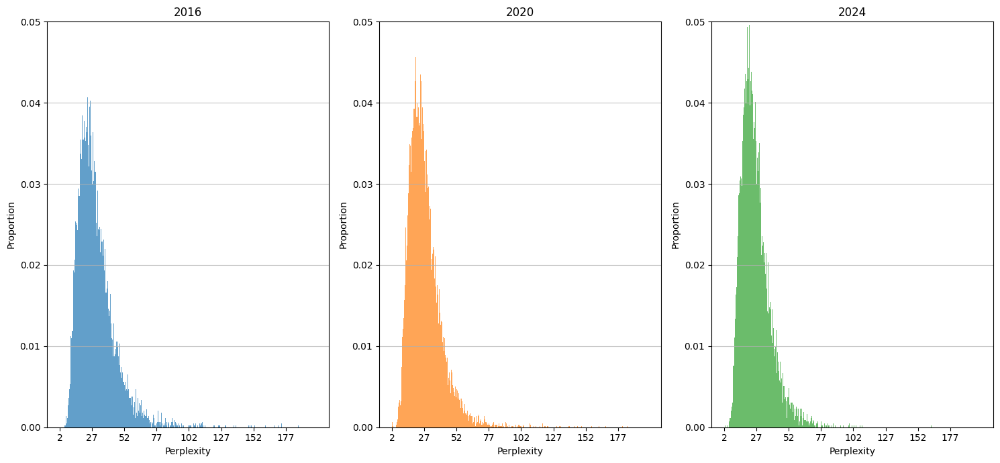

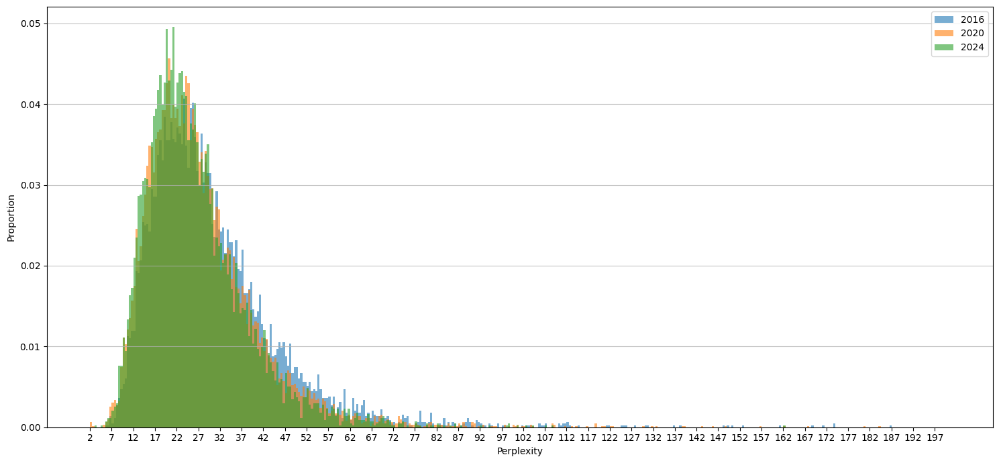

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_pubmed_2016, ppl_list_pubmed_2020, ppl_list_pubmed_2024],
    labels=labels,
    bin_width=0.5,
    figsize=(15, 7)
    )

#### Wikipedia

In [ ]:
with open("ppl_list_wiki_2024.json", "r") as f:
  ppl_list_wiki_2024 = json.load(f)
with open("ppl_list_wiki_2022.json", "r") as f:
  ppl_list_wiki_2022 = json.load(f)
with open("ppl_list_wiki_2020.json", "r") as f:
  ppl_list_wiki_2020 = json.load(f)
with open("ppl_list_wiki_2018.json", "r") as f:
  ppl_list_wiki_2018 = json.load(f)
with open("ppl_list_wiki_2016.json", "r") as f:
  ppl_list_wiki_2016 = json.load(f)
with open("ppl_list_wiki_2014.json", "r") as f:
  ppl_list_wiki_2014 = json.load(f)

In [ ]:
# load ppl list 2024
with open("ppl_list_wiki_20241215.json", "r") as ppl_20241215:
  ppl_list_wiki_20241215 = json.load(ppl_20241215)
with open("ppl_list_wiki_20240615.json", "r") as ppl_20240615:
  ppl_list_wiki_20240615 = json.load(ppl_20240615)
ppl_list_wiki_2024 = []
ppl_list_wiki_2024.extend(ppl_list_wiki_20241215)
ppl_list_wiki_2024.extend(ppl_list_wiki_20240615)
len(ppl_list_wiki_2024)
with open("ppl_list_wiki_2024.json", "w") as f:
  json.dump(ppl_list_wiki_2024, f)

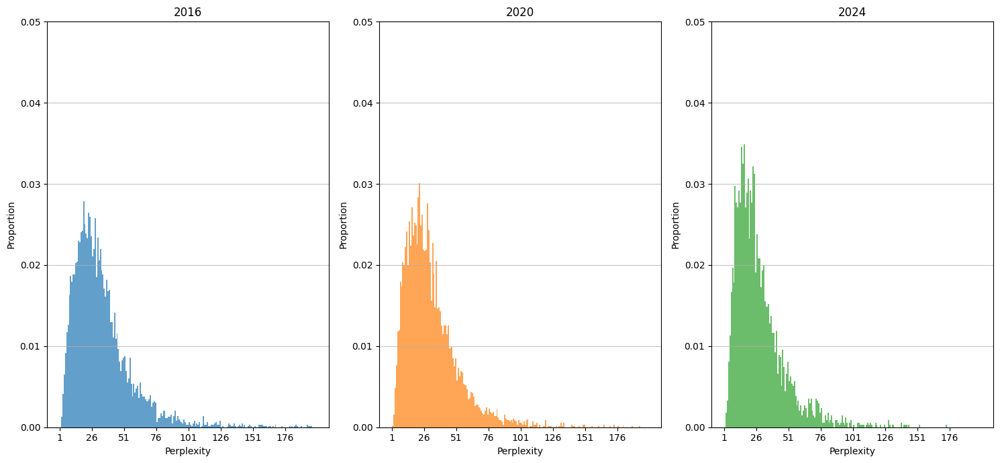

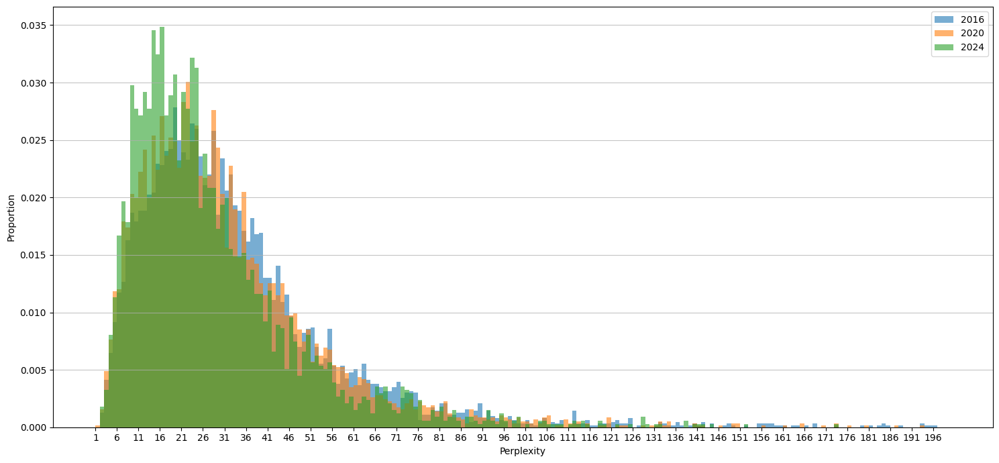

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_stack_2016, ppl_list_stack_2020, ppl_list_stack_2024],
    labels=labels,
    bin_width=1,
    figsize=(15, 7)
    )

####STack

In [ ]:
with open("ppl_list_stack_2024.json", "r") as f:
  ppl_list_stack_2024 = json.load(f)
with open("ppl_list_stack_2022.json", "r") as f:
  ppl_list_stack_2022 = json.load(f)
with open("ppl_list_stack_2020.json", "r") as f:
  ppl_list_stack_2020 = json.load(f)
with open("ppl_list_stack_2018.json", "r") as f:
  ppl_list_stack_2018 = json.load(f)
with open("ppl_list_stack_2016.json", "r") as f:
  ppl_list_stack_2016 = json.load(f)
with open("ppl_list_stack_2014.json", "r") as f:
  ppl_list_stack_2014 = json.load(f)

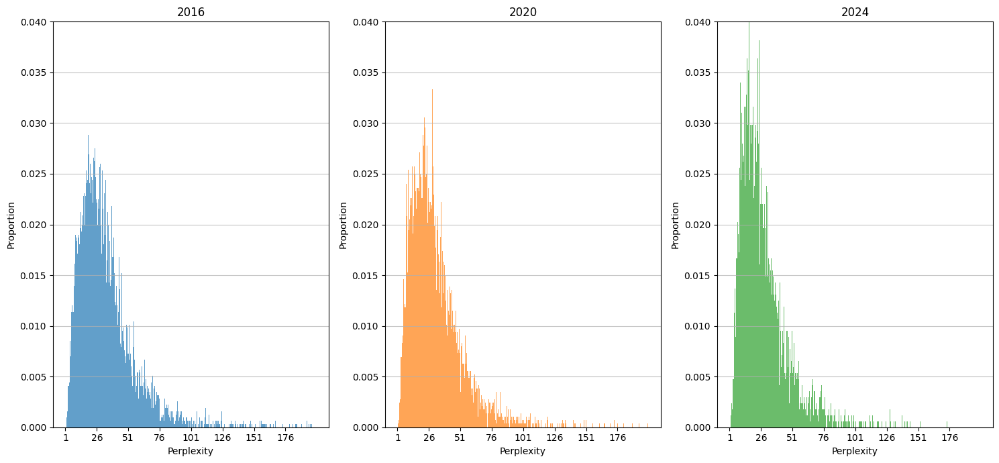

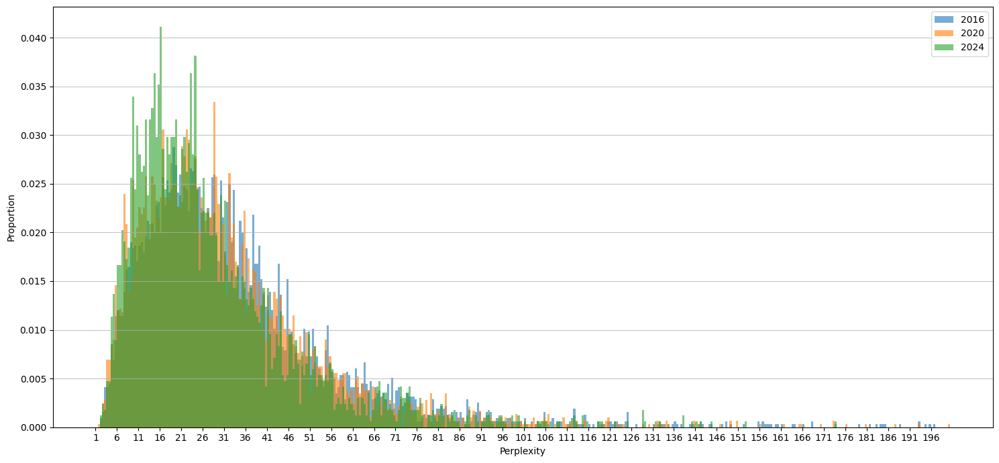

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_stack_2016, ppl_list_stack_2020, ppl_list_stack_2024],
    labels=labels,
    bin_width=0.5,
    figsize=(15, 7)
    )

###Plot median line graphs

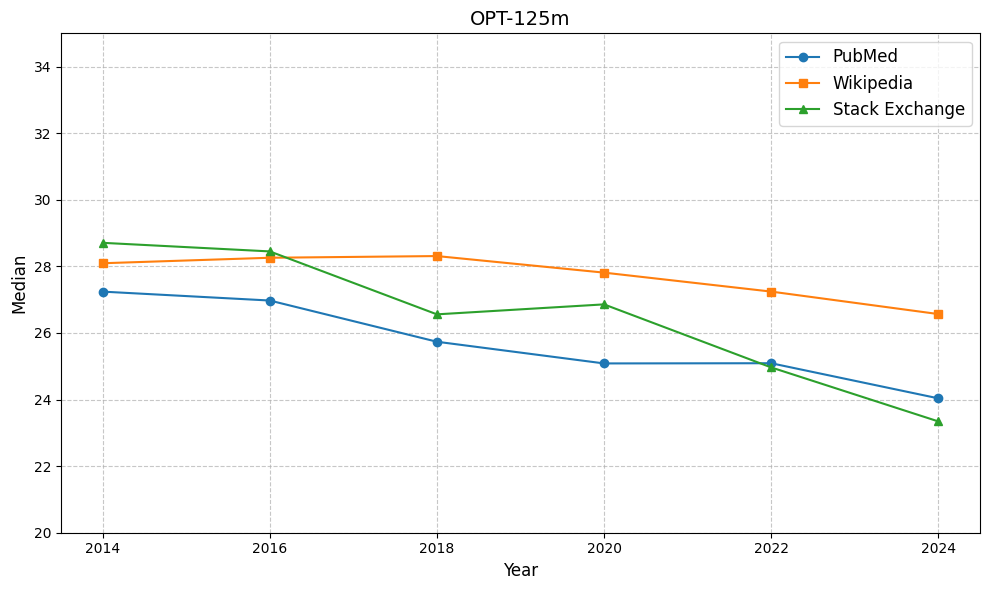

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for each group
group1 = [27.2418527736125, 26.9743032597857, 25.7365993054511, 25.0851094902009, 25.0910760027012, 24.0369419779099]  # Medians for group 1
group2 = [28.0942913680863, 28.2591241071601, 28.3099078594164, 27.8125268941113, 27.2430938746485, 26.5681664826747]  # Medians for group 2
group3 = [28.7075927433344, 28.449700040112, 26.5593189695886, 26.8587901503167, 24.9658031203915, 23.3444062516365]  # Medians for group 3

# Years corresponding to each data point
years = [2014, 2016, 2018, 2020, 2022, 2024]

# Create the figure and axis
plt.figure(figsize=(10, 6))

# Plot each group
plt.plot(years, group1, marker='o', linestyle='-', label='PubMed')
plt.plot(years, group2, marker='s', linestyle='-', label='Wikipedia')
plt.plot(years, group3, marker='^', linestyle='-', label='Stack Exchange')

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Median', fontsize=12)
plt.title('OPT-125m', fontsize=14)

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to show only the years with data
plt.xticks(years)

# Set y-axis limits
plt.ylim(20, 35)

# Add legend
plt.legend(fontsize=12)

# Display the plot
plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

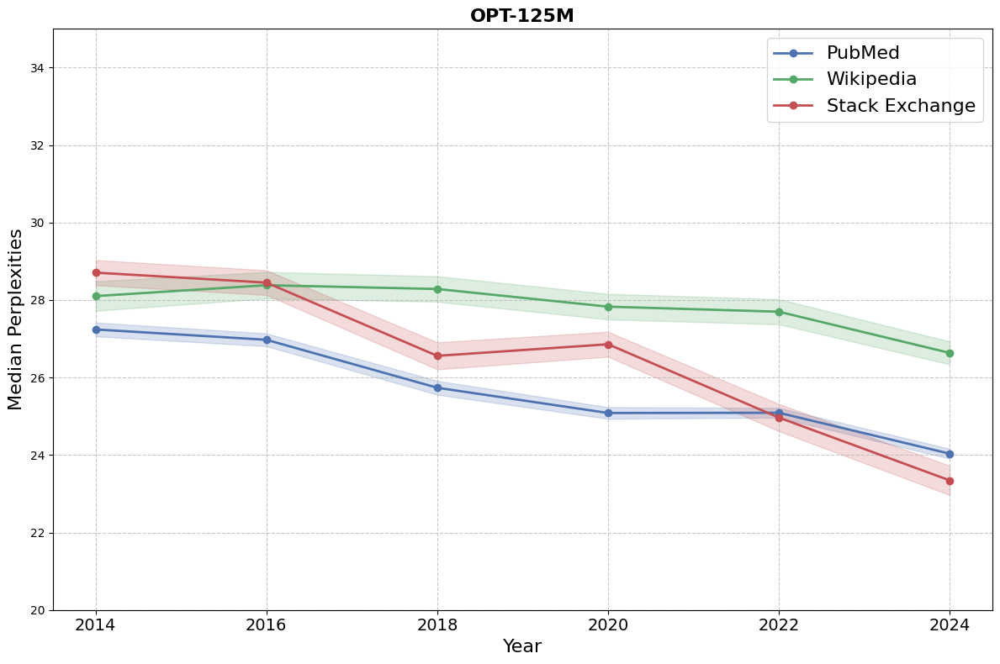

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ppl_list_pubmed_2014
group1_2016 = ppl_list_pubmed_2016
group1_2018 = ppl_list_pubmed_2018
group1_2020 = ppl_list_pubmed_2020
group1_2022 = ppl_list_pubmed_2022
group1_2024 = ppl_list_pubmed_2024

group2_2014 = ppl_list_wiki_2014
group2_2016 = ppl_list_wiki_2016
group2_2018 = ppl_list_wiki_2018
group2_2020 = ppl_list_wiki_2020
group2_2022 = ppl_list_wiki_2022
group2_2024 = ppl_list_wiki_2024

group3_2014 = ppl_list_stack_2014
group3_2016 = ppl_list_stack_2016
group3_2018 = ppl_list_stack_2018
group3_2020 = ppl_list_stack_2020
group3_2022 = ppl_list_stack_2022
group3_2024 = ppl_list_stack_2024

# Organize data into groups and years
groups = {
    "PubMed": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed": "#4C72B0",  # Blue
    "Wikipedia": "#55A868",  # Green
    "Stack Exchange": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median Perplexities', fontsize=16)
ax.set_title('OPT-125M', fontsize=16, fontweight='bold')
ax.set_ylim(20,35)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

<Figure size 1200x800 with 0 Axes>

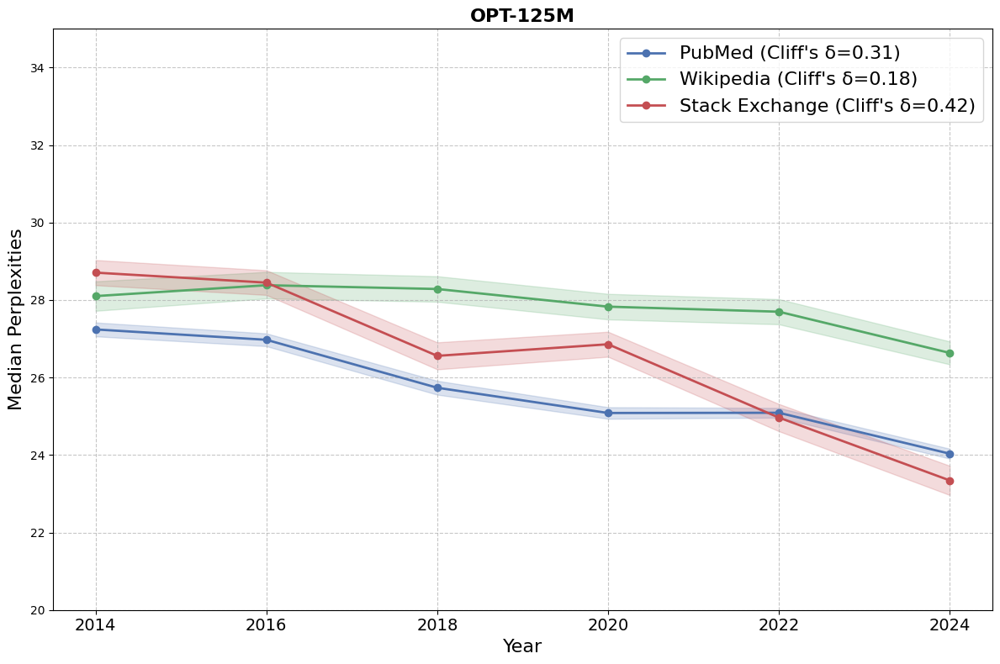

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ppl_list_pubmed_2014
group1_2016 = ppl_list_pubmed_2016
group1_2018 = ppl_list_pubmed_2018
group1_2020 = ppl_list_pubmed_2020
group1_2022 = ppl_list_pubmed_2022
group1_2024 = ppl_list_pubmed_2024

group2_2014 = ppl_list_wiki_2014
group2_2016 = ppl_list_wiki_2016
group2_2018 = ppl_list_wiki_2018
group2_2020 = ppl_list_wiki_2020
group2_2022 = ppl_list_wiki_2022
group2_2024 = ppl_list_wiki_2024

group3_2014 = ppl_list_stack_2014
group3_2016 = ppl_list_stack_2016
group3_2018 = ppl_list_stack_2018
group3_2020 = ppl_list_stack_2020
group3_2022 = ppl_list_stack_2022
group3_2024 = ppl_list_stack_2024

# Organize data into groups and years
groups = {
    "PubMed (Cliff's δ=0.31)": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia (Cliff's δ=0.18)": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange (Cliff's δ=0.42)": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed (Cliff's δ=0.31)": "#4C72B0",  # Blue
    "Wikipedia (Cliff's δ=0.18)": "#55A868",  # Green
    "Stack Exchange (Cliff's δ=0.42)": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median Perplexities', fontsize=16)
ax.set_title('OPT-125M', fontsize=16, fontweight='bold')
ax.set_ylim(20,35)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# p-for trend
import numpy as np
import scipy.stats as stats

medians_pubmed = [27.2418527736125, 26.9743032597857, 25.7365993054511, 25.0851094902009, 25.0910760027012, 24.0369419779099]  # Medians for group 1
medians_wiki = [28.101971915091408, 28.382812962877207, 28.28521633786738, 27.82959115207527, 27.69866769647994, 26.6355732575745]  # Medians for group 2
medians_stack = [28.7075927433344, 28.449700040112, 26.5593189695886, 26.8587901503167, 24.9658031203915, 23.3444062516365]  # Medians for group 3

# Years corresponding to each data point
years = [2014, 2016, 2018, 2020, 2022, 2024]

In [ ]:
#p-for trend for pubmed
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_pubmed)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.942857
P-value for monotonic trend: 0.004805


In [ ]:
#p-for trend for wiki
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_wiki)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.828571
P-value for monotonic trend: 0.041563


In [ ]:
#p-for trend for stack
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_stack)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.942857
P-value for monotonic trend: 0.004805


### Mixed-effects regression model

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.regression.mixed_linear_model import MixedLM
import matplotlib.pyplot as plt
import seaborn as sns


# Create a function to generate a dataframe from your data
def create_regression_df(data_dict):
    """
    Convert your dictionary of perplexity scores to a pandas DataFrame.

    Parameters:
    data_dict: Dictionary with years as keys and lists of perplexity scores as values
    platform: Name of the platform (PubMed, Wikipedia, StackExchange)

    Returns:
    DataFrame with columns: year, perplexity_score, platform
    """
    rows = []

    for platform_name, platform_data in data_dict.items():
        for year, scores in platform_data.items():
            for score in scores:
                rows.append({
                    'year': int(year),
                    'perplexity_score': float(score),
                    'platform': platform_name
                })

    return pd.DataFrame(rows)

# Example data structure
data_dict = {
    'PubMed': {

    },
    'Wikipedia': {

    },
    'StackExchange': {

    }
}

data_dict['PubMed'][2014] = ppl_list_pubmed_2014
data_dict['PubMed'][2016] = ppl_list_pubmed_2016
data_dict['PubMed'][2018] = ppl_list_pubmed_2018
data_dict['PubMed'][2020] = ppl_list_pubmed_2020
data_dict['PubMed'][2022] = ppl_list_pubmed_2022
data_dict['PubMed'][2024] = ppl_list_pubmed_2024
data_dict['Wikipedia'][2014] = ppl_list_wiki_2014
data_dict['Wikipedia'][2016] = ppl_list_wiki_2016
data_dict['Wikipedia'][2018] = ppl_list_wiki_2018
data_dict['Wikipedia'][2020] = ppl_list_wiki_2020
data_dict['Wikipedia'][2022] = ppl_list_wiki_2022
data_dict['Wikipedia'][2024] = ppl_list_wiki_2024
data_dict['StackExchange'][2014] = ppl_list_stack_2014
data_dict['StackExchange'][2016] = ppl_list_stack_2016
data_dict['StackExchange'][2018] = ppl_list_stack_2018
data_dict['StackExchange'][2020] = ppl_list_stack_2020
data_dict['StackExchange'][2022] = ppl_list_stack_2022
data_dict['StackExchange'][2024] = ppl_list_stack_2024

# Create DataFrame
df = create_regression_df(data_dict)

# 1. Mixed-effects model
# Center the year variable around 2014 for easier interpretation
df['year_centered'] = df['year'] - 2014

# Fit mixed-effects model
model = smf.mixedlm("perplexity_score ~ year_centered",
                    data=df,
                    groups=df["platform"])
result = model.fit()
print(result.summary())

# To see platform-specific effects
platforms = df['platform'].unique()
for platform in platforms:
    platform_data = df[df['platform'] == platform]
    platform_model = sm.OLS.from_formula("perplexity_score ~ year_centered", data=platform_data)
    platform_result = platform_model.fit()
    print(f"\nResults for {platform}:")
    print(platform_result.summary().tables[1])

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


            Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: perplexity_score
No. Observations: 111110  Method:             REML            
No. Groups:       3       Scale:              374.1309        
Min. group size:  23991   Log-Likelihood:     -486809.7796    
Max. group size:  56005   Converged:          Yes             
Mean group size:  37036.7                                     
---------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|  [0.025  0.975]
---------------------------------------------------------------
Intercept      32.837     1.228   26.736  0.000  30.430  35.244
year_centered  -0.381     0.018  -21.540  0.000  -0.416  -0.347
Group Var       4.491     0.240                                


Results for PubMed:
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
In

## gpt-2

In [ ]:
model_id = 'openai-community/gpt2'

### Pubmed

In [ ]:
# 2024
results_m2_pubmed_2024 = calculate_perplexity_simple(model_id, abs_list_2024)
ppl_list_m2_pubmed_2024 = []
for text, ppl in results_m2_pubmed_2024.items():
    ppl_list_m2_pubmed_2024.append(ppl)

with open("ppl_list_m2_pubmed_2024.json", "w") as f:
  json.dump(ppl_list_m2_pubmed_2024, f)

Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

In [ ]:
print("Total number of data points:", len(ppl_list_m2_pubmed_2024))
print("Avg of ppl:", sum(ppl_list_m2_pubmed_2024)/len(ppl_list_m2_pubmed_2024))
print("Med of ppl:", statistics.median(ppl_list_m2_pubmed_2024))

Total number of data points: 8672
Avg of ppl: 25.41430969433071
Med of ppl: 22.949775941286617


#### Plot

In [ ]:
with open("ppl_list_m2_pubmed_2024.json", "r") as f:
  ppl_list_m2_pubmed_2024 = json.load(f)
with open("ppl_list_m2_pubmed_2022.json", "r") as f:
  ppl_list_m2_pubmed_2022 = json.load(f)
with open("ppl_list_m2_pubmed_2020.json", "r") as f:
  ppl_list_m2_pubmed_2020 = json.load(f)
with open("ppl_list_m2_pubmed_2018.json", "r") as f:
  ppl_list_m2_pubmed_2018 = json.load(f)
with open("ppl_list_m2_pubmed_2016.json", "r") as f:
  ppl_list_m2_pubmed_2016 = json.load(f)
with open("ppl_list_m2_pubmed_2014.json", "r") as f:
  ppl_list_m2_pubmed_2014 = json.load(f)
print(len(ppl_list_m2_pubmed_2024))
print(len(ppl_list_m2_pubmed_2022))
print(len(ppl_list_m2_pubmed_2020))
print(len(ppl_list_m2_pubmed_2018))
print(len(ppl_list_m2_pubmed_2016))
print(len(ppl_list_m2_pubmed_2014))

8672
12957
11874
6884
8903
6715


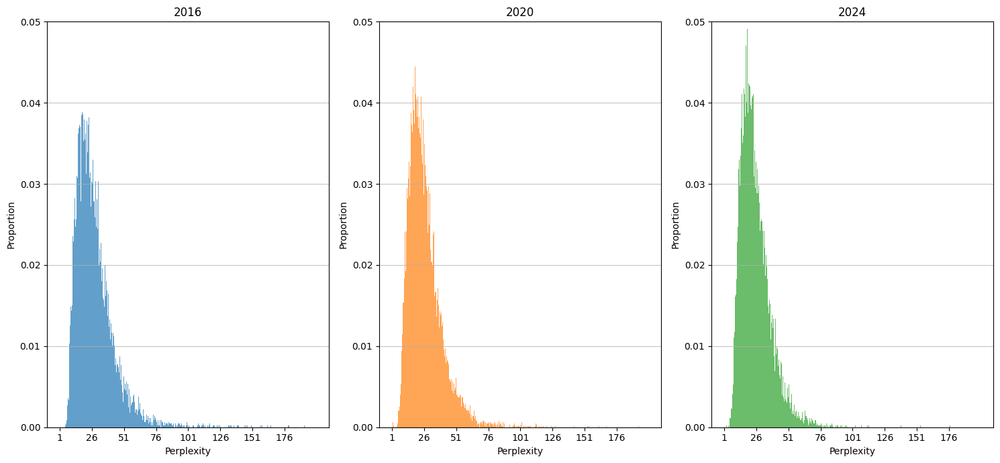

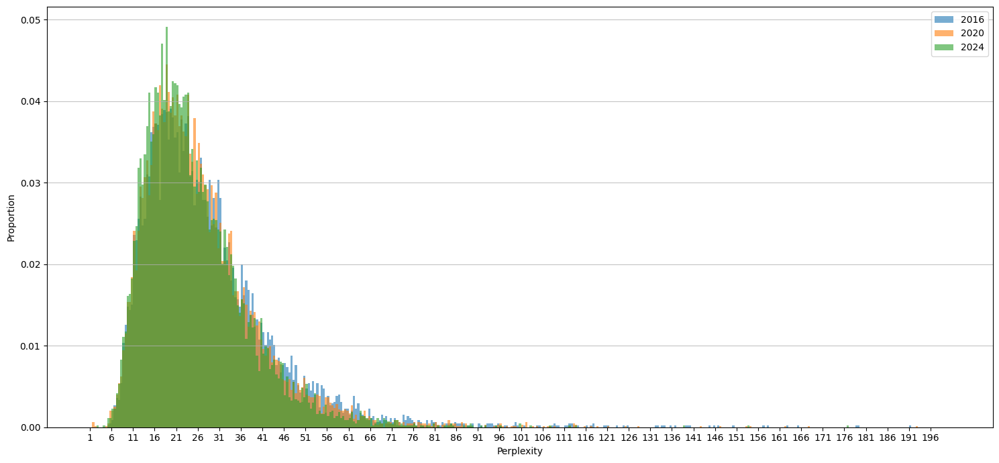

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_m2_pubmed_2016, ppl_list_m2_pubmed_2020, ppl_list_m2_pubmed_2024],
    labels=labels,
    bin_width=0.5,
    figsize=(15, 7)
    )

### Wikipedia

####merge ppl list

#####2024

In [ ]:
# 20241215
results_m2_wiki_20241215 = calculate_perplexity_simple(model_id, wiki_list_20241215)
ppl_list_m2_wiki_20241215 = []
for text, ppl in results_m2_wiki_20241215.items():
    ppl_list_m2_wiki_20241215.append(ppl)
print("Avg of ppl:", sum(ppl_list_m2_wiki_20241215)/len(ppl_list_m2_wiki_20241215))
print("Med of ppl:", statistics.median(ppl_list_m2_wiki_20241215))

with open("ppl_list_m2_wiki_20241215.json", "w") as f:
  json.dump(ppl_list_m2_wiki_20241215, f)

Environment fixed successfully
Avg of ppl: 36.135949008668426
Med of ppl: 30.915064168552156


In [ ]:
# 20240615
results_m2_wiki_20240615 = calculate_perplexity_simple(model_id, wiki_list_20240615)
ppl_list_m2_wiki_20240615 = []
for text, ppl in results_m2_wiki_20240615.items():
    ppl_list_m2_wiki_20240615.append(ppl)
print("Avg of ppl:", sum(ppl_list_m2_wiki_20240615)/len(ppl_list_m2_wiki_20240615))
print("Med of ppl:", statistics.median(ppl_list_m2_wiki_20240615))

with open("ppl_list_m2_wiki_20240615.json", "w") as f:
  json.dump(ppl_list_m2_wiki_20240615, f)

Environment fixed successfully
Avg of ppl: 36.456620392090706
Med of ppl: 30.47186870497158


In [ ]:
ppl_list_m2_wiki_2024 = ppl_list_m2_wiki_20241215 + ppl_list_m2_wiki_20240615
with open("ppl_list_m2_wiki_2024.json", "w") as f:
  json.dump(ppl_list_m2_wiki_2024, f)

In [ ]:
print("Avg of ppl:", sum(ppl_list_m2_wiki_2024)/len(ppl_list_m2_wiki_2024))
print("Med of ppl:", statistics.median(ppl_list_m2_wiki_2024))

Avg of ppl: 36.29628470037955
Med of ppl: 30.769900445300138


In [ ]:
ppl_list_m2_wiki_2024 = []
for file in sorted(glob.glob("ppl_list_m2_wiki_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_m2_wiki_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      data_list = json.load(pm)
      ppl_list_m2_wiki_2024.extend(data_list)
with open("ppl_list_m2_wiki_2024.json", "w") as f:
  json.dump(ppl_list_m2_wiki_2024, f)
with open("ppl_list_m2_wiki_2024.json", "r") as f:
  data = json.load(f)
print("Avg:", sum(data)/len(data))
print("Med :", statistics.median(data))
print(len(data))

**********Processing file ppl_list_m2_wiki_202415.json ************
**********Processing file ppl_list_m2_wiki_20240630.json ************
**********Processing file ppl_list_m2_wiki_20241230.json ************
Avg: 36.98627152537355
Med : 31.072414255927605
4000


In [ ]:
# 2024 06/12 1/5/10/20/25
grand_text_list = []

for file in sorted(glob.glob("wikipedia_2024*.json"), key=numericalSort):
  if file.startswith("wikipedia_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      data_list = json.load(pm)
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
        grand_text_list.append(text)
      results = calculate_perplexity_simple(model_id, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
      with open("ppl_list_m2_wiki_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)

print("Number of pages:", len(grand_text_list))


**********Processing file wikipedia_20240601.json ************
Environment fixed successfully


model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

**********Processing file wikipedia_20240605.json ************
Environment fixed successfully
**********Processing file wikipedia_20240610.json ************
Environment fixed successfully
**********Processing file wikipedia_20240620.json ************
Environment fixed successfully
**********Processing file wikipedia_20240625.json ************
Environment fixed successfully
**********Processing file wikipedia_20241201.json ************
Environment fixed successfully
**********Processing file wikipedia_20241205.json ************
Environment fixed successfully
**********Processing file wikipedia_20241210.json ************
Environment fixed successfully
**********Processing file wikipedia_20241220.json ************
Environment fixed successfully
**********Processing file wikipedia_20241225.json ************
Environment fixed successfully
Number of pages: 10000


#### Plot

In [ ]:
with open("ppl_list_m2_wiki_2024.json", "r") as f:
  ppl_list_m2_wiki_2024 = json.load(f)
with open("ppl_list_m2_wiki_2022.json", "r") as f:
  ppl_list_m2_wiki_2022 = json.load(f)
with open("ppl_list_m2_wiki_2020.json", "r") as f:
  ppl_list_m2_wiki_2020 = json.load(f)
with open("ppl_list_m2_wiki_2018.json", "r") as f:
  ppl_list_m2_wiki_2018 = json.load(f)
with open("ppl_list_m2_wiki_2016.json", "r") as f:
  ppl_list_m2_wiki_2016 = json.load(f)
with open("ppl_list_m2_wiki_2014.json", "r") as f:
  ppl_list_m2_wiki_2014 = json.load(f)
print(len(ppl_list_m2_wiki_2024))
print(len(ppl_list_m2_wiki_2022))
print(len(ppl_list_m2_wiki_2020))
print(len(ppl_list_m2_wiki_2018))
print(len(ppl_list_m2_wiki_2016))
print(len(ppl_list_m2_wiki_2014))

4000
4000
4000
3991
4000
4000


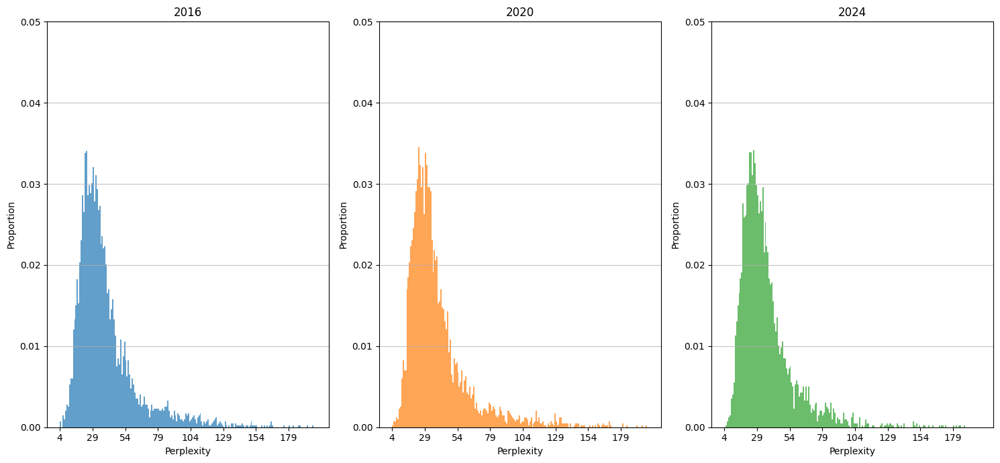

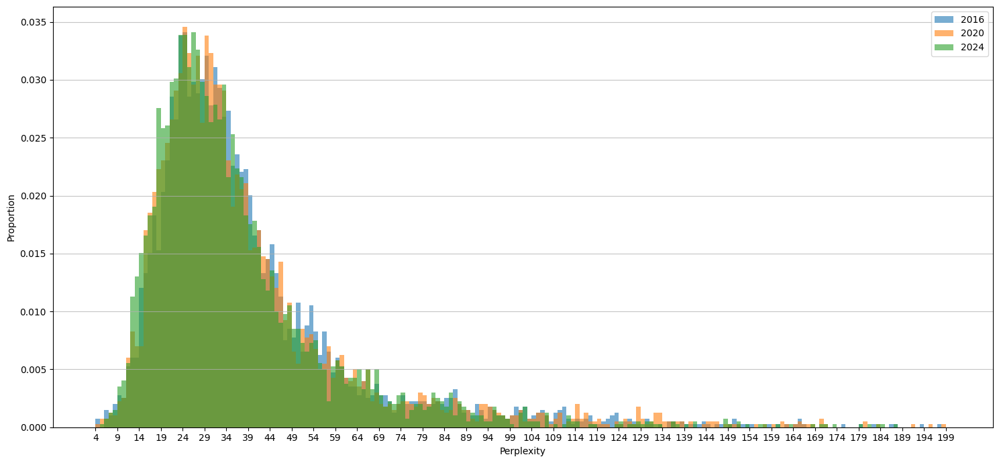

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_m2_wiki_2016, ppl_list_m2_wiki_2020, ppl_list_m2_wiki_2024],
    labels=labels,
    bin_width=1,
    figsize=(15, 7)
    )

###Stack

In [ ]:
for file in sorted(glob.glob("stackexchange_20*.json"), key=numericalSort):
  if file.startswith("stackexchange_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      data_list = json.load(pm)
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
      results = calculate_perplexity_simple(model_id, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
      with open("ppl_list_m2_stack_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)
      print("Number of processed pages:", len(text_list))


**********Processing file stackexchange_20140605.json ************
Environment fixed successfully
Number of processed pages: 1056
**********Processing file stackexchange_20140610.json ************
Environment fixed successfully
Number of processed pages: 1079
**********Processing file stackexchange_20140620.json ************
Environment fixed successfully
Number of processed pages: 1061
**********Processing file stackexchange_20140625.json ************
Environment fixed successfully
Number of processed pages: 1042
**********Processing file stackexchange_20141205.json ************
Environment fixed successfully
Number of processed pages: 1026
**********Processing file stackexchange_20141210.json ************
Environment fixed successfully
Number of processed pages: 1068
**********Processing file stackexchange_20141220.json ************
Environment fixed successfully
Number of processed pages: 904
**********Processing file stackexchange_20141225.json ************
Environment fixed succes

#### List of ppl scores

In [ ]:
with open("ppl_list_m2_stack_2024.json", "r") as f:
  ppl_list_m2_stack_2024 = json.load(f)
with open("ppl_list_m2_stack_2022.json", "r") as f:
  ppl_list_m2_stack_2022 = json.load(f)
with open("ppl_list_m2_stack_2020.json", "r") as f:
  ppl_list_m2_stack_2020 = json.load(f)
with open("ppl_list_m2_stack_2018.json", "r") as f:
  ppl_list_m2_stack_2018 = json.load(f)
with open("ppl_list_m2_stack_2016.json", "r") as f:
  ppl_list_m2_stack_2016 = json.load(f)
with open("ppl_list_m2_stack_2014.json", "r") as f:
  ppl_list_m2_stack_2014 = json.load(f)
print(len(ppl_list_m2_stack_2024))
print(len(ppl_list_m2_stack_2022))
print(len(ppl_list_m2_stack_2020))
print(len(ppl_list_m2_stack_2018))
print(len(ppl_list_m2_stack_2016))
print(len(ppl_list_m2_stack_2014))

3362
4480
5767
5446
6329
5730


In [ ]:
print(statistics.median(ppl_list_m2_stack_2024))
print(statistics.median(ppl_list_m2_stack_2022))
print(statistics.median(ppl_list_m2_stack_2020))
print(statistics.median(ppl_list_m2_stack_2018))
print(statistics.median(ppl_list_m2_stack_2016))
print(statistics.median(ppl_list_m2_stack_2014))

22.00376461407814
23.477666549661436
25.017602989073744
25.06826444736718
27.424640520520118
27.265494952700024


####Plot

In [ ]:
with open("ppl_list_m2_stack_2024.json", "r") as f:
  ppl_list_m2_stack_2024 = json.load(f)
with open("ppl_list_m2_stack_2022.json", "r") as f:
  ppl_list_m2_stack_2022 = json.load(f)
with open("ppl_list_m2_stack_2020.json", "r") as f:
  ppl_list_m2_stack_2020 = json.load(f)
with open("ppl_list_m2_stack_2018.json", "r") as f:
  ppl_list_m2_stack_2018 = json.load(f)
with open("ppl_list_m2_stack_2016.json", "r") as f:
  ppl_list_m2_stack_2016 = json.load(f)
with open("ppl_list_m2_stack_2014.json", "r") as f:
  ppl_list_m2_stack_2014 = json.load(f)

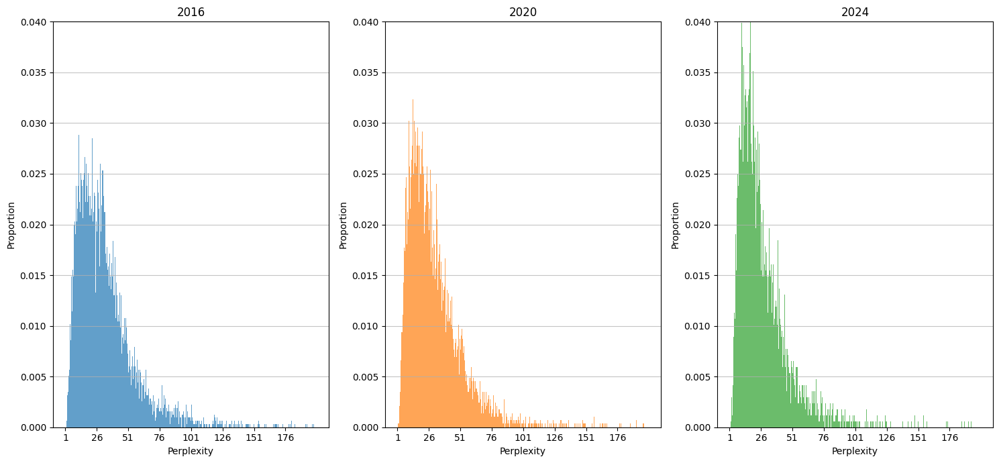

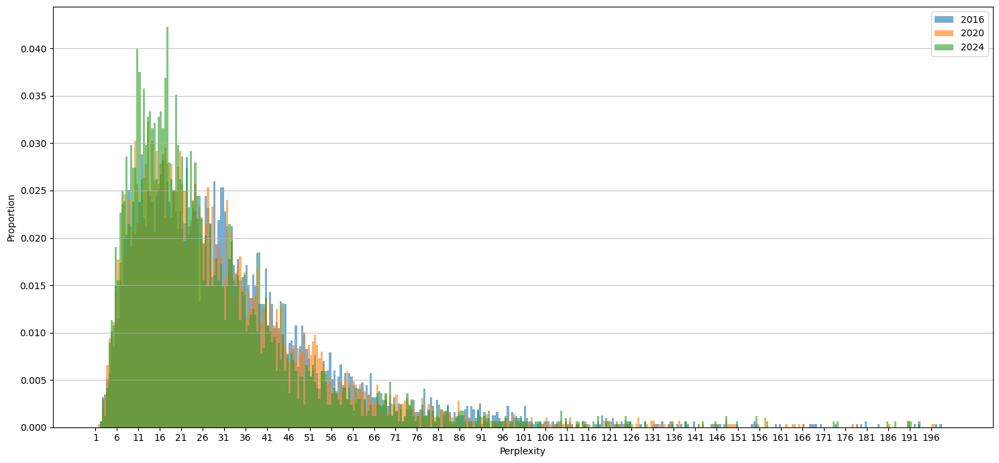

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_m2_stack_2016, ppl_list_m2_stack_2020, ppl_list_m2_stack_2024],
    labels=labels,
    bin_width=0.5,
    figsize=(15, 7)
    )

###Plot median line graphs

<Figure size 1200x800 with 0 Axes>

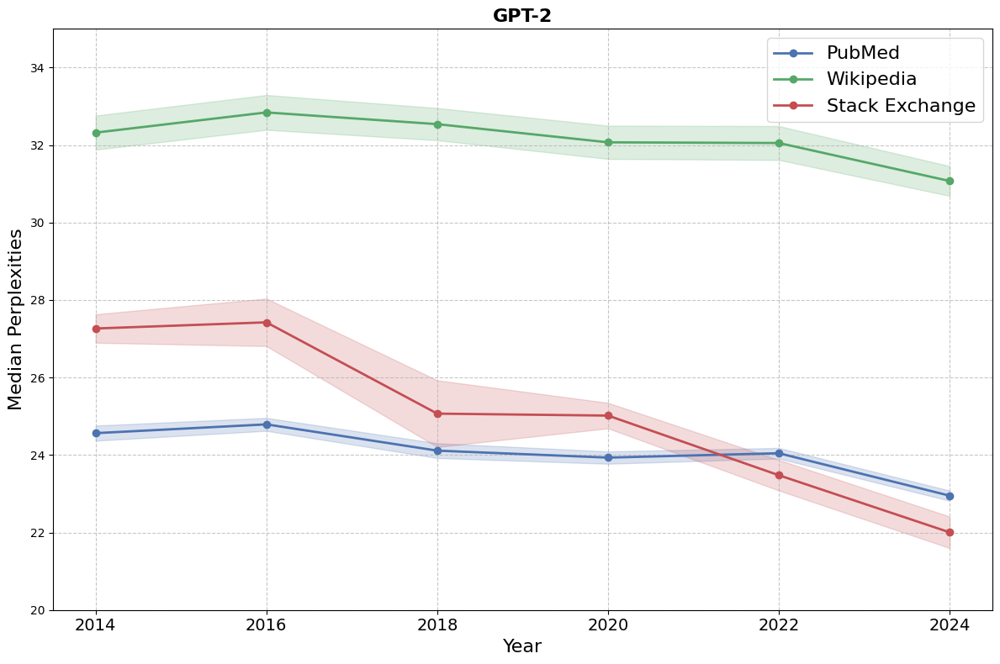

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ppl_list_m2_pubmed_2014
group1_2016 = ppl_list_m2_pubmed_2016
group1_2018 = ppl_list_m2_pubmed_2018
group1_2020 = ppl_list_m2_pubmed_2020
group1_2022 = ppl_list_m2_pubmed_2022
group1_2024 = ppl_list_m2_pubmed_2024

group2_2014 = ppl_list_m2_wiki_2014
group2_2016 = ppl_list_m2_wiki_2016
group2_2018 = ppl_list_m2_wiki_2018
group2_2020 = ppl_list_m2_wiki_2020
group2_2022 = ppl_list_m2_wiki_2022
group2_2024 = ppl_list_m2_wiki_2024

group3_2014 = ppl_list_m2_stack_2014
group3_2016 = ppl_list_m2_stack_2016
group3_2018 = ppl_list_m2_stack_2018
group3_2020 = ppl_list_m2_stack_2020
group3_2022 = ppl_list_m2_stack_2022
group3_2024 = ppl_list_m2_stack_2024

# Organize data into groups and years
groups = {
    "PubMed": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed": "#4C72B0",  # Blue
    "Wikipedia": "#55A868",  # Green
    "Stack Exchange": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median Perplexities', fontsize=16)
ax.set_title('GPT-2', fontsize=16, fontweight='bold')
ax.set_ylim(20,35)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

<Figure size 1200x800 with 0 Axes>

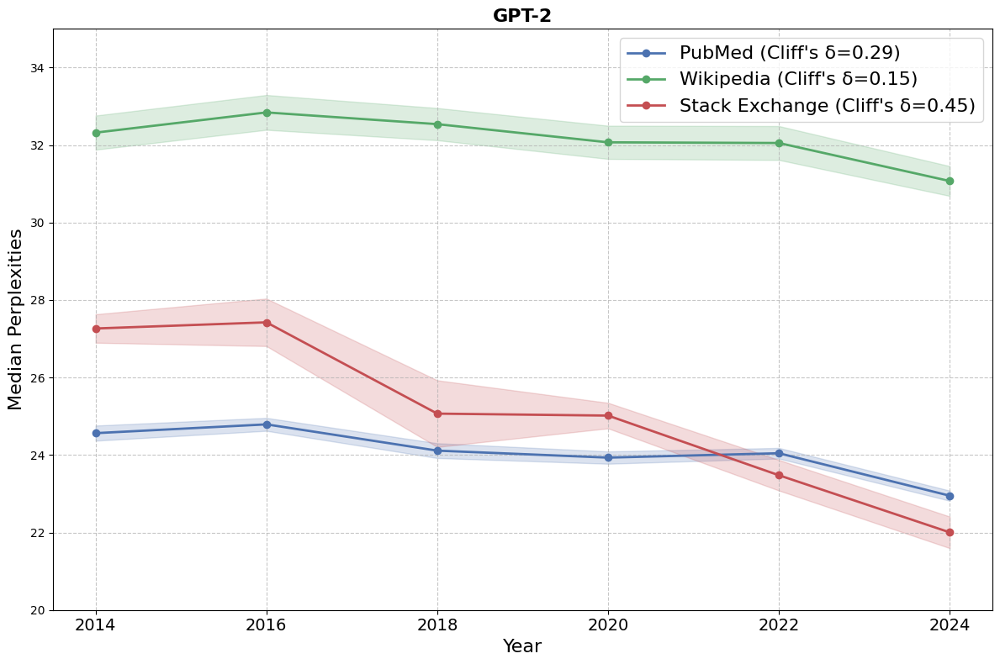

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ppl_list_m2_pubmed_2014
group1_2016 = ppl_list_m2_pubmed_2016
group1_2018 = ppl_list_m2_pubmed_2018
group1_2020 = ppl_list_m2_pubmed_2020
group1_2022 = ppl_list_m2_pubmed_2022
group1_2024 = ppl_list_m2_pubmed_2024

group2_2014 = ppl_list_m2_wiki_2014
group2_2016 = ppl_list_m2_wiki_2016
group2_2018 = ppl_list_m2_wiki_2018
group2_2020 = ppl_list_m2_wiki_2020
group2_2022 = ppl_list_m2_wiki_2022
group2_2024 = ppl_list_m2_wiki_2024

group3_2014 = ppl_list_m2_stack_2014
group3_2016 = ppl_list_m2_stack_2016
group3_2018 = ppl_list_m2_stack_2018
group3_2020 = ppl_list_m2_stack_2020
group3_2022 = ppl_list_m2_stack_2022
group3_2024 = ppl_list_m2_stack_2024

# Organize data into groups and years
groups = {
    "PubMed (Cliff's δ=0.29)": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia (Cliff's δ=0.15)": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange (Cliff's δ=0.45)": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed (Cliff's δ=0.29)": "#4C72B0",  # Blue
    "Wikipedia (Cliff's δ=0.15)": "#55A868",  # Green
    "Stack Exchange (Cliff's δ=0.45)": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median Perplexities', fontsize=16)
ax.set_title('GPT-2', fontsize=16, fontweight='bold')
ax.set_ylim(20,35)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

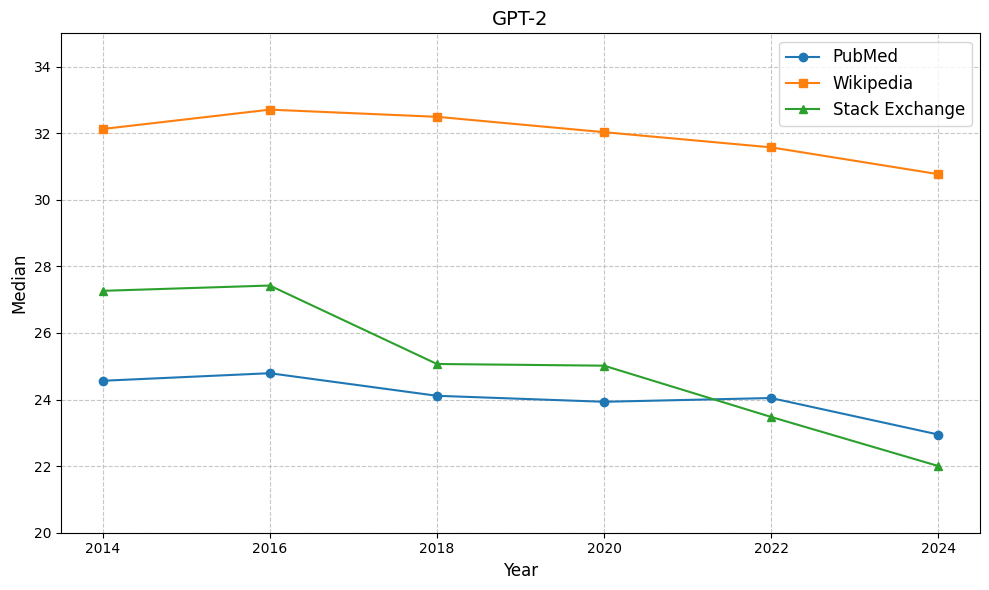

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for each group
group1 = [24.5641949340329, 24.7911656451609, 24.1131081969196, 23.9329777300855, 24.0455512169268, 22.9497759412866]  # Medians for group 1
group2 = [32.1260534837239, 32.7080107859738, 32.4930098119195, 32.0315214931623, 31.5753511209423, 30.7699004453001]  # Medians for group 2
group3 = [27.2654949527, 27.4246405205201, 25.0682644473671, 25.0176029890737, 23.4776665496614, 22.0037646140781]  # Medians for group 3

# Years corresponding to each data point
years = [2014, 2016, 2018, 2020, 2022, 2024]

# Create the figure and axis
plt.figure(figsize=(10, 6))

# Plot each group
plt.plot(years, group1, marker='o', linestyle='-', label='PubMed')
plt.plot(years, group2, marker='s', linestyle='-', label='Wikipedia')
plt.plot(years, group3, marker='^', linestyle='-', label='Stack Exchange')

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Median', fontsize=12)
plt.title('GPT-2', fontsize=14)

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Set y-axis limits
plt.ylim(20, 35)

# Set x-ticks to show only the years with data
plt.xticks(years)

# Add legend
plt.legend(fontsize=12)

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
# p-for trend
# p-for trend
import numpy as np
import scipy.stats as stats

medians_pubmed = [24.5641949340329, 24.7911656451609, 24.1131081969196, 23.9329777300855, 24.0455512169268, 22.9497759412866]  # Medians for group 1
medians_wiki = [32.321540190476256, 32.84314448583885, 32.54055643549639, 32.07130385253507, 32.053511893388475, 31.072414255927605]  # Medians for group 2
medians_stack = [27.2654949527, 27.4246405205201, 25.0682644473671, 25.0176029890737, 23.4776665496614, 22.0037646140781]  # Medians for group 3

# Years corresponding to each data point
years = [2014, 2016, 2018, 2020, 2022, 2024]

In [ ]:
#p-for trend for pubmed
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_pubmed)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.885714
P-value for monotonic trend: 0.018845


In [ ]:
#p-for trend for wiki
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_wiki)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.828571
P-value for monotonic trend: 0.041563


In [ ]:
#p-for trend for stack
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_stack)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.942857
P-value for monotonic trend: 0.004805


### Mixed-effects regression model

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.regression.mixed_linear_model import MixedLM
import matplotlib.pyplot as plt
import seaborn as sns


# Create a function to generate a dataframe from your data
def create_regression_df(data_dict):
    """
    Convert your dictionary of perplexity scores to a pandas DataFrame.

    Parameters:
    data_dict: Dictionary with years as keys and lists of perplexity scores as values
    platform: Name of the platform (PubMed, Wikipedia, StackExchange)

    Returns:
    DataFrame with columns: year, perplexity_score, platform
    """
    rows = []

    for platform_name, platform_data in data_dict.items():
        for year, scores in platform_data.items():
            for score in scores:
                rows.append({
                    'year': int(year),
                    'perplexity_score': float(score),
                    'platform': platform_name
                })

    return pd.DataFrame(rows)

# Example data structure
data_dict = {
    'PubMed': {

    },
    'Wikipedia': {

    },
    'StackExchange': {

    }
}

data_dict['PubMed'][2014] = ppl_list_m2_pubmed_2014
data_dict['PubMed'][2016] = ppl_list_m2_pubmed_2016
data_dict['PubMed'][2018] = ppl_list_m2_pubmed_2018
data_dict['PubMed'][2020] = ppl_list_m2_pubmed_2020
data_dict['PubMed'][2022] = ppl_list_m2_pubmed_2022
data_dict['PubMed'][2024] = ppl_list_m2_pubmed_2024
data_dict['Wikipedia'][2014] = ppl_list_m2_wiki_2014
data_dict['Wikipedia'][2016] = ppl_list_m2_wiki_2016
data_dict['Wikipedia'][2018] = ppl_list_m2_wiki_2018
data_dict['Wikipedia'][2020] = ppl_list_m2_wiki_2020
data_dict['Wikipedia'][2022] = ppl_list_m2_wiki_2022
data_dict['Wikipedia'][2024] = ppl_list_m2_wiki_2024
data_dict['StackExchange'][2014] = ppl_list_m2_stack_2014
data_dict['StackExchange'][2016] = ppl_list_m2_stack_2016
data_dict['StackExchange'][2018] = ppl_list_m2_stack_2018
data_dict['StackExchange'][2020] = ppl_list_m2_stack_2020
data_dict['StackExchange'][2022] = ppl_list_m2_stack_2022
data_dict['StackExchange'][2024] = ppl_list_m2_stack_2024

# Create DataFrame
df = create_regression_df(data_dict)

# 1. Mixed-effects model
# Center the year variable around 2014 for easier interpretation
df['year_centered'] = df['year'] - 2014

# Fit mixed-effects model
model = smf.mixedlm("perplexity_score ~ year_centered",
                    data=df,
                    groups=df["platform"])
result = model.fit()
print(result.summary())

# To see platform-specific effects
platforms = df['platform'].unique()
for platform in platforms:
    platform_data = df[df['platform'] == platform]
    platform_model = sm.OLS.from_formula("perplexity_score ~ year_centered", data=platform_data)
    platform_result = platform_model.fit()
    print(f"\nResults for {platform}:")
    print(platform_result.summary().tables[1])

/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.11/dist-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


            Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: perplexity_score
No. Observations: 111110  Method:             REML            
No. Groups:       3       Scale:              731.0662        
Min. group size:  23991   Log-Likelihood:     -524026.6097    
Max. group size:  56005   Converged:          Yes             
Mean group size:  37036.7                                     
---------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|  [0.025  0.975]
---------------------------------------------------------------
Intercept      34.236     3.294   10.392  0.000  27.779  40.692
year_centered  -0.322     0.025  -12.997  0.000  -0.370  -0.273
Group Var      32.490     1.153                                


Results for PubMed:
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
In

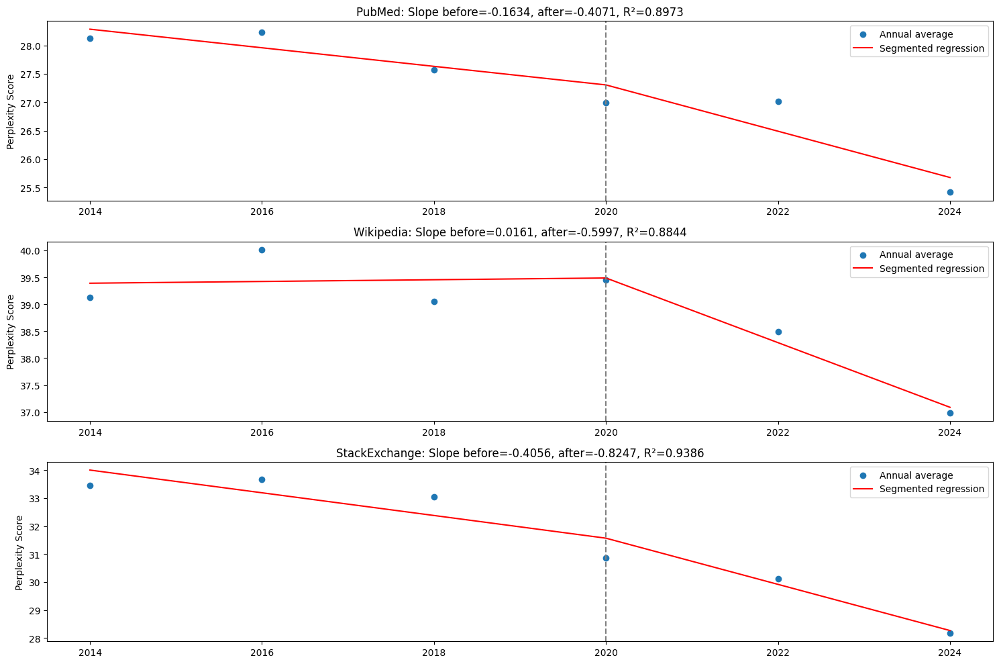

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy import stats

# Function to perform segmented regression
def segmented_regression(x, y, breakpoint):
    """
    Perform segmented regression with one breakpoint.

    Parameters:
    x: Array of x values (years)
    y: Array of y values (perplexity scores)
    breakpoint: The x value where the breakpoint occurs

    Returns:
    Dictionary with regression results
    """
    # Create indicator variables
    x1 = np.array(x)
    x2 = np.maximum(0, np.array(x) - breakpoint)

    # Create design matrix
    X = np.column_stack((np.ones(len(x)), x1, x2))

    # Fit model
    beta, _, _, _ = np.linalg.lstsq(X, y, rcond=None)

    # Calculate predictions
    y_pred = beta[0] + beta[1] * x1 + beta[2] * x2

    # Calculate slope before and after breakpoint
    slope_before = beta[1]
    slope_after = beta[1] + beta[2]

    # Calculate R-squared
    ss_total = np.sum((y - np.mean(y))**2)
    ss_residual = np.sum((y - y_pred)**2)
    r_squared = 1 - (ss_residual / ss_total)

    return {
        'intercept': beta[0],
        'slope_before': slope_before,
        'slope_after': slope_after,
        'r_squared': r_squared,
        'predictions': y_pred
    }

# Group by year and platform to get annual averages
annual_df = df.groupby(['year', 'platform'])['perplexity_score'].agg(
    ['mean', 'median', 'std', 'count']).reset_index()

# Plot and perform segmented regression for each platform
plt.figure(figsize=(15, 10))
breakpoint_year = 2020  # The year you suspect a change occurred

for i, platform in enumerate(platforms, 1):
    platform_data = annual_df[annual_df['platform'] == platform]
    years = platform_data['year'].values
    perplexity = platform_data['mean'].values

    # Perform segmented regression
    seg_reg = segmented_regression(years, perplexity, breakpoint_year)

    # Plot
    plt.subplot(len(platforms), 1, i)
    plt.scatter(years, perplexity, label='Annual average')
    plt.plot(years, seg_reg['predictions'], 'r-', label='Segmented regression')
    plt.axvline(x=breakpoint_year, color='gray', linestyle='--')
    plt.title(f"{platform}: Slope before={seg_reg['slope_before']:.4f}, after={seg_reg['slope_after']:.4f}, R²={seg_reg['r_squared']:.4f}")
    plt.ylabel('Perplexity Score')
    plt.legend()

plt.tight_layout()
plt.savefig('segmented_regression_results.png', dpi=300)
plt.show()

## LLama-3

In [ ]:
os.environ['HF_TOKEN'] = 'enter_your_token'
model_id = 'meta-llama/Llama-3.2-1B-Instruct'
device = "cuda" if torch.cuda.is_available() else "cpu"

### PubMed

In [ ]:
with open("pubmed_abs_list_2024.json", "r") as f:
  pubmed_abs_list_2024 = json.load(f)
with open("pubmed_abs_list_2022.json", "r") as f:
  pubmed_abs_list_2022 = json.load(f)
with open("pubmed_abs_list_2020.json", "r") as f:
  pubmed_abs_list_2020 = json.load(f)
with open("pubmed_abs_list_2018.json", "r") as f:
  pubmed_abs_list_2018 = json.load(f)
with open("pubmed_abs_list_2016.json", "r") as f:
  pubmed_abs_list_2016 = json.load(f)
with open("pubmed_abs_list_2014.json", "r") as f:
  pubmed_abs_list_2014 = json.load(f)

In [ ]:
# 2024
results_m3_pubmed_2024 = calculate_perplexity_simple(model_id, pubmed_abs_list_2024)
ppl_list_m3_pubmed_2024 = []
for text, ppl in results_m3_pubmed_2024.items():
    ppl_list_m3_pubmed_2024.append(ppl)

with open("ppl_list_m3_pubmed_2024.json", "w") as f:
  json.dump(ppl_list_m3_pubmed_2024, f)

Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/54.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/877 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/189 [00:00<?, ?B/s]

### Wikipedia

#### 2024

In [ ]:
# 20241230
results_m3_wiki_20241230 = calculate_perplexity_simple(model_id, wiki_list_20241230)
ppl_list_m3_wiki_20241230 = []
for text, ppl in results_m3_wiki_20241230.items():
    ppl_list_m3_wiki_20241230.append(ppl)
print("Avg of ppl:", sum(ppl_list_m3_wiki_20241230)/len(ppl_list_m3_wiki_20241230))
print("Med of ppl:", statistics.median(ppl_list_m3_wiki_20241230))

with open("ppl_list_m3_wiki_20241230.json", "w") as f:
  json.dump(ppl_list_m3_wiki_20241230, f)

Environment fixed successfully


tokenizer_config.json:   0%|          | 0.00/54.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/296 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/877 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/189 [00:00<?, ?B/s]

Avg of ppl: 13.207000812951811
Med of ppl: 12.078750391890988


In [ ]:
# 20241215
results_m3_wiki_20241215 = calculate_perplexity_simple(model_id, wiki_list_20241215)
ppl_list_m3_wiki_20241215 = []
for text, ppl in results_m3_wiki_20241215.items():
    ppl_list_m3_wiki_20241215.append(ppl)
print("Avg of ppl:", sum(ppl_list_m3_wiki_20241215)/len(ppl_list_m3_wiki_20241215))
print("Med of ppl:", statistics.median(ppl_list_m3_wiki_20241215))

with open("ppl_list_m3_wiki_20241215.json", "w") as f:
  json.dump(ppl_list_m3_wiki_20241215, f)

Environment fixed successfully
Avg of ppl: 12.952221981626522
Med of ppl: 12.014312710398102


In [ ]:
# 20240630
results_m3_wiki_20240630 = calculate_perplexity_simple(model_id, wiki_list_20240630)
ppl_list_m3_wiki_20240630 = []
for text, ppl in results_m3_wiki_20240630.items():
    ppl_list_m3_wiki_20240630.append(ppl)
print("Avg of ppl:", sum(ppl_list_m3_wiki_20240630)/len(ppl_list_m3_wiki_20240630))
print("Med of ppl:", statistics.median(ppl_list_m3_wiki_20240630))

with open("ppl_list_m3_wiki_20240630.json", "w") as f:
  json.dump(ppl_list_m3_wiki_20240630, f)

Environment fixed successfully
Avg of ppl: 13.128166197000532
Med of ppl: 11.781421278169443


In [ ]:
# 20240615
results_m3_wiki_20240615 = calculate_perplexity_simple(model_id, wiki_list_20240615)
ppl_list_m3_wiki_20240615 = []
for text, ppl in results_m3_wiki_20240615.items():
    ppl_list_m3_wiki_20240615.append(ppl)
print("Avg of ppl:", sum(ppl_list_m3_wiki_20240615)/len(ppl_list_m3_wiki_20240615))
print("Med of ppl:", statistics.median(ppl_list_m3_wiki_20240615))

with open("ppl_list_m3_wiki_20240615.json", "w") as f:
  json.dump(ppl_list_m3_wiki_20240615, f)

Environment fixed successfully
Avg of ppl: 12.808237698455258
Med of ppl: 11.768529706544797


In [ ]:
ppl_list_m3_wiki_2024 = []
for file in sorted(glob.glob("ppl_list_m3_wiki_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_m3_wiki_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      data_list = json.load(pm)
      ppl_list_m3_wiki_2024.extend(data_list)
with open("ppl_list_m3_wiki_2024.json", "w") as f:
  json.dump(ppl_list_m3_wiki_2024, f)

data = ppl_list_m3_wiki_2024
print("Med :", statistics.median(data))
print(len(data))

**********Processing file ppl_list_m3_wiki_2024.json ************
**********Processing file ppl_list_m3_wiki_20240615.json ************
**********Processing file ppl_list_m3_wiki_20240630.json ************
**********Processing file ppl_list_m3_wiki_20241215.json ************
**********Processing file ppl_list_m3_wiki_20241230.json ************
Med : 11.90843394721513
8000


### Stack

In [ ]:
# 2024
grand_text_list = []
grand_ppl_list = []

for file in sorted(glob.glob("stackexchange_2024*.json"), key=numericalSort):
  if file.startswith("stackexchange_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      data_list = json.load(pm)
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
        grand_text_list.append(text)
      results = calculate_perplexity_simple(model_id, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
        grand_ppl_list.append(ppl)
      with open("ppl_list_m3_stack_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)

print("Number of pages:", len(grand_text_list))
print("Median ppl:", statistics.median(grand_ppl_list))
with open("ppl_list_m3_stack_2024.json", "w") as f:
  json.dump(grand_ppl_list, f)

**********Processing file stackexchange_20240601.json ************


<>:10: SyntaxWarning: invalid escape sequence '\.'
<>:10: SyntaxWarning: invalid escape sequence '\.'
/tmp/ipython-input-2514455921.py:10: SyntaxWarning: invalid escape sequence '\.'
  fileNum = re.findall('([0-9]{8})\.json',string)[0]


Environment fixed successfully
**********Processing file stackexchange_20240615.json ************
Environment fixed successfully
**********Processing file stackexchange_20240630.json ************
Environment fixed successfully
**********Processing file stackexchange_20241201.json ************
Environment fixed successfully
**********Processing file stackexchange_20241215.json ************
Environment fixed successfully
**********Processing file stackexchange_20241230.json ************
Environment fixed successfully
Number of pages: 3364
Median ppl: 11.483491327638404


### Plot

In [ ]:
with open("ppl_list_m3_pubmed_2014.json", "r") as f:
  ppl_list_m3_pubmed_2014 = json.load(f)
with open("ppl_list_m3_pubmed_2016.json", "r") as f:
  ppl_list_m3_pubmed_2016 = json.load(f)
with open("ppl_list_m3_pubmed_2018.json", "r") as f:
  ppl_list_m3_pubmed_2018 = json.load(f)
with open("ppl_list_m3_pubmed_2020.json", "r") as f:
  ppl_list_m3_pubmed_2020 = json.load(f)
with open("ppl_list_m3_pubmed_2022.json", "r") as f:
  ppl_list_m3_pubmed_2022 = json.load(f)
with open("ppl_list_m3_pubmed_2024.json", "r") as f:
  ppl_list_m3_pubmed_2024 = json.load(f)

with open("ppl_list_m3_wiki_2014.json", "r") as f:
  ppl_list_m3_wiki_2014 = json.load(f)
with open("ppl_list_m3_wiki_2016.json", "r") as f:
  ppl_list_m3_wiki_2016 = json.load(f)
with open("ppl_list_m3_wiki_2018.json", "r") as f:
  ppl_list_m3_wiki_2018 = json.load(f)
with open("ppl_list_m3_wiki_2020.json", "r") as f:
  ppl_list_m3_wiki_2020 = json.load(f)
with open("ppl_list_m3_wiki_2022.json", "r") as f:
  ppl_list_m3_wiki_2022 = json.load(f)
with open("ppl_list_m3_wiki_2024.json", "r") as f:
  ppl_list_m3_wiki_2024 = json.load(f)

with open("ppl_list_m3_stack_2014.json", "r") as f:
  ppl_list_m3_stack_2014 = json.load(f)
with open("ppl_list_m3_stack_2016.json", "r") as f:
  ppl_list_m3_stack_2016 = json.load(f)
with open("ppl_list_m3_stack_2018.json", "r") as f:
  ppl_list_m3_stack_2018 = json.load(f)
with open("ppl_list_m3_stack_2020.json", "r") as f:
  ppl_list_m3_stack_2020 = json.load(f)
with open("ppl_list_m3_stack_2022.json", "r") as f:
  ppl_list_m3_stack_2022 = json.load(f)
with open("ppl_list_m3_stack_2024.json", "r") as f:
  ppl_list_m3_stack_2024 = json.load(f)

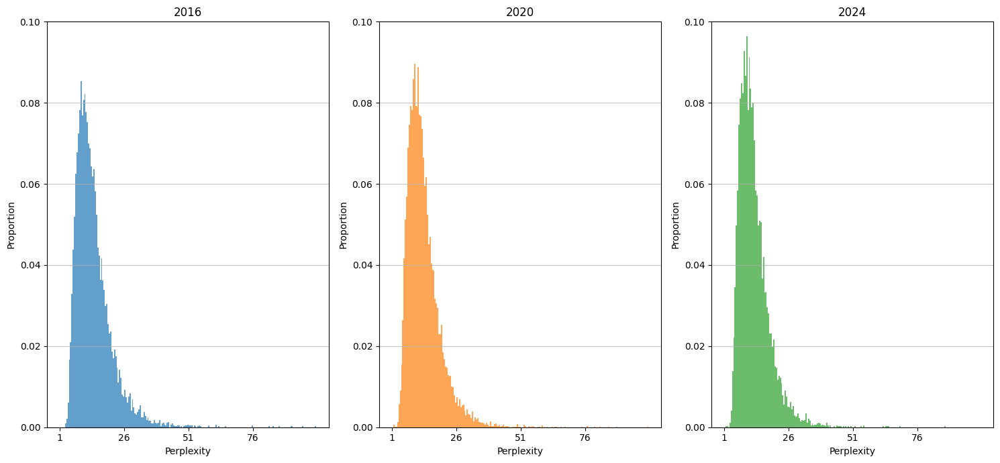

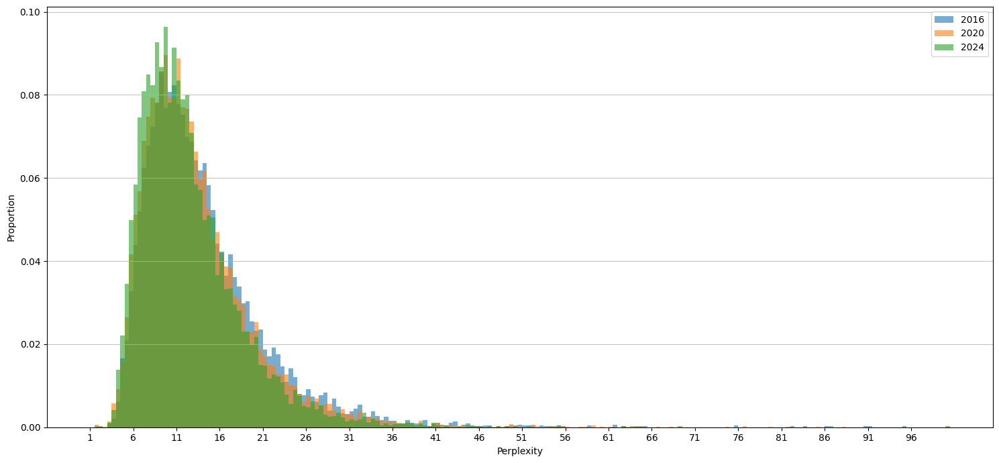

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_m3_pubmed_2016, ppl_list_m3_pubmed_2020, ppl_list_m3_pubmed_2024],
    labels=labels,
    bin_width=0.5,
    figsize=(15, 7)
    )

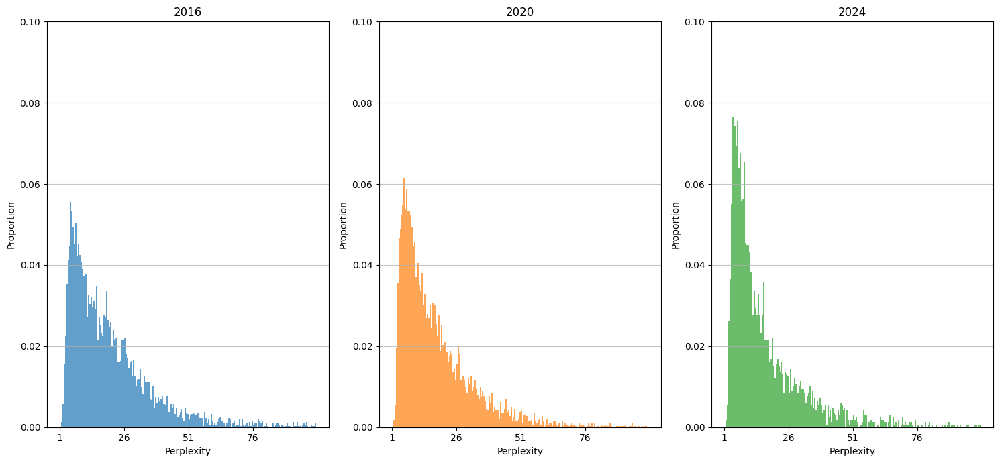

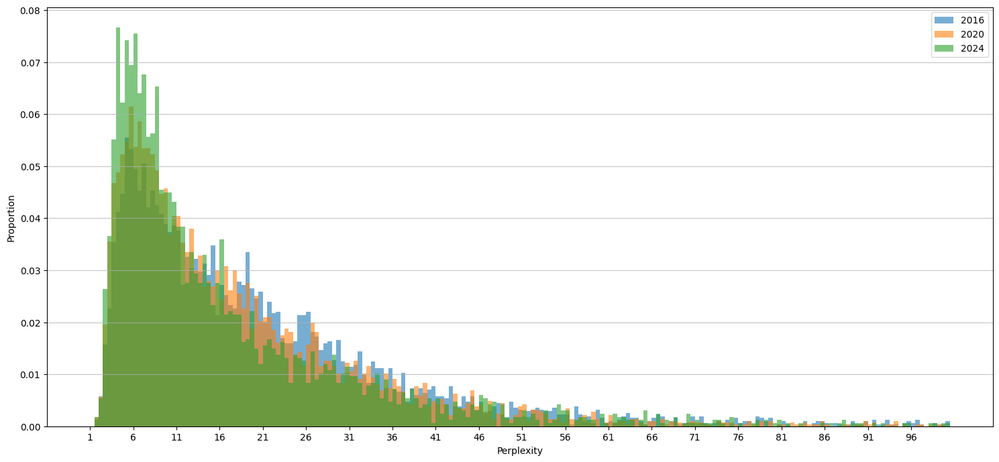

In [ ]:
# total distribution
labels = ["2016", "2020", "2024"]
#colors = ['red', 'magenta', 'yellow', 'green', 'blue', 'purple']
plot_multiple_distributions(
    [ppl_list_m3_stack_2016, ppl_list_m3_stack_2020, ppl_list_m3_stack_2024],
    labels=labels,
    bin_width=0.5,
    figsize=(15, 7)
    )

In [ ]:
# p-for trend
import numpy as np
import scipy.stats as stats

medians_pubmed = []  # Medians for group 1
medians_wiki = []  # Medians for group 2
medians_stack = []  # Medians for group 3

medians_pubmed.append(np.median(ppl_list_m3_pubmed_2014))
medians_pubmed.append(np.median(ppl_list_m3_pubmed_2016))
medians_pubmed.append(np.median(ppl_list_m3_pubmed_2018))
medians_pubmed.append(np.median(ppl_list_m3_pubmed_2020))
medians_pubmed.append(np.median(ppl_list_m3_pubmed_2022))
medians_pubmed.append(np.median(ppl_list_m3_pubmed_2024))

medians_wiki.append(np.median(ppl_list_m3_wiki_2014))
medians_wiki.append(np.median(ppl_list_m3_wiki_2016))
medians_wiki.append(np.median(ppl_list_m3_wiki_2018))
medians_wiki.append(np.median(ppl_list_m3_wiki_2020))
medians_wiki.append(np.median(ppl_list_m3_wiki_2022))
medians_wiki.append(np.median(ppl_list_m3_wiki_2024))

medians_stack.append(np.median(ppl_list_m3_stack_2014))
medians_stack.append(np.median(ppl_list_m3_stack_2016))
medians_stack.append(np.median(ppl_list_m3_stack_2018))
medians_stack.append(np.median(ppl_list_m3_stack_2020))
medians_stack.append(np.median(ppl_list_m3_stack_2022))
medians_stack.append(np.median(ppl_list_m3_stack_2024))

# Years corresponding to each data point
years = [2014, 2016, 2018, 2020, 2022, 2024]

In [ ]:
#p-for trend for pubmed
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_pubmed)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.714286
P-value for monotonic trend: 0.110787


In [ ]:
#p-for trend for wiki
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_wiki)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.771429
P-value for monotonic trend: 0.072397


In [ ]:
#p-for trend for stack
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, medians_stack)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.885714
P-value for monotonic trend: 0.018845


<Figure size 1200x800 with 0 Axes>

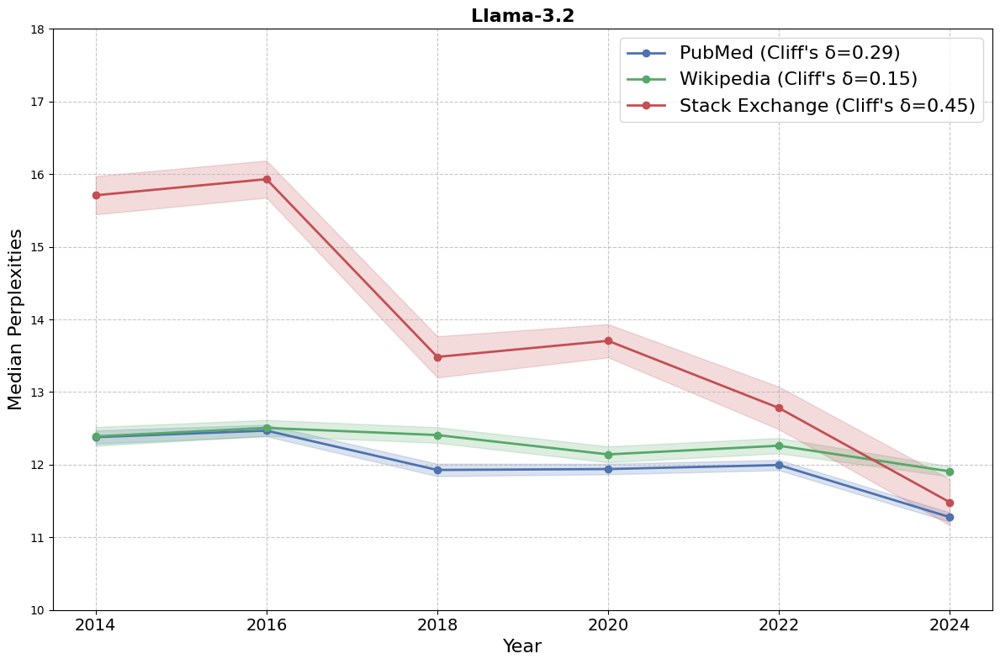

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ppl_list_m3_pubmed_2014
group1_2016 = ppl_list_m3_pubmed_2016
group1_2018 = ppl_list_m3_pubmed_2018
group1_2020 = ppl_list_m3_pubmed_2020
group1_2022 = ppl_list_m3_pubmed_2022
group1_2024 = ppl_list_m3_pubmed_2024

group2_2014 = ppl_list_m3_wiki_2014
group2_2016 = ppl_list_m3_wiki_2016
group2_2018 = ppl_list_m3_wiki_2018
group2_2020 = ppl_list_m3_wiki_2020
group2_2022 = ppl_list_m3_wiki_2022
group2_2024 = ppl_list_m3_wiki_2024

group3_2014 = ppl_list_m3_stack_2014
group3_2016 = ppl_list_m3_stack_2016
group3_2018 = ppl_list_m3_stack_2018
group3_2020 = ppl_list_m3_stack_2020
group3_2022 = ppl_list_m3_stack_2022
group3_2024 = ppl_list_m3_stack_2024

# Organize data into groups and years
groups = {
    "PubMed (Cliff's δ=0.29)": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia (Cliff's δ=0.15)": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange (Cliff's δ=0.45)": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed (Cliff's δ=0.29)": "#4C72B0",  # Blue
    "Wikipedia (Cliff's δ=0.15)": "#55A868",  # Green
    "Stack Exchange (Cliff's δ=0.45)": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median Perplexities', fontsize=16)
ax.set_title('Llama-3.2', fontsize=16, fontweight='bold')
ax.set_ylim(10,18)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

## Binoculars

In [ ]:
model_id1 = 'facebook/opt-125m'
model_id2 = 'openai-community/gpt2'

### Pubmed

#### List of ppl scores

In [ ]:
# 20140630, 20141230, 20160630, 20161230, 20180605, 20180630, 20181230, 20241230
for file in sorted(glob.glob("pubmed_abs_list_20*.json"), key=numericalSort):
  if file.startswith("pubmed_abs_list_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      abs_list = json.load(red)
      results_bin = calculate_binoculars_scores(model_id1, model_id2, abs_list)
      ppl_list_bin = []
      for text, ppl in results_bin.items():
        ppl_list_bin.append(ppl)
      with open("ppl_list_bin_pubmed_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list_bin, f)

**********Processing file pubmed_abs_list_20140630.json ************
Loading model 1: facebook/opt-125m


config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

Streaming output truncated to the last 5000 lines.
Processing text 2592/5090
Text 2592 Binoculars score: 0.3999
Processing text 2593/5090
Text 2593 Binoculars score: 0.2758
Processing text 2594/5090
Text 2594 Binoculars score: 0.4303
Processing text 2595/5090
Text 2595 Binoculars score: 0.3553
Processing text 2596/5090
Text 2596 Binoculars score: 0.2857
Processing text 2597/5090
Text 2597 Binoculars score: 0.3217
Processing text 2598/5090
Text 2598 Binoculars score: 0.2866
Processing text 2599/5090
Text 2599 Binoculars score: 0.3330
Processing text 2600/5090
Text 2600 Binoculars score: 0.2858
Processing text 2601/5090
Text 2601 Binoculars score: 0.3903
Processing text 2602/5090
Text 2602 Binoculars score: 0.3500
Processing text 2603/5090
Text 2603 Binoculars score: 0.3165
Processing text 2604/5090
Text 2604 Binoculars score: 0.2457
Processing text 2605/5090
Text 2605 Binoculars score: 0.4306
Processing text 2606/5090
Text 2606 Binoculars score: 0.4081
Processing text 2607/5090
Text 260

In [ ]:
# Divide pubmed list into 50 units to handle unexpected pause of execution
for file in sorted(glob.glob("pubmed5000_list_20*.json"), key=numericalSort):
  if file.startswith("pubmed5000_list_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      year = re.findall('_([0-9]{4})_([0-9]{3})\.json',string)[0][0]
      fileNum = re.findall('_([0-9]{4})_([0-9]{3})\.json',string)[0][1]
      list_file = json.load(pm)
      ppl_list_100 = []
      print("***Processing", str(year), str(fileNum))
      results_100 = calculate_binoculars_scores(model_id1, model_id2, list_file)
      for text, ppl in results_100.items():
        ppl_list_100.append(ppl)
      with open("ppl_list_bin_pubmed5000_"+str(year)+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list_100, f)


Streaming output truncated to the last 5000 lines.
Processing text 98/100
Text 98 Binoculars score: 0.2967
Processing text 99/100
Text 99 Binoculars score: 0.3920
Processing text 100/100
Text 100 Binoculars score: 0.3284
Successfully processed 98/100 texts
Summary statistics - Median: 0.3540, Mean: 0.3565
**********Processing file pubmed5000_list_2024_027.json ************
***Processing 2024 027
Loading model 1: facebook/opt-125m
Loading model 2: openai-community/gpt2
Model 1 vocabulary size: 50272
Model 2 vocabulary size: 50257
Processing text 1/100
Text 1 Binoculars score: 0.3534
Processing text 2/100
Text 2 Binoculars score: 0.4073
Processing text 3/100
Text 3 Binoculars score: 0.2959
Processing text 4/100
Text 4 Binoculars score: 0.3402
Processing text 5/100
Text 5 Binoculars score: 0.3219
Processing text 6/100
Text 6 Binoculars score: 0.4123
Processing text 7/100
Text 7 Binoculars score: 0.3213
Processing text 8/100
Text 8 Binoculars score: 0.3606
Processing text 9/100
Text 9 Bino

In [ ]:
# 2024
ppl_list_bin_pubmed5000_2024 = []
for file in sorted(glob.glob("ppl_list_bin_pubmed5000_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_bin_pubmed5000_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      ppl_list = json.load(pm)
      ppl_list_bin_pubmed5000_2024.extend(ppl_list)
with open("ppl_list_bin_pubmed5000_2024.json", "w") as f:
  json.dump(ppl_list_bin_pubmed5000_2024, f)

**********Processing file ppl_list_bin_pubmed5000_2024001.json ************
**********Processing file ppl_list_bin_pubmed5000_2024002.json ************
**********Processing file ppl_list_bin_pubmed5000_2024003.json ************
**********Processing file ppl_list_bin_pubmed5000_2024004.json ************
**********Processing file ppl_list_bin_pubmed5000_2024005.json ************
**********Processing file ppl_list_bin_pubmed5000_2024006.json ************
**********Processing file ppl_list_bin_pubmed5000_2024007.json ************
**********Processing file ppl_list_bin_pubmed5000_2024008.json ************
**********Processing file ppl_list_bin_pubmed5000_2024009.json ************
**********Processing file ppl_list_bin_pubmed5000_2024010.json ************
**********Processing file ppl_list_bin_pubmed5000_2024011.json ************
**********Processing file ppl_list_bin_pubmed5000_2024012.json ************
**********Processing file ppl_list_bin_pubmed5000_2024013.json ************
**********Pr

### English Pubmed

*italicized text*####List of ppl scores

In [ ]:
for file in sorted(glob.glob("pubmed5000_eng_list_20*.json"), key=numericalSort):
  if file.startswith("pubmed5000_eng_list_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      print(fileNum)

      text_list = json.load(red)
      results_bin = calculate_binoculars_scores(model_id1, model_id2, text_list)
      ppl_list = []
      for text, ppl in results_bin.items():
        ppl_list.append(ppl)
      with open("ppl_list_bin_pubmed5000_eng_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)



<>:6: SyntaxWarning: invalid escape sequence '\.'
<>:6: SyntaxWarning: invalid escape sequence '\.'
/tmp/ipython-input-2603688337.py:6: SyntaxWarning: invalid escape sequence '\.'
  fileNum = re.findall('([0-9]{8})\.json',string)[0]


Streaming output truncated to the last 5000 lines.
Processing text 719/1672
Text 719 Binoculars score: 0.3590
Processing text 720/1672
Text 720 Binoculars score: 0.3998
Processing text 721/1672
Text 721 Binoculars score: 0.3386
Processing text 722/1672
Text 722 Binoculars score: 0.2448
Processing text 723/1672
Text 723 Binoculars score: 0.2734
Processing text 724/1672
Text 724 Binoculars score: 0.3336
Processing text 725/1672
Text 725 Binoculars score: 0.3968
Processing text 726/1672
Text 726 Binoculars score: 0.3560
Processing text 727/1672
Text 727 Binoculars score: 0.3940
Processing text 728/1672
Text 728 Binoculars score: 0.4109
Processing text 729/1672
Text 729 Binoculars score: 0.3237
Processing text 730/1672
Text 730 Binoculars score: 0.4800
Processing text 731/1672
Text 731 Binoculars score: 0.4854
Processing text 732/1672
Text 732 Binoculars score: 0.3733
Processing text 733/1672
Text 733 Binoculars score: 0.3898
Processing text 734/1672
Text 734 Binoculars score: 0.3175
Proce

In [ ]:
for file in sorted(glob.glob("pubmed5000_noneng_list_20*.json"), key=numericalSort):
  if file.startswith("pubmed5000_noneng_list_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      print(fileNum)

      text_list = json.load(red)
      results_bin = calculate_binoculars_scores(model_id1, model_id2, text_list)
      ppl_list = []
      for text, ppl in results_bin.items():
        ppl_list.append(ppl)
      with open("ppl_list_bin_pubmed5000_noneng_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)


<>:6: SyntaxWarning: invalid escape sequence '\.'
<>:6: SyntaxWarning: invalid escape sequence '\.'
/tmp/ipython-input-2400519863.py:6: SyntaxWarning: invalid escape sequence '\.'
  fileNum = re.findall('([0-9]{8})\.json',string)[0]


**********Processing file pubmed5000_noneng_list_20241215.json ************
20241215
Loading model 1: facebook/opt-125m


config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

Loading model 2: openai-community/gpt2


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Streaming output truncated to the last 5000 lines.
Processing text 798/3296
Text 798 Binoculars score: 0.5540
Processing text 799/3296
Text 799 Binoculars score: 0.4058
Processing text 800/3296
Text 800 Binoculars score: 0.4230
Processing text 801/3296
Text 801 Binoculars score: 0.2135
Processing text 802/3296
Text 802 Binoculars score: 0.3584
Processing text 803/3296
Text 803 Binoculars score: 0.2686
Processing text 804/3296
Text 804 Binoculars score: 0.3284
Processing text 805/3296
Text 805 Binoculars score: 0.3395
Processing text 806/3296
Text 806 Binoculars score: 0.3545
Processing text 807/3296
Text 807 Binoculars score: 0.2710
Processing text 808/3296
Text 808 Binoculars score: 0.3392
Processing text 809/3296
Text 809 Binoculars score: 0.3747
Processing text 810/3296
Text 810 Binoculars score: 0.2969
Processing text 811/3296
Text 811 Binoculars score: 0.2609
Processing text 812/3296
Text 812 Binoculars score: 0.2803
Processing text 813/3296
Text 813 Binoculars score: 0.2007
Proce

In [ ]:
# 2024 eng
ppl_list_bin_pubmed5000_eng_2024 = []
for file in sorted(glob.glob("ppl_list_bin_pubmed5000_eng_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_bin_pubmed5000_eng_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      ppl_list = json.load(pm)
      ppl_list_bin_pubmed5000_eng_2024.extend(ppl_list)
with open("ppl_list_bin_pubmed5000_eng_2024.json", "w") as f:
  json.dump(ppl_list_bin_pubmed5000_eng_2024, f)
print(len(ppl_list_bin_pubmed5000_eng_2024))

**********Processing file ppl_list_bin_pubmed5000_eng_20240615.json ************
**********Processing file ppl_list_bin_pubmed5000_eng_20241215.json ************
1349


In [ ]:
# 2024 noneng
ppl_list_bin_pubmed5000_noneng_2024 = []
for file in sorted(glob.glob("ppl_list_bin_pubmed5000_noneng_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_bin_pubmed5000_noneng_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      ppl_list = json.load(pm)
      ppl_list_bin_pubmed5000_noneng_2024.extend(ppl_list)
with open("ppl_list_bin_pubmed5000_noneng_2024.json", "w") as f:
  json.dump(ppl_list_bin_pubmed5000_noneng_2024, f)
print(len(ppl_list_bin_pubmed5000_noneng_2024))

**********Processing file ppl_list_bin_pubmed5000_noneng_20240615.json ************
**********Processing file ppl_list_bin_pubmed5000_noneng_20241215.json ************
6873


#### Plot

####Check if English-speaking countries' Pubmed is significantly different

In [ ]:
with open("ppl_list_bin_pubmed5000_eng_2024.json", "r") as f:
  ppl_list_bin_pubmed5000_eng_2024 = json.load(f)
with open("ppl_list_bin_pubmed5000_eng_2022.json", "r") as f:
  ppl_list_bin_pubmed5000_eng_2022 = json.load(f)
with open("ppl_list_bin_pubmed5000_eng_2020.json", "r") as f:
  ppl_list_bin_pubmed5000_eng_2020 = json.load(f)
with open("ppl_list_bin_pubmed5000_eng_2018.json", "r") as f:
  ppl_list_bin_pubmed5000_eng_2018 = json.load(f)
with open("ppl_list_bin_pubmed5000_eng_2016.json", "r") as f:
  ppl_list_bin_pubmed5000_eng_2016 = json.load(f)
with open("ppl_list_bin_pubmed5000_eng_2014.json", "r") as f:
  ppl_list_bin_pubmed5000_eng_2014 = json.load(f)
print(len(ppl_list_bin_pubmed5000_eng_2024))
print(len(ppl_list_bin_pubmed5000_eng_2022))
print(len(ppl_list_bin_pubmed5000_eng_2020))
print(len(ppl_list_bin_pubmed5000_eng_2018))
print(len(ppl_list_bin_pubmed5000_eng_2016))
print(len(ppl_list_bin_pubmed5000_eng_2014))

1349
2951
3177
1921
2888
1798


In [ ]:
with open("ppl_list_bin_pubmed5000_noneng_2024.json", "r") as f:
  ppl_list_bin_pubmed5000_noneng_2024 = json.load(f)
with open("ppl_list_bin_pubmed5000_noneng_2022.json", "r") as f:
  ppl_list_bin_pubmed5000_noneng_2022 = json.load(f)
with open("ppl_list_bin_pubmed5000_noneng_2020.json", "r") as f:
  ppl_list_bin_pubmed5000_noneng_2020 = json.load(f)
with open("ppl_list_bin_pubmed5000_noneng_2018.json", "r") as f:
  ppl_list_bin_pubmed5000_noneng_2018 = json.load(f)
with open("ppl_list_bin_pubmed5000_noneng_2016.json", "r") as f:
  ppl_list_bin_pubmed5000_noneng_2016 = json.load(f)
with open("ppl_list_bin_pubmed5000_noneng_2014.json", "r") as f:
  ppl_list_bin_pubmed5000_noneng_2014 = json.load(f)
print(len(ppl_list_bin_pubmed5000_noneng_2024))
print(len(ppl_list_bin_pubmed5000_noneng_2022))
print(len(ppl_list_bin_pubmed5000_noneng_2020))
print(len(ppl_list_bin_pubmed5000_noneng_2018))
print(len(ppl_list_bin_pubmed5000_noneng_2016))
print(len(ppl_list_bin_pubmed5000_noneng_2014))

6873
9253
7827
4390
4917
2932


In [ ]:
def remove_elements(list1, list2):
    # Create a copy of list1 to avoid modifying the original
    result = list1.copy()

    # For each element in list2, remove the first occurrence in result
    for element in list2:
        if element in result:
            result.remove(element)

    return result


In [ ]:
ppl_list_bin_pubmed5000_noneng_2024 = (remove_elements(ppl_list_bin_pubmed5000_2024, ppl_list_bin_pubmed5000_eng_2024))
ppl_list_bin_pubmed5000_noneng_2022 = (remove_elements(ppl_list_bin_pubmed5000_2022, ppl_list_bin_pubmed5000_eng_2022))
ppl_list_bin_pubmed5000_noneng_2020 = (remove_elements(ppl_list_bin_pubmed5000_2020, ppl_list_bin_pubmed5000_eng_2020))
ppl_list_bin_pubmed5000_noneng_2018 = (remove_elements(ppl_list_bin_pubmed5000_2018, ppl_list_bin_pubmed5000_eng_2018))
ppl_list_bin_pubmed5000_noneng_2016 = (remove_elements(ppl_list_bin_pubmed5000_2016, ppl_list_bin_pubmed5000_eng_2016))
ppl_list_bin_pubmed5000_noneng_2014 = (remove_elements(ppl_list_bin_pubmed5000_2014, ppl_list_bin_pubmed5000_eng_2014))

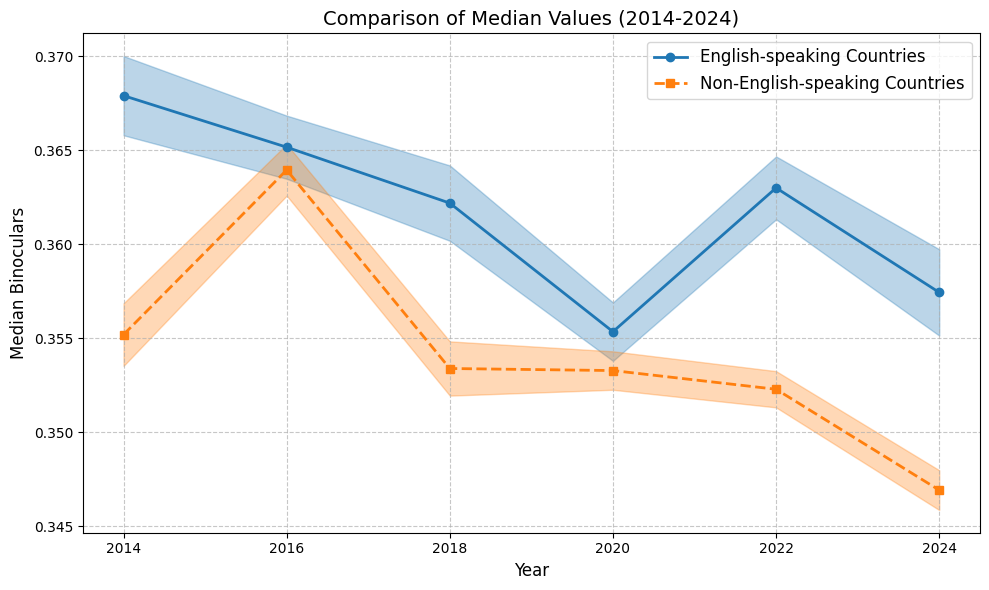

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats

# Data provided
english_country_2014 = ppl_list_bin_pubmed5000_eng_2014
english_country_2016 = ppl_list_bin_pubmed5000_eng_2016
english_country_2018 = ppl_list_bin_pubmed5000_eng_2018
english_country_2020 = ppl_list_bin_pubmed5000_eng_2020
english_country_2022 = ppl_list_bin_pubmed5000_eng_2022
english_country_2024 = ppl_list_bin_pubmed5000_eng_2024
non_english_country_2014 = ppl_list_bin_pubmed5000_noneng_2014
non_english_country_2016 = ppl_list_bin_pubmed5000_noneng_2016
non_english_country_2018 = ppl_list_bin_pubmed5000_noneng_2018
non_english_country_2020 = ppl_list_bin_pubmed5000_noneng_2020
non_english_country_2020 = ppl_list_bin_pubmed5000_noneng_2020
non_english_country_2022 = ppl_list_bin_pubmed5000_noneng_2022
non_english_country_2024 = ppl_list_bin_pubmed5000_noneng_2024

# Calculate medians for each year and country group
english_medians = [
    np.median(english_country_2014),
    np.median(english_country_2016),
    np.median(english_country_2018),
    np.median(english_country_2020),
    np.median(english_country_2022),
    np.median(english_country_2024)
]

non_english_medians = [
    np.median(non_english_country_2014),
    np.median(non_english_country_2016),
    np.median(non_english_country_2018),
    np.median(non_english_country_2020),
    np.median(non_english_country_2022),
    np.median(non_english_country_2024)
]

# Calculate standard error for each data set
# Standard Error of the Median = 1.253 * σ / sqrt(n)
# where σ is the standard deviation and n is the sample size
english_se = [
    1.253 * np.std(english_country_2014, ddof=1) / np.sqrt(len(english_country_2014)),
    1.253 * np.std(english_country_2016, ddof=1) / np.sqrt(len(english_country_2016)),
    1.253 * np.std(english_country_2018, ddof=1) / np.sqrt(len(english_country_2018)),
    1.253 * np.std(english_country_2020, ddof=1) / np.sqrt(len(english_country_2020)),
    1.253 * np.std(english_country_2022, ddof=1) / np.sqrt(len(english_country_2022)),
    1.253 * np.std(english_country_2024, ddof=1) / np.sqrt(len(english_country_2024))
]

non_english_se = [
    1.253 * np.std(non_english_country_2014, ddof=1) / np.sqrt(len(non_english_country_2014)),
    1.253 * np.std(non_english_country_2016, ddof=1) / np.sqrt(len(non_english_country_2016)),
    1.253 * np.std(non_english_country_2018, ddof=1) / np.sqrt(len(non_english_country_2018)),
    1.253 * np.std(non_english_country_2020, ddof=1) / np.sqrt(len(non_english_country_2020)),
    1.253 * np.std(non_english_country_2022, ddof=1) / np.sqrt(len(non_english_country_2022)),
    1.253 * np.std(non_english_country_2024, ddof=1) / np.sqrt(len(non_english_country_2024))
]

# Calculate upper and lower bounds for the shaded area (median ± standard error)
english_lower = [m - se for m, se in zip(english_medians, english_se)]
english_upper = [m + se for m, se in zip(english_medians, english_se)]

non_english_lower = [m - se for m, se in zip(non_english_medians, non_english_se)]
non_english_upper = [m + se for m, se in zip(non_english_medians, non_english_se)]

# Years for x-axis
years = [2014, 2016, 2018, 2020, 2022, 2024]

# Create the figure
plt.figure(figsize=(10, 6))

# Plot English-speaking countries
plt.plot(years, english_medians, 'o-', color='#1f77b4', linewidth=2, label='English-speaking Countries')
plt.fill_between(years, english_lower, english_upper, alpha=0.3, color='#1f77b4')

# Plot Non-English-speaking countries
plt.plot(years, non_english_medians, 's--', color='#ff7f0e', linewidth=2, label='Non-English-speaking Countries')
plt.fill_between(years, non_english_lower, non_english_upper, alpha=0.3, color='#ff7f0e')

# Add labels and title
plt.xlabel('Year', fontsize=12)
plt.ylabel('Median Binoculars', fontsize=12)
plt.title('Comparison of Median Values (2014-2024)', fontsize=14)

# Set x-axis ticks to show only the years with data
plt.xticks(years, fontsize=10)

# Add grid for better readability
plt.grid(True, linestyle='--', alpha=0.7)

# Add legend with increased font size
plt.legend(fontsize=12)

# Adjust layout and display
plt.tight_layout()
plt.show()

Data sample:
      value  year group    subject_id  year_centered
0  0.255495  2014     1   G1_Y2014_S1              0
1  0.299347  2014     1   G1_Y2014_S2              0
2  0.267792  2014     1   G1_Y2014_S3              0
3  0.362926  2014     1   G1_Y2014_S4              0
4  0.282951  2014     1   G1_Y2014_S5              0
5  0.371361  2014     1   G1_Y2014_S6              0
6  0.272916  2014     1   G1_Y2014_S7              0
7  0.355806  2014     1   G1_Y2014_S8              0
8  0.340340  2014     1   G1_Y2014_S9              0
9  0.404002  2014     1  G1_Y2014_S10              0

Data summary:
                mean       std  count
year group                           
2014 1      0.364587  0.076173   3343
     2      0.379970  0.072865   1556
2016 1      0.364236  0.083325   3250
     2      0.376483  0.071257   2375
2018 1      0.357878  0.077342   3518
     2      0.373245  0.071099   1510
2020 1      0.356520  0.070905   4409
     2      0.363723  0.067945   2568
2022 1   

<ipython-input-34-34bd09fadc19>:78: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby(['year', 'group'])['value'].agg(['mean', 'std', 'count']))



ANOVA Results:
                      sum_sq       df           F        PR(>F)
C(group)            1.122348      1.0  205.129844  2.154465e-46
C(year)             0.877974      5.0   32.093181  9.416543e-33
C(group):C(year)    0.063145      5.0    2.308191  4.167211e-02
Residual          189.190152  34578.0         NaN           NaN

The interaction between group and year is significant.
This indicates that the distribution difference between groups changes over time.

Comparing groups at each time point:
Year 2014: t=-6.780, p=0.0000 Significant
Year 2016: t=-5.924, p=0.0000 Significant
Year 2018: t=-6.840, p=0.0000 Significant
Year 2020: t=-4.202, p=0.0000 Significant
Year 2022: t=-7.142, p=0.0000 Significant
Year 2024: t=-5.069, p=0.0000 Significant


<ipython-input-34-34bd09fadc19>:119: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary_df = df.groupby(['year', 'group'])['value'].agg(['mean', 'sem']).reset_index()


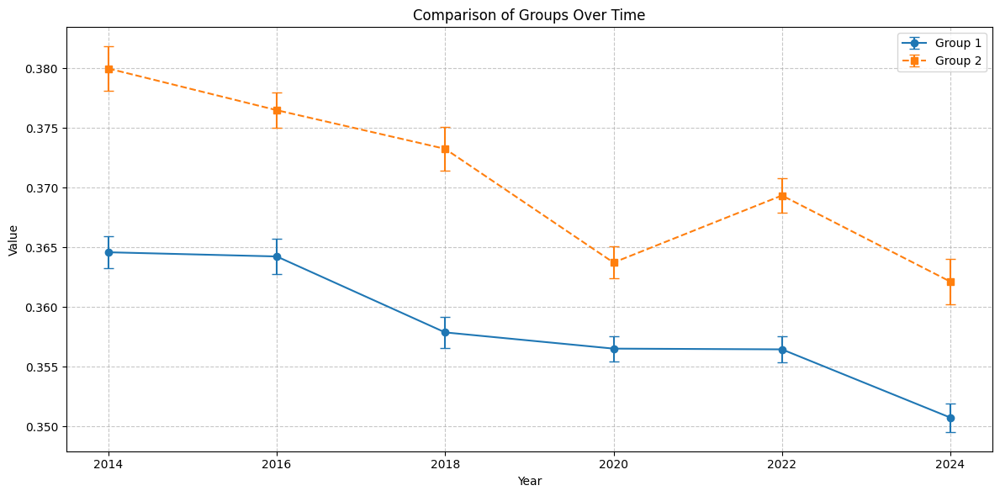

In [ ]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pandas as pd
from scipy import stats

# Sample data in list form with different numbers of individuals for each year
# Example with varying numbers of individuals
group_1_2014 = ppl_list_bin_pubmed5000_noneng_2014
group_1_2016 = ppl_list_bin_pubmed5000_noneng_2016
group_1_2018 = ppl_list_bin_pubmed5000_noneng_2018
group_1_2020 = ppl_list_bin_pubmed5000_noneng_2020
group_1_2022 = ppl_list_bin_pubmed5000_noneng_2022
group_1_2024 = ppl_list_bin_pubmed5000_noneng_2024

group_2_2014 = ppl_list_bin_pubmed5000_eng_2014
group_2_2016 = ppl_list_bin_pubmed5000_eng_2016
group_2_2018 = ppl_list_bin_pubmed5000_eng_2018
group_2_2020 = ppl_list_bin_pubmed5000_eng_2020
group_2_2022 = ppl_list_bin_pubmed5000_eng_2022
group_2_2024 = ppl_list_bin_pubmed5000_eng_2024

# Create a list of all data by year and group
all_data = [
    (group_1_2014, 1, 2014),
    (group_1_2016, 1, 2016),
    (group_1_2018, 1, 2018),
    (group_1_2020, 1, 2020),
    (group_1_2022, 1, 2022),
    (group_1_2024, 1, 2024),
    (group_2_2014, 2, 2014),
    (group_2_2016, 2, 2016),
    (group_2_2018, 2, 2018),
    (group_2_2020, 2, 2020),
    (group_2_2022, 2, 2022),
    (group_2_2024, 2, 2024),
]

# Now convert list data to the format needed for mixed-effects modeling
# We'll create a pandas DataFrame in "long format"

# Create empty lists to store our data
values = []
years = []
groups = []
subject_ids = []

# Process all data
for data_list, group, year in all_data:
    # Add data for each individual in this group/year
    for i, value in enumerate(data_list):
        values.append(value)
        years.append(year)
        groups.append(group)
        # Create a unique subject ID for each individual
        # Note: Since we don't have matched individuals across years,
        # each individual in each year gets a unique ID
        subject_ids.append(f"G{group}_Y{year}_S{i+1}")

# Create DataFrame from lists
df = pd.DataFrame({
    'value': values,
    'year': years,
    'group': groups,
    'subject_id': subject_ids
})

# Center the year variable for better interpretation
df['year_centered'] = df['year'] - df['year'].min()

# Convert group to categorical
df['group'] = df['group'].astype('category')

# Print the first few rows to verify
print("Data sample:")
print(df.head(10))
print("\nData summary:")
print(df.groupby(['year', 'group'])['value'].agg(['mean', 'std', 'count']))

# Since we don't have repeated measures (same individuals across time),
# we'll use a two-way ANOVA instead of a mixed-effects model
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# Fit the model
model = ols('value ~ C(group) + C(year) + C(group):C(year)', data=df).fit()
anova_table = anova_lm(model, typ=2)

print("\nANOVA Results:")
print(anova_table)

# Check for significant interaction effect
alpha = 0.05
if anova_table.loc['C(group):C(year)', 'PR(>F)'] < alpha:
    print("\nThe interaction between group and year is significant.")
    print("This indicates that the distribution difference between groups changes over time.")
else:
    print("\nThe interaction between group and year is not significant.")
    print("The difference between groups is consistent across years.")

# We can also perform a two-sample t-test for each year to compare groups
print("\nComparing groups at each time point:")
for year in sorted(df['year'].unique()):
    group1_data = df[(df['year'] == year) & (df['group'] == 1)]['value']
    group2_data = df[(df['year'] == year) & (df['group'] == 2)]['value']

    t_stat, p_val = stats.ttest_ind(group1_data, group2_data, equal_var=False)

    print(f"Year {year}: t={t_stat:.3f}, p={p_val:.4f}",
          "Significant" if p_val < alpha else "Not significant")

# For a visual representation
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

# Calculate mean and standard error for each group by year
summary_df = df.groupby(['year', 'group'])['value'].agg(['mean', 'sem']).reset_index()

# Plot group 1
g1_data = summary_df[summary_df['group'] == 1]
plt.errorbar(g1_data['year'], g1_data['mean'], yerr=g1_data['sem'],
             marker='o', label='Group 1', linestyle='-', capsize=4)

# Plot group 2
g2_data = summary_df[summary_df['group'] == 2]
plt.errorbar(g2_data['year'], g2_data['mean'], yerr=g2_data['sem'],
             marker='s', label='Group 2', linestyle='--', capsize=4)

plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Comparison of Groups Over Time')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### Wiki

#### List of ppl scores

In [ ]:
# 2014/2016/2018/2020/2022/2024 06/12 01/05/10/20/25
for file in sorted(glob.glob("wikipedia_20*.json"), key=numericalSort):
  if file.startswith("wikipedia_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      wiki = json.load(red)
      wiki_list = []

      for data in wiki:
        text = data['text']
        wiki_list.append(text)
      results_bin_wiki = calculate_binoculars_scores(model_id1, model_id2, wiki_list)
      ppl_list_bin_wiki = []
      for text, ppl in results_bin_wiki.items():
        ppl_list_bin_wiki.append(ppl)
      with open("ppl_list_bin_wiki_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list_bin_wiki, f)



Streaming output truncated to the last 5000 lines.
Processing text 772/1000
Text 772 Binoculars score: 0.4524
Processing text 773/1000
Text 773 Binoculars score: 0.1907
Processing text 774/1000
Text 774 Binoculars score: 0.2719
Processing text 775/1000
Text 775 Binoculars score: 0.2589
Processing text 776/1000
Text 776 Binoculars score: 0.3436
Processing text 777/1000
Text 777 Binoculars score: 0.4140
Processing text 778/1000
Text 778 Binoculars score: 0.4533
Processing text 779/1000
Text 779 Binoculars score: 0.4369
Processing text 780/1000
Text 780 Binoculars score: 0.5885
Processing text 781/1000
Text 781 Binoculars score: 0.3333
Processing text 782/1000
Text 782 Binoculars score: 0.3545
Processing text 783/1000
Text 783 Binoculars score: 0.2596
Processing text 784/1000
Text 784 Binoculars score: 0.6389
Processing text 785/1000
Text 785 Binoculars score: 0.4011
Processing text 786/1000
Text 786 Binoculars score: 0.4654
Processing text 787/1000
Text 787 Binoculars score: 0.3684
Proce

In [ ]:
# 2014/2016/2018/2020/2022/2024 06/12 01/05/10/20/25
for file in sorted(glob.glob("Copy of wikipedia_20*.json"), key=numericalSort):
  if file.startswith("Copy of wikipedia_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      wiki = json.load(red)
      wiki_list = []

      for data in wiki:
        text = data['text']
        wiki_list.append(text)
      results_bin_wiki = calculate_binoculars_scores(model_id1, model_id2, wiki_list)
      ppl_list_bin_wiki = []
      for text, ppl in results_bin_wiki.items():
        ppl_list_bin_wiki.append(ppl)
      with open("ppl_list_bin_wiki_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list_bin_wiki, f)



**********Processing file Copy of wikipedia_20240601.json ************
Loading model 1: facebook/opt-125m


config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

Loading model 2: openai-community/gpt2


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Streaming output truncated to the last 5000 lines.
Processing text 509/1000
Text 509 Binoculars score: 0.3209
Processing text 510/1000
Text 510 Binoculars score: 0.3483
Processing text 511/1000
Text 511 Binoculars score: 0.5748
Processing text 512/1000
Text 512 Binoculars score: 0.3738
Processing text 513/1000
Text 513 Binoculars score: 0.4087
Processing text 514/1000
Text 514 Binoculars score: 0.2616
Processing text 515/1000
Text 515 Binoculars score: 0.3176
Processing text 516/1000
Text 516 Binoculars score: 0.4337
Processing text 517/1000
Text 517 Binoculars score: 0.4545
Processing text 518/1000
Text 518 Binoculars score: 0.4951
Processing text 519/1000
Text 519 Binoculars score: 0.3244
Processing text 520/1000
Text 520 Binoculars score: 0.3929
Processing text 521/1000
Text 521 Binoculars score: 0.3976
Processing text 522/1000
Text 522 Binoculars score: 0.3721
Processing text 523/1000
Text 523 Binoculars score: 0.2680
Processing text 524/1000
Text 524 Binoculars score: 0.2811
Proce

In [ ]:
# 2024
grand_text_list = []
grand_ppl_list = []
token_count = 0
for file in sorted(glob.glob("wikipedia_20241230*.json"), key=numericalSort):
  if file.startswith("wikipedia_20241230"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as pm:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      file_loaded = json.load(pm)
      data_list = file_loaded["data"]
      token_count = 0
      text_list = []
      ppl_list = []
      for i in data_list:
        text = i['text']
        text_list.append(text)
        grand_text_list.append(text)
        token_count += len(text.split())
      results = calculate_binoculars_scores(model_id1, model_id2, text_list)
      for text, ppl in results.items():
        ppl_list.append(ppl)
        grand_ppl_list.append(ppl)
      with open("ppl_list_bin_wiki_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list, f)


**********Processing file wikipedia_20241230.json ************
Loading model 1: facebook/opt-125m


config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

Loading model 2: openai-community/gpt2


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Model 1 vocabulary size: 50272
Model 2 vocabulary size: 50257
Processing text 1/1000
Text 1 Binoculars score: 0.2961
Processing text 2/1000
Text 2 Binoculars score: 0.4683
Processing text 3/1000
Text 3 Binoculars score: 0.4886
Processing text 4/1000
Text 4 Binoculars score: 0.2898
Processing text 5/1000
Text 5 Binoculars score: 0.2692
Processing text 6/1000
Text 6 Binoculars score: 0.4027
Processing text 7/1000
Text 7 Binoculars score: 0.3693
Processing text 8/1000
Text 8 Binoculars score: 0.3172
Processing text 9/1000
Text 9 Binoculars score: 0.3858
Processing text 10/1000
Text 10 Binoculars score: 0.4310
Processing text 11/1000
Text 11 Binoculars score: 0.3451
Processing text 12/1000
Text 12 Binoculars score: 0.3485
Processing text 13/1000
Text 13 Binoculars score: 0.3515
Processing text 14/1000
Text 14 Binoculars score: 0.3158
Processing text 15/1000
Text 15 Binoculars score: 0.3323
Processing text 16/1000
Text 16 Binoculars score: 0.2995
Processing text 17/1000
Text 17 Binoculars s

In [ ]:
# merge 2024
ppl_list_2024 = []

for file in sorted(glob.glob("ppl_list_bin_wiki_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_bin_wiki_2024"):
    with open(file, 'r') as pm:
      ppl_list = json.load(pm)
      ppl_list_2024.extend(ppl_list)
with open("ppl_list_bin_wiki_2024.json", "w") as f:
  json.dump(ppl_list_2024, f)
print("Number of pages:", len(ppl_list_2024))

Number of pages: 4000


### Stack

In [ ]:
for file in sorted(glob.glob("stackexchange_20*.json"), key=numericalSort):
  if file.startswith("stackexchange_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      reddit = json.load(red)
      reddit_list = []

      for data in reddit:
        text = data['text']
        text = text.replace("\n", " ")
        text = text.replace("\'", "'")
        re.sub(r'\s{2,}', " ", text)
        reddit_list.append(text)
      results_bin_reddit = calculate_binoculars_scores(model_id1, model_id2, reddit_list)
      ppl_list_bin_reddit = []
      for text, ppl in results_bin_reddit.items():
        ppl_list_bin_reddit.append(ppl)
      with open("ppl_list_bin_stack_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list_bin_reddit, f)



**********Processing file stackexchange_20220625.json ************
Loading model 1: facebook/opt-125m


config.json:   0%|          | 0.00/651 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/251M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/251M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/441 [00:00<?, ?B/s]

Loading model 2: openai-community/gpt2


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Streaming output truncated to the last 5000 lines.
Processing text 362/576
Text 362 Binoculars score: 0.4728
Processing text 363/576
Text 363 Binoculars score: 0.5484
Processing text 364/576
Text 364 Binoculars score: 0.4101
Processing text 365/576
Text 365 Binoculars score: 0.4903
Processing text 366/576
Text 366 Binoculars score: 0.4599
Processing text 367/576
Text 367 Binoculars score: 0.4275
Processing text 368/576
Text 368 Binoculars score: 0.4821
Processing text 369/576
Text 369 Binoculars score: 0.3829
Processing text 370/576
Text 370 Binoculars score: 0.5058
Processing text 371/576
Text 371 Binoculars score: 0.2951
Processing text 372/576
Text 372 Binoculars score: 0.4986
Processing text 373/576
Text 373 Binoculars score: 0.3763
Processing text 374/576
Text 374 Binoculars score: 0.4165
Processing text 375/576
Text 375 Binoculars score: 0.6106
Processing text 376/576
Text 376 Binoculars score: 0.3132
Processing text 377/576
Text 377 Binoculars score: 0.4174
Processing text 378/5

#### List of ppl scores

In [ ]:
for file in sorted(glob.glob("reddit_20*.json"), key=numericalSort):
  if file.startswith("reddit_20"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      reddit = json.load(red)
      reddit_list = []

      for data in reddit:
        text = data['text']
        text = text.replace("\n", " ")
        text = text.replace("\'", "'")
        re.sub(r'\s{2,}', " ", text)
        reddit_list.append(text)
      results_bin_reddit = calculate_binoculars_scores(model_id1, model_id2, reddit_list)
      ppl_list_bin_reddit = []
      for text, ppl in results_bin_reddit.items():
        ppl_list_bin_reddit.append(ppl)
      with open("ppl_list_bin_reddit_"+str(fileNum)+".json", "w") as f:
        json.dump(ppl_list_bin_reddit, f)



Streaming output truncated to the last 5000 lines.
Text 59 Binoculars score: 0.5458
Processing text 60/95
Text 60 Binoculars score: 0.4604
Processing text 61/95
Text 61 Binoculars score: 0.5074
Processing text 62/95
Text 62 Binoculars score: 0.3426
Processing text 63/95
Text 63 Binoculars score: 0.6459
Processing text 64/95
Text 64 Binoculars score: 0.3254
Processing text 65/95
Text 65 Binoculars score: 0.4189
Processing text 66/95
Text 66 Binoculars score: 0.4681
Processing text 67/95
Text 67 Binoculars score: 0.3280
Processing text 68/95
Text 68 Binoculars score: 0.4249
Processing text 69/95
Text 69 Binoculars score: 0.3234
Processing text 70/95
Text 70 Binoculars score: 0.4411
Processing text 71/95
Text 71 Binoculars score: 0.4436
Processing text 72/95
Text 72 Binoculars score: 0.5685
Processing text 73/95
Text 73 Binoculars score: 0.4723
Processing text 74/95
Text 74 Binoculars score: 0.2879
Processing text 75/95
Text 75 Binoculars score: 0.4122
Processing text 76/95
Text 76 Binocu

In [ ]:
# 2024
ppl_list_bin_reddit_2024 = []
for file in sorted(glob.glob("ppl_list_bin_reddit_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_bin_reddit_2024"):
    print('**********Processing file', file, '************')
    with open(file, 'r') as red:
      string = str(file)
      fileNum = re.findall('([0-9]{8})\.json',string)[0]
      ppl_list = json.load(red)
      ppl_list_bin_reddit_2024.extend(ppl_list)

print("total number of posts:", len(ppl_list_bin_reddit_2024))
print("median of ppl:", statistics.median(ppl_list_bin_reddit_2024))
with open("ppl_list_bin_reddit_2024.json", "w") as f:
  json.dump(ppl_list_bin_reddit_2024, f)


**********Processing file ppl_list_bin_reddit_20240605.json ************
**********Processing file ppl_list_bin_reddit_20240610.json ************
**********Processing file ppl_list_bin_reddit_20240615.json ************
**********Processing file ppl_list_bin_reddit_20240620.json ************
**********Processing file ppl_list_bin_reddit_20240625.json ************
**********Processing file ppl_list_bin_reddit_20240630.json ************
**********Processing file ppl_list_bin_reddit_20241205.json ************
**********Processing file ppl_list_bin_reddit_20241210.json ************
**********Processing file ppl_list_bin_reddit_20241215.json ************
**********Processing file ppl_list_bin_reddit_20241220.json ************
**********Processing file ppl_list_bin_reddit_20241225.json ************
**********Processing file ppl_list_bin_reddit_20241230.json ************
total number of posts: 1132
median of ppl: 0.39176343794632007


In [ ]:
# merge 2024
ppl_list_bin_stack_2024 = []

for file in sorted(glob.glob("ppl_list_bin_stack_2024*.json"), key=numericalSort):
  if file.startswith("ppl_list_bin_stack_2024"):
    print("Processing", str(file))
    with open(file, 'r') as pm:
      ppl_list = json.load(pm)
      ppl_list_bin_stack_2024.extend(ppl_list)
with open("ppl_list_bin_stack_2024.json", "w") as f:
  json.dump(ppl_list_bin_stack_2024, f)
print("Number of pages:", len(ppl_list_bin_stack_2024))
print("Median:", statistics.median(ppl_list_bin_stack_2024))

Processing ppl_list_bin_stack_20240601.json
Processing ppl_list_bin_stack_20240615.json
Processing ppl_list_bin_stack_20240630.json
Processing ppl_list_bin_stack_20241201.json
Processing ppl_list_bin_stack_20241215.json
Processing ppl_list_bin_stack_20241230.json
Number of pages: 3362
Median: 0.41715360279621455


### Median Binoculars line plot

<Figure size 1200x800 with 0 Axes>

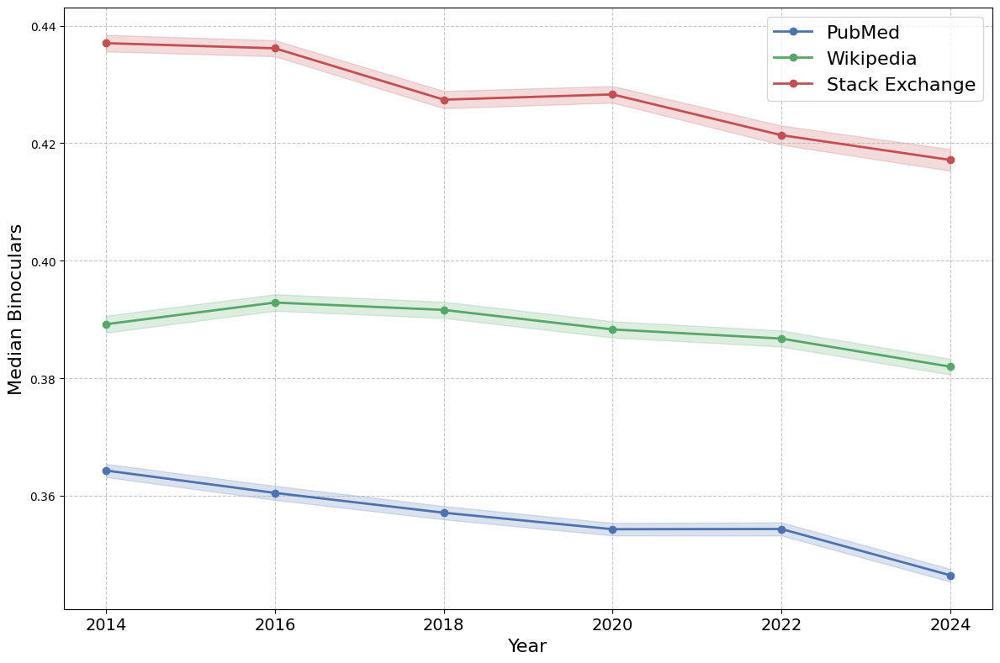

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ppl_list_bin_pubmed5000_2014
group1_2016 = ppl_list_bin_pubmed5000_2016
group1_2018 = ppl_list_bin_pubmed5000_2018
group1_2020 = ppl_list_bin_pubmed5000_2020
group1_2022 = ppl_list_bin_pubmed5000_2022
group1_2024 = ppl_list_bin_pubmed5000_2024

group2_2014 = ppl_list_bin_wiki_2014
group2_2016 = ppl_list_bin_wiki_2016
group2_2018 = ppl_list_bin_wiki_2018
group2_2020 = ppl_list_bin_wiki_2020
group2_2022 = ppl_list_bin_wiki_2022
group2_2024 = ppl_list_bin_wiki_2024

group3_2014 = ppl_list_bin_stack_2014
group3_2016 = ppl_list_bin_stack_2016
group3_2018 = ppl_list_bin_stack_2018
group3_2020 = ppl_list_bin_stack_2020
group3_2022 = ppl_list_bin_stack_2022
group3_2024 = ppl_list_bin_stack_2024

# Organize data into groups and years
groups = {
    "PubMed": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed": "#4C72B0",  # Blue
    "Wikipedia": "#55A868",  # Green
    "Stack Exchange": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median Binoculars', fontsize=16)
#ax.set_title('Changes in Median Values (2014-2024)', fontsize=16, fontweight='bold')

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# p-for trend
import numpy as np
import scipy.stats as stats

group1 = [statistics.median(ppl_list_bin_pubmed5000_2014), statistics.median(ppl_list_bin_pubmed5000_2016), statistics.median(ppl_list_bin_pubmed5000_2018), statistics.median(ppl_list_bin_pubmed5000_2020), statistics.median(ppl_list_bin_pubmed5000_2022), statistics.median(ppl_list_bin_pubmed5000_2024)]  # Medians for group 1
group2 = [statistics.median(ppl_list_bin_wiki_2014), statistics.median(ppl_list_bin_wiki_2016), statistics.median(ppl_list_bin_wiki_2018), statistics.median(ppl_list_bin_wiki_2020), statistics.median(ppl_list_bin_wiki_2022), statistics.median(ppl_list_bin_wiki_2024)]  # Medians for group 2
group3 = [statistics.median(ppl_list_bin_stack_2014), statistics.median(ppl_list_bin_stack_2016), statistics.median(ppl_list_bin_stack_2018), statistics.median(ppl_list_bin_stack_2020), statistics.median(ppl_list_bin_stack_2022), statistics.median(ppl_list_bin_stack_2024)]  # Medians for group 3

# Years corresponding to each data point
years = [2014, 2016, 2018, 2020, 2022, 2024]

In [ ]:
#p-for trend for pubmed
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, group1)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.942857
P-value for monotonic trend: 0.004805


In [ ]:
#p-for trend for wiki
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, group2)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.828571
P-value for monotonic trend: 0.041563


In [ ]:
#p-for trend for stack
# Spearman rank correlation
correlation, p_value = stats.spearmanr(years, group3)

print(f"Spearman correlation: {correlation:.6f}")
print(f"P-value for monotonic trend: {p_value:.6f}")

Spearman correlation: -0.942857
P-value for monotonic trend: 0.004805


### Mixed-effects regression model

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.regression.mixed_linear_model import MixedLM
import matplotlib.pyplot as plt
import seaborn as sns


# Create a function to generate a dataframe from your data
def create_regression_df(data_dict):
    """
    Convert your dictionary of perplexity scores to a pandas DataFrame.

    Parameters:
    data_dict: Dictionary with years as keys and lists of perplexity scores as values
    platform: Name of the platform (PubMed, Wikipedia, StackExchange)

    Returns:
    DataFrame with columns: year, perplexity_score, platform
    """
    rows = []

    for platform_name, platform_data in data_dict.items():
        for year, scores in platform_data.items():
            for score in scores:
                rows.append({
                    'year': int(year),
                    'perplexity_score': float(score),
                    'platform': platform_name
                })

    return pd.DataFrame(rows)

# Example data structure
data_dict = {
    'PubMed': {

    },
    'Wikipedia': {

    },
    'StackExchange': {

    }
}

data_dict['PubMed'][2014] = ppl_list_bin_pubmed5000_2014
data_dict['PubMed'][2016] = ppl_list_bin_pubmed5000_2016
data_dict['PubMed'][2018] = ppl_list_bin_pubmed5000_2018
data_dict['PubMed'][2020] = ppl_list_bin_pubmed5000_2020
data_dict['PubMed'][2022] = ppl_list_bin_pubmed5000_2022
data_dict['PubMed'][2024] = ppl_list_bin_pubmed5000_2024
data_dict['Wikipedia'][2014] = ppl_list_bin_wiki_2014
data_dict['Wikipedia'][2016] = ppl_list_bin_wiki_2016
data_dict['Wikipedia'][2018] = ppl_list_bin_wiki_2018
data_dict['Wikipedia'][2020] = ppl_list_bin_wiki_2020
data_dict['Wikipedia'][2022] = ppl_list_bin_wiki_2022
data_dict['Wikipedia'][2024] = ppl_list_bin_wiki_2024
data_dict['StackExchange'][2014] = ppl_list_bin_stack_2014
data_dict['StackExchange'][2016] = ppl_list_bin_stack_2016
data_dict['StackExchange'][2018] = ppl_list_bin_stack_2018
data_dict['StackExchange'][2020] = ppl_list_bin_stack_2020
data_dict['StackExchange'][2022] = ppl_list_bin_stack_2022
data_dict['StackExchange'][2024] = ppl_list_bin_stack_2024

# Create DataFrame
df = create_regression_df(data_dict)

# 1. Mixed-effects model
# Center the year variable around 2014 for easier interpretation
df['year_centered'] = df['year'] - 2014

# Fit mixed-effects model
model = smf.mixedlm("perplexity_score ~ year_centered",
                    data=df,
                    groups=df["platform"])
result = model.fit()
print(result.summary())

# To see platform-specific effects
platforms = df['platform'].unique()
for platform in platforms:
    platform_data = df[df['platform'] == platform]
    platform_model = sm.OLS.from_formula("perplexity_score ~ year_centered", data=platform_data)
    platform_result = platform_model.fit()
    print(f"\nResults for {platform}:")
    print(platform_result.summary().tables[1])

            Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: perplexity_score
No. Observations: 81910   Method:             REML            
No. Groups:       3       Scale:              0.0086          
Min. group size:  23991   Log-Likelihood:     78744.2331      
Max. group size:  31114   Converged:          Yes             
Mean group size:  27303.3                                     
---------------------------------------------------------------
               Coef.   Std.Err.     z     P>|z|  [0.025  0.975]
---------------------------------------------------------------
Intercept       0.403     0.020   19.646  0.000   0.363   0.443
year_centered  -0.002     0.000  -16.191  0.000  -0.002  -0.001
Group Var       0.001     0.014                                


Results for PubMed:
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
In

/usr/local/lib/python3.11/dist-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


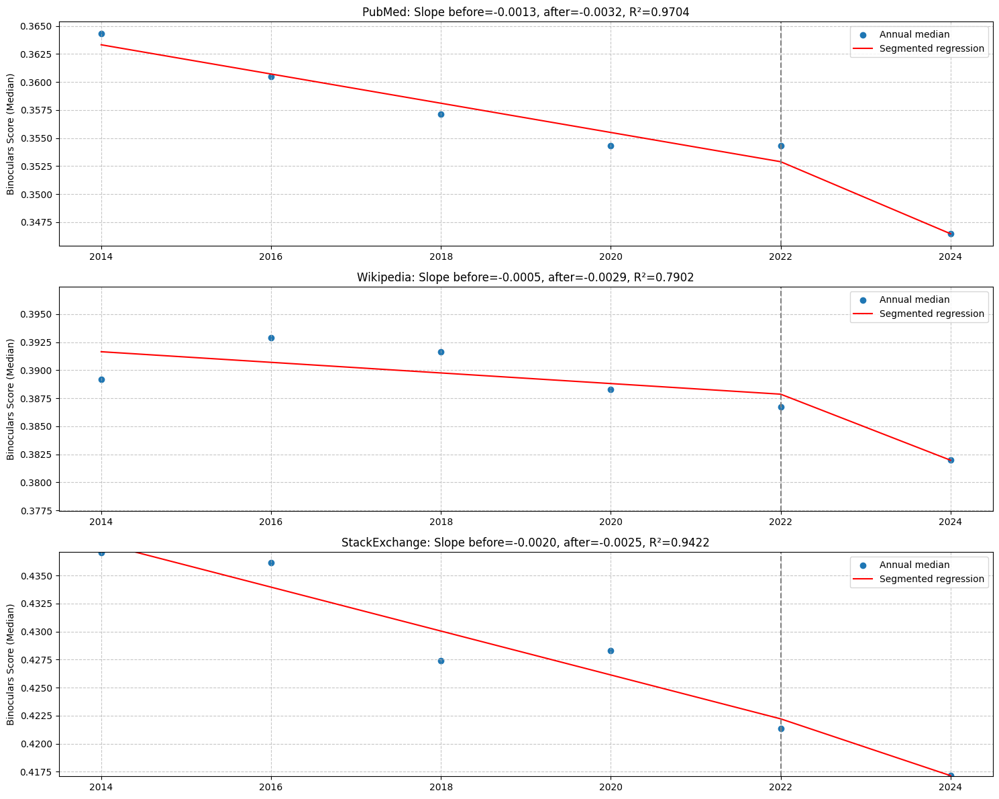

PubMed: Slope ratio (after/before) = 2.464871485463912
PubMed: Absolute change in rate = 0.0019
Wikipedia: Slope ratio (after/before) = ∞ (before slope near zero)
Wikipedia: Absolute change in rate = 0.0025
StackExchange: Slope ratio (after/before) = 1.2935626907135414
StackExchange: Absolute change in rate = 0.0006


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy import stats

# Function to perform segmented regression (unchanged)
def segmented_regression(x, y, breakpoint):
    """
    Perform segmented regression with one breakpoint.

    Parameters:
    x: Array of x values (years)
    y: Array of y values (perplexity score medians)
    breakpoint: The x value where the breakpoint occurs

    Returns:
    Dictionary with regression results
    """
    # Create indicator variables
    x1 = np.array(x)
    x2 = np.maximum(0, np.array(x) - breakpoint)

    # Create design matrix
    X = np.column_stack((np.ones(len(x)), x1, x2))

    # Fit model
    beta, _, _, _ = np.linalg.lstsq(X, y, rcond=None)

    # Calculate predictions
    y_pred = beta[0] + beta[1] * x1 + beta[2] * x2

    # Calculate slope before and after breakpoint
    slope_before = beta[1]
    slope_after = beta[1] + beta[2]

    # Calculate R-squared
    ss_total = np.sum((y - np.mean(y))**2)
    ss_residual = np.sum((y - y_pred)**2)
    r_squared = 1 - (ss_residual / ss_total)

    return {
        'intercept': beta[0],
        'slope_before': slope_before,
        'slope_after': slope_after,
        'r_squared': r_squared,
        'predictions': y_pred
    }

# Group by year and platform to get annual medians
annual_df = df.groupby(['year', 'platform'])['perplexity_score'].agg(
    ['median']).reset_index()

# First, collect all data points and predictions to find the global min and max
all_values = []
breakpoint_year = 2022  # The year you suspect a change occurred

for platform in platforms:
    platform_data = annual_df[annual_df['platform'] == platform]
    years = platform_data['year'].values
    perplexity = platform_data['median'].values

    # Perform segmented regression
    seg_reg = segmented_regression(years, perplexity, breakpoint_year)

    # Add both actual values and predictions to the collection
    all_values.extend(perplexity)
    all_values.extend(seg_reg['predictions'])

# Calculate global min and max with some padding
global_min = min(all_values) * 0.995  # 0.5% padding below
global_max = max(all_values) * 1.005  # 0.5% padding above

# Define a consistent range interval (e.g., 0.02 units per subplot)
y_range = 0.02  # Adjust this value for desired height of each subplot

# Plot and perform segmented regression for each platform
plt.figure(figsize=(15, 12))  # Slightly taller to accommodate fixed y-ranges

for i, platform in enumerate(platforms, 1):
    platform_data = annual_df[annual_df['platform'] == platform]
    years = platform_data['year'].values
    perplexity = platform_data['median'].values

    # Perform segmented regression
    seg_reg = segmented_regression(years, perplexity, breakpoint_year)

    # Plot
    plt.subplot(len(platforms), 1, i)
    plt.scatter(years, perplexity, label='Annual median')
    plt.plot(years, seg_reg['predictions'], 'r-', label='Segmented regression')
    plt.axvline(x=breakpoint_year, color='gray', linestyle='--')
    plt.title(f"{platform}: Slope before={seg_reg['slope_before']:.4f}, after={seg_reg['slope_after']:.4f}, R²={seg_reg['r_squared']:.4f}")
    plt.ylabel('Binoculars Score (Median)')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Find the center of this dataset
    data_center = (min(perplexity) + max(perplexity)) / 2

    # Set the y-axis limits to be exactly the same range (y_range) around the data center
    plt.ylim(data_center - y_range/2, data_center + y_range/2)

    plt.legend()

plt.tight_layout()
plt.savefig('segmented_regression_median_results.png', dpi=300)
plt.show()

# Optional: Calculate and print the ratio of slopes after/before breakpoint
for platform in platforms:
    platform_data = annual_df[annual_df['platform'] == platform]
    years = platform_data['year'].values
    perplexity = platform_data['median'].values

    seg_reg = segmented_regression(years, perplexity, breakpoint_year)

    # Handle case where before slope is near zero
    if abs(seg_reg['slope_before']) < 0.001:
        ratio = "∞ (before slope near zero)"
    else:
        ratio = abs(seg_reg['slope_after'] / seg_reg['slope_before'])

    print(f"{platform}: Slope ratio (after/before) = {ratio}")

    # Calculate absolute change in rate
    change = abs(seg_reg['slope_after']) - abs(seg_reg['slope_before'])
    print(f"{platform}: Absolute change in rate = {change:.4f}")

        platform     slope  annual_change_percent   p_value  r_squared  \
0         PubMed -0.001576              -0.432717  0.001714   0.933155   
1      Wikipedia -0.000826              -0.212327  0.057528   0.635509   
2  StackExchange -0.002040              -0.466825  0.001371   0.940148   

   total_percent_change  iqr_first_year  iqr_last_year  rel_iqr_change_percent  
0             -4.892864        0.100722       0.093137               -2.774102  
1             -1.856312        0.101540       0.101015                1.363840  
2             -4.546749        0.131024       0.128857                3.031080  


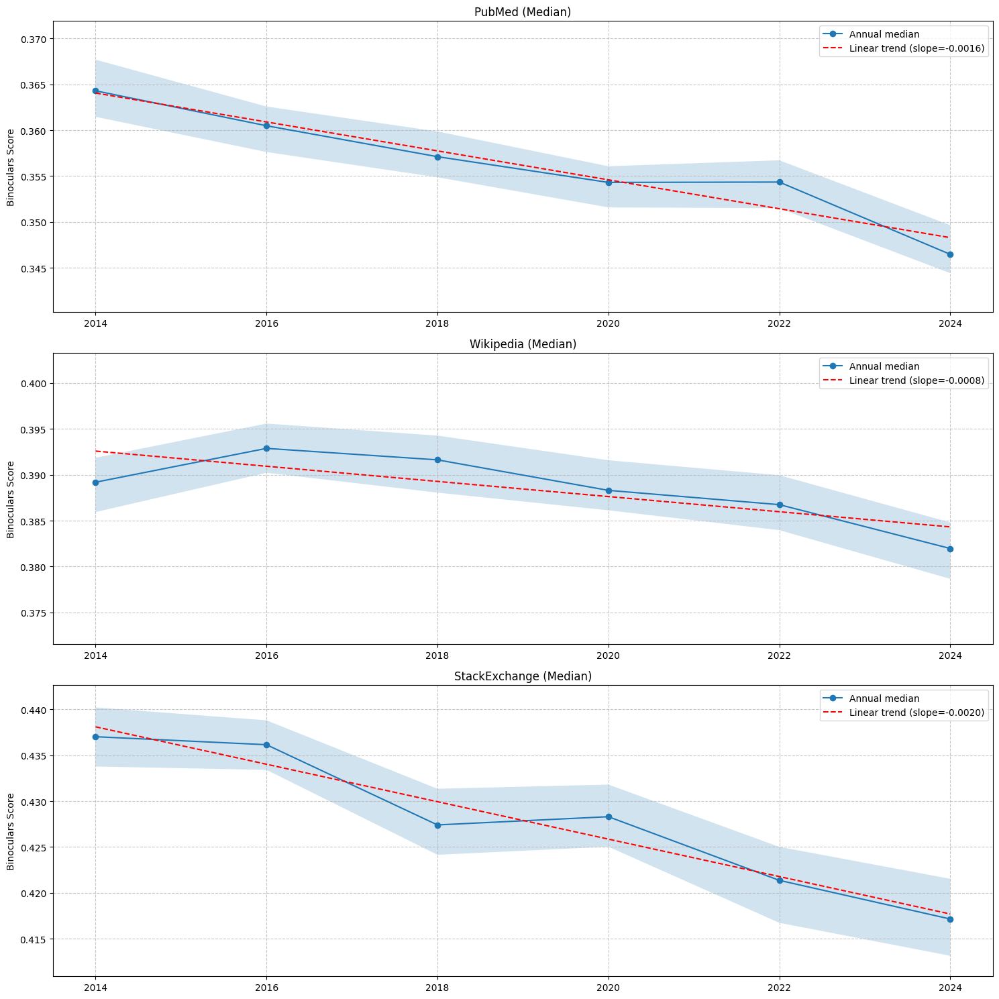

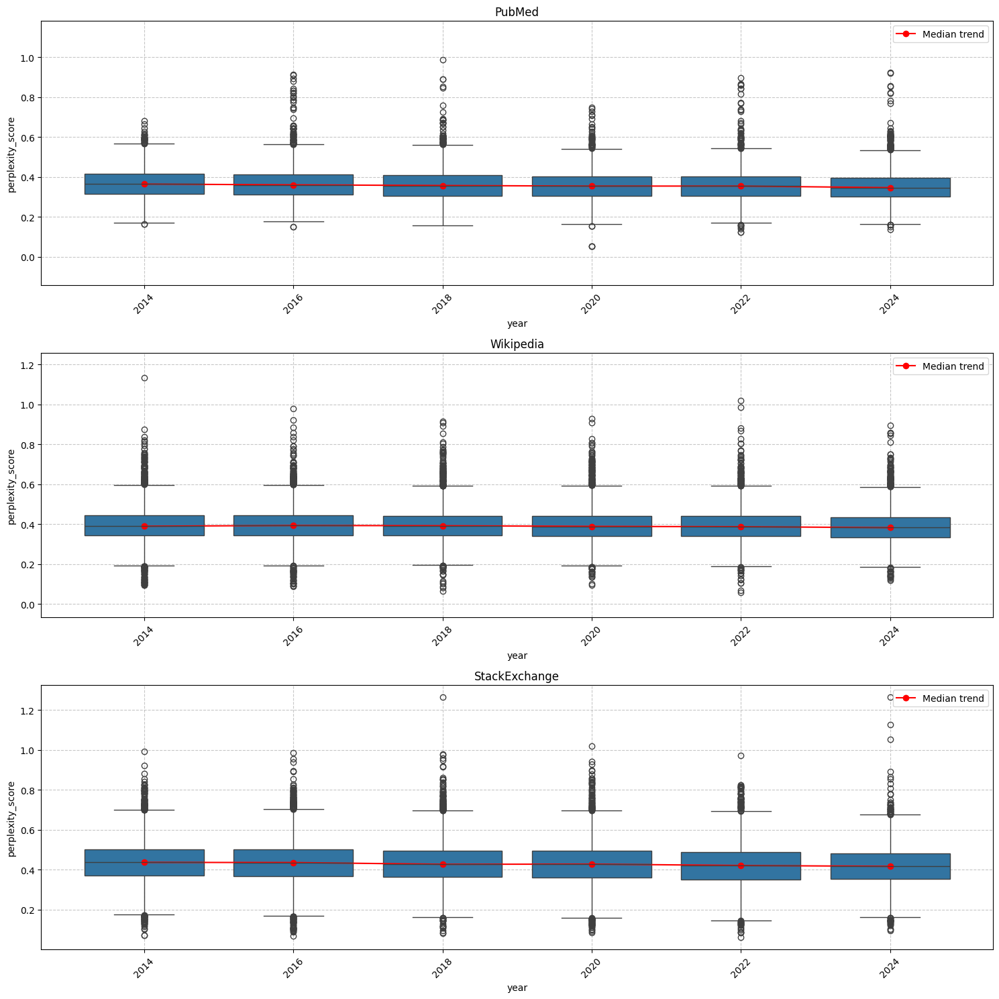

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress

# Calculate temporal metrics using median instead of mean
def analyze_temporal_trends(df):
    """
    Analyze temporal trends in perplexity scores across platforms using median.

    Parameters:
    df: DataFrame with columns year, perplexity_score, platform

    Returns:
    DataFrame with trend metrics by platform
    """
    results = []

    for platform in df['platform'].unique():
        platform_data = df[df['platform'] == platform]

        # Group by year to get annual statistics
        yearly_stats = platform_data.groupby('year')['perplexity_score'].agg(
            ['median', 'std', 'count']).reset_index()

        # Linear regression on annual medians
        years = yearly_stats['year'].values
        scores = yearly_stats['median'].values

        # Calculate linear trend
        slope, intercept, r_value, p_value, std_err = linregress(years, scores)

        # Calculate percentage change from 2014 to 2024
        first_year_median = yearly_stats[yearly_stats['year'] == 2014]['median'].values[0]
        last_year_median = yearly_stats[yearly_stats['year'] == 2024]['median'].values[0]
        percent_change = ((last_year_median - first_year_median) / first_year_median) * 100

        # Calculate robust measure of dispersion (IQR/median)
        yearly_iqr = []
        yearly_reliqr = []

        for year in sorted(platform_data['year'].unique()):
            year_data = platform_data[platform_data['year'] == year]['perplexity_score']
            q75, q25 = np.percentile(year_data, [75, 25])
            iqr = q75 - q25
            year_median = np.median(year_data)
            rel_iqr = iqr / year_median * 100
            yearly_iqr.append(iqr)
            yearly_reliqr.append(rel_iqr)

        # Store results
        results.append({
            'platform': platform,
            'slope': slope,
            'annual_change_percent': slope / first_year_median * 100,
            'p_value': p_value,
            'r_squared': r_value**2,
            'total_percent_change': percent_change,
            'iqr_first_year': yearly_iqr[0],
            'iqr_last_year': yearly_iqr[-1],
            'rel_iqr_change_percent': ((yearly_reliqr[-1] - yearly_reliqr[0]) / yearly_reliqr[0]) * 100
        })

    return pd.DataFrame(results)

# Run the analysis
trend_results = analyze_temporal_trends(df)
print(trend_results)

# Create visualization of trends with confidence intervals based on medians
plt.figure(figsize=(15, 15))

# Determine the y-range to use for all plots (based on % range from center)
platform_ranges = []

for platform in platforms:
    platform_data = df[df['platform'] == platform]

    # Calculate median and confidence intervals for each year
    yearly_medians = []
    yearly_ci_lower = []
    yearly_ci_upper = []

    for year in sorted(platform_data['year'].unique()):
        year_data = platform_data[platform_data['year'] == year]['perplexity_score']

        # Calculate median
        median_val = np.median(year_data)
        yearly_medians.append(median_val)

        # Bootstrap to get confidence intervals
        n_bootstrap = 1000
        bootstrap_medians = []
        for _ in range(n_bootstrap):
            sample = np.random.choice(year_data, size=len(year_data), replace=True)
            bootstrap_medians.append(np.median(sample))

        # Get 95% confidence interval
        ci_lower = np.percentile(bootstrap_medians, 2.5)
        ci_upper = np.percentile(bootstrap_medians, 97.5)

        yearly_ci_lower.append(ci_lower)
        yearly_ci_upper.append(ci_upper)

    # Find min, max, and center of data
    data_min = min(min(yearly_medians), min(yearly_ci_lower))
    data_max = max(max(yearly_medians), max(yearly_ci_upper))
    data_center = (data_min + data_max) / 2
    data_range = data_max - data_min

    platform_ranges.append((platform, data_center, data_range))

# Use the largest range as the consistent scale
max_range = max([r[2] for r in platform_ranges]) * 1.2  # Add 20% padding

# Now plot each platform with consistent scale
for i, platform in enumerate(platforms, 1):
    platform_data = df[df['platform'] == platform]
    platform_center = [r[1] for r in platform_ranges if r[0] == platform][0]

    # Calculate annual stats with confidence intervals using bootstrapping
    yearly_stats = []

    for year in sorted(platform_data['year'].unique()):
        year_data = platform_data[platform_data['year'] == year]['perplexity_score']

        # Calculate median
        median_val = np.median(year_data)

        # Bootstrap to get confidence intervals for median
        n_bootstrap = 1000
        bootstrap_medians = []
        for _ in range(n_bootstrap):
            sample = np.random.choice(year_data, size=len(year_data), replace=True)
            bootstrap_medians.append(np.median(sample))

        # Get 95% confidence interval
        ci_lower = np.percentile(bootstrap_medians, 2.5)
        ci_upper = np.percentile(bootstrap_medians, 97.5)

        yearly_stats.append({
            'year': year,
            'median': median_val,
            'ci_lower': ci_lower,
            'ci_upper': ci_upper
        })

    yearly_stats_df = pd.DataFrame(yearly_stats)

    # Plot
    plt.subplot(len(platforms), 1, i)
    plt.plot(yearly_stats_df['year'], yearly_stats_df['median'], 'o-', label='Annual median')
    plt.fill_between(yearly_stats_df['year'],
                     yearly_stats_df['ci_lower'],
                     yearly_stats_df['ci_upper'],
                     alpha=0.2)

    # Add linear trendline
    years = yearly_stats_df['year'].values
    scores = yearly_stats_df['median'].values

    model = LinearRegression()
    model.fit(years.reshape(-1, 1), scores)
    y_pred = model.predict(years.reshape(-1, 1))

    plt.plot(years, y_pred, 'r--', label=f'Linear trend (slope={model.coef_[0]:.4f})')
    plt.title(f"{platform} (Median)")
    plt.ylabel('Binoculars Score')

    # Set y-axis limits with consistent range but different centers
    plt.ylim(platform_center - max_range/2, platform_center + max_range/2)

    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('temporal_trends_median_with_ci.png', dpi=300)
plt.show()

# Box plots with consistent scale
plt.figure(figsize=(15, 15))

# Calculate ranges for boxplots
boxplot_ranges = []
for platform in platforms:
    platform_data = df[df['platform'] == platform]
    data_min = platform_data['perplexity_score'].min()
    data_max = platform_data['perplexity_score'].max()
    data_center = (data_min + data_max) / 2
    data_range = data_max - data_min
    boxplot_ranges.append((platform, data_center, data_range))

# Use the largest range as the consistent scale
max_boxplot_range = max([r[2] for r in boxplot_ranges]) * 1.1  # Add 10% padding

for i, platform in enumerate(platforms, 1):
    platform_data = df[df['platform'] == platform]
    platform_center = [r[1] for r in boxplot_ranges if r[0] == platform][0]

    plt.subplot(len(platforms), 1, i)
    ax = sns.boxplot(x='year', y='perplexity_score', data=platform_data)

    # Add line connecting medians
    medians = []
    years = sorted(platform_data['year'].unique())
    for year in years:
        year_data = platform_data[platform_data['year'] == year]['perplexity_score']
        medians.append(np.median(year_data))

    # Get the positions of the boxes
    box_positions = range(len(years))
    plt.plot(box_positions, medians, 'ro-', label='Median trend')

    plt.title(f"{platform}")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()

    # Set y-axis limits with consistent range but different centers
    plt.ylim(platform_center - max_boxplot_range/2, platform_center + max_boxplot_range/2)

plt.tight_layout()
plt.savefig('bin_boxplots.png', dpi=300)
plt.show()

# Sentence and document length

## PubMed

In [ ]:
with open("pubmed_abs_list_2024.json", "r") as f:
  pubmed_abs_list_2024 = json.load(f)
with open("pubmed_abs_list_2022.json", "r") as f:
  pubmed_abs_list_2022 = json.load(f)
with open("pubmed_abs_list_2020.json", "r") as f:
  pubmed_abs_list_2020 = json.load(f)
with open("pubmed_abs_list_2018.json", "r") as f:
  pubmed_abs_list_2018 = json.load(f)
with open("pubmed_abs_list_2016.json", "r") as f:
  pubmed_abs_list_2016 = json.load(f)
with open("pubmed_abs_list_2014.json", "r") as f:
  pubmed_abs_list_2014 = json.load(f)

In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "pubmed_abs_list_2024.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 8672

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               240.15 tokens
Standard deviation:        74.67 tokens
Minimum length:            14 tokens
Maximum length:            992 tokens
Total abstracts analyzed:  8672

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               23.73 tokens
Standard deviation:        11.80 tokens
Minimum length:            1 tokens
Maximum length:            389 tokens
Total sentences analyzed:  87773

ADDITIONAL STATISTICS
Average sentences per abstract: 10.12


In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "pubmed_abs_list_2022.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 12957

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               231.31 tokens
Standard deviation:        79.33 tokens
Minimum length:            12 tokens
Maximum length:            1052 tokens
Total abstracts analyzed:  12957

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               23.86 tokens
Standard deviation:        12.30 tokens
Minimum length:            1 tokens
Maximum length:            608 tokens
Total sentences analyzed:  125587

ADDITIONAL STATISTICS
Average sentences per abstract: 9.69


In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "pubmed_abs_list_2020.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 11875

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               226.26 tokens
Standard deviation:        77.46 tokens
Minimum length:            14 tokens
Maximum length:            1023 tokens
Total abstracts analyzed:  11875

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               23.82 tokens
Standard deviation:        12.33 tokens
Minimum length:            1 tokens
Maximum length:            329 tokens
Total sentences analyzed:  112814

ADDITIONAL STATISTICS
Average sentences per abstract: 9.50


In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "pubmed_abs_list_2018.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 6886

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               223.60 tokens
Standard deviation:        80.72 tokens
Minimum length:            17 tokens
Maximum length:            955 tokens
Total abstracts analyzed:  6886

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               23.71 tokens
Standard deviation:        11.90 tokens
Minimum length:            1 tokens
Maximum length:            164 tokens
Total sentences analyzed:  64943

ADDITIONAL STATISTICS
Average sentences per abstract: 9.43


In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "pubmed_abs_list_2016.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 8905

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               213.91 tokens
Standard deviation:        78.93 tokens
Minimum length:            15 tokens
Maximum length:            1065 tokens
Total abstracts analyzed:  8905

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               23.31 tokens
Standard deviation:        11.61 tokens
Minimum length:            1 tokens
Maximum length:            173 tokens
Total sentences analyzed:  81728

ADDITIONAL STATISTICS
Average sentences per abstract: 9.18


In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "pubmed_abs_list_2014.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 6715

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               199.77 tokens
Standard deviation:        72.56 tokens
Minimum length:            19 tokens
Maximum length:            1173 tokens
Total abstracts analyzed:  6715

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               23.16 tokens
Standard deviation:        11.00 tokens
Minimum length:            1 tokens
Maximum length:            153 tokens
Total sentences analyzed:  57909

ADDITIONAL STATISTICS
Average sentences per abstract: 8.62


##  Wiki

In [ ]:
with open("wiki_list_2024.json", "r") as f:
  wiki_list_2024 = json.load(f)
with open("wiki_list_2022.json", "r") as f:
  wiki_list_2022 = json.load(f)
with open("wiki_list_2020.json", "r") as f:
  wiki_list_2020 = json.load(f)
with open("wiki_list_2018.json", "r") as f:
  wiki_list_2018 = json.load(f)
with open("wiki_list_2016.json", "r") as f:
  wiki_2016 = json.load(f)
with open("wiki_list_2014.json", "r") as f:
  wiki_list_2014 = json.load(f)

In [ ]:
import json
import numpy as np
import re
from typing import List

def tokenize(text: str) -> List[str]:
    """
    Simple tokenization by splitting on whitespace and punctuation.
    This provides a reasonable approximation of token count.
    """
    # Split on whitespace and common punctuation while keeping words
    tokens = re.findall(r'\b\w+\b', text.lower())
    return tokens

def split_into_sentences(text: str) -> List[str]:
    """
    Split text into sentences using common sentence boundaries.
    """
    # Split on period, exclamation mark, or question mark followed by space or end of string
    sentences = re.split(r'[.!?]+\s+|\s*[.!?]+$', text)
    # Filter out empty strings
    sentences = [s.strip() for s in sentences if s.strip()]
    return sentences

def analyze_abstracts(filepath: str):
    """
    Analyze PubMed abstracts to calculate statistics on sentence and abstract lengths.
    """
    # Read the JSON file
    with open(filepath, 'r', encoding='utf-8') as f:
        abstracts = json.load(f)

    print(f"Total number of abstracts: {len(abstracts)}\n")

    # Lists to store token counts
    abstract_token_counts = []
    sentence_token_counts = []

    # Process each abstract
    for abstract in abstracts:
        # Tokenize the entire abstract
        abstract_tokens = tokenize(abstract)
        abstract_token_counts.append(len(abstract_tokens))

        # Split into sentences and tokenize each
        sentences = split_into_sentences(abstract)
        for sentence in sentences:
            sentence_tokens = tokenize(sentence)
            if len(sentence_tokens) > 0:  # Only count non-empty sentences
                sentence_token_counts.append(len(sentence_tokens))

    # Calculate statistics for abstracts
    abstract_mean = np.mean(abstract_token_counts)
    abstract_std = np.std(abstract_token_counts, ddof=1)  # Sample standard deviation

    # Calculate statistics for sentences
    sentence_mean = np.mean(sentence_token_counts)
    sentence_std = np.std(sentence_token_counts, ddof=1)  # Sample standard deviation

    # Print results
    print("=" * 60)
    print("ABSTRACT LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {abstract_mean:.2f} tokens")
    print(f"Standard deviation:        {abstract_std:.2f} tokens")
    print(f"Minimum length:            {min(abstract_token_counts)} tokens")
    print(f"Maximum length:            {max(abstract_token_counts)} tokens")
    print(f"Total abstracts analyzed:  {len(abstract_token_counts)}")

    print("\n" + "=" * 60)
    print("SENTENCE LENGTH STATISTICS (in tokens)")
    print("=" * 60)
    print(f"Mean length:               {sentence_mean:.2f} tokens")
    print(f"Standard deviation:        {sentence_std:.2f} tokens")
    print(f"Minimum length:            {min(sentence_token_counts)} tokens")
    print(f"Maximum length:            {max(sentence_token_counts)} tokens")
    print(f"Total sentences analyzed:  {len(sentence_token_counts)}")

    print("\n" + "=" * 60)
    print("ADDITIONAL STATISTICS")
    print("=" * 60)
    print(f"Average sentences per abstract: {len(sentence_token_counts) / len(abstract_token_counts):.2f}")

    return {
        'abstract_stats': {
            'mean': abstract_mean,
            'std': abstract_std,
            'min': min(abstract_token_counts),
            'max': max(abstract_token_counts),
            'count': len(abstract_token_counts)
        },
        'sentence_stats': {
            'mean': sentence_mean,
            'std': sentence_std,
            'min': min(sentence_token_counts),
            'max': max(sentence_token_counts),
            'count': len(sentence_token_counts)
        }
    }

if __name__ == "__main__":
    # Path to the JSON file
    filepath = "wiki_list_2014.json"

    # Run analysis
    results = analyze_abstracts(filepath)

Total number of abstracts: 4000

ABSTRACT LENGTH STATISTICS (in tokens)
Mean length:               418.71 tokens
Standard deviation:        698.58 tokens
Minimum length:            18 tokens
Maximum length:            11896 tokens
Total abstracts analyzed:  4000

SENTENCE LENGTH STATISTICS (in tokens)
Mean length:               21.86 tokens
Standard deviation:        25.33 tokens
Minimum length:            1 tokens
Maximum length:            2384 tokens
Total sentences analyzed:  76604

ADDITIONAL STATISTICS
Average sentences per abstract: 19.15


# Type-token ratio

## Pubmed

In [ ]:
import json
import re
from collections import Counter

def tokenize(text):
    """
    Tokenize text by converting to lowercase and splitting on whitespace and punctuation.
    Returns a list of tokens.
    """
    # Convert to lowercase
    text = text.lower()
    # Split on whitespace and punctuation, keeping only alphanumeric tokens
    tokens = re.findall(r'\b\w+\b', text)
    return tokens

def calculate_ttr(text):
    """
    Calculate Type-Token Ratio (TTR) for a given text.
    TTR = (number of unique words) / (total number of words)

    Returns:
        float: TTR value, or None if text is empty
    """
    if not text or text.strip() == "":
        return None

    tokens = tokenize(text)

    if len(tokens) == 0:
        return None

    # Count unique tokens (types)
    types = len(set(tokens))
    # Count total tokens
    total_tokens = len(tokens)

    # Calculate TTR
    ttr = types / total_tokens

    return ttr

def main():
    # Read input JSON file
    input_file = 'result_neweng_20241215.json'
    output_file = 'ttr_pubmed_20241215.json'

    print("Loading JSON file...")
    with open(input_file, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # Extract the data dictionary
    papers = data.get('data', {})

    print(f"Processing {len(papers)} papers...")

    # Calculate TTR for each abstract
    ttr_results = {}
    empty_abstracts = 0

    for paper_id, paper_info in papers.items():
        abstract = paper_info.get('abs', '')
        ttr = calculate_ttr(abstract)

        if ttr is None:
            empty_abstracts += 1
            ttr_results[paper_id] = None
        else:
            ttr_results[paper_id] = round(ttr, 4)  # Round to 4 decimal places

    print(f"Completed processing.")
    print(f"Papers with valid abstracts: {len(papers) - empty_abstracts}")
    print(f"Papers with empty abstracts: {empty_abstracts}")

    # Save results to JSON file
    with open(output_file, 'w', encoding='utf-8') as f:
        json.dump(ttr_results, f, indent=2, ensure_ascii=False)

    print(f"\nResults saved to: {output_file}")

    # Display sample results
    print("\nSample TTR values (first 5 papers):")
    for i, (paper_id, ttr) in enumerate(list(ttr_results.items())[:5]):
        print(f"  ID {paper_id}: TTR = {ttr}")

    # Display statistics
    valid_ttrs = [v for v in ttr_results.values() if v is not None]
    if valid_ttrs:
        avg_ttr = sum(valid_ttrs) / len(valid_ttrs)
        min_ttr = min(valid_ttrs)
        max_ttr = max(valid_ttrs)
        print(f"\nTTR Statistics:")
        print(f"  Average TTR: {avg_ttr:.4f}")
        print(f"  Minimum TTR: {min_ttr:.4f}")
        print(f"  Maximum TTR: {max_ttr:.4f}")

if __name__ == "__main__":
    main()

Loading JSON file...
Processing 4340 papers...
Completed processing.
Papers with valid abstracts: 4111
Papers with empty abstracts: 229

Results saved to: ttr_pubmed_20241215.json

Sample TTR values (first 5 papers):
  ID 39676514: TTR = 0.6615
  ID 39676503: TTR = 0.5344
  ID 39676472: TTR = 0.6717
  ID 39676322: TTR = 0.5053
  ID 39676317: TTR = 0.5296

TTR Statistics:
  Average TTR: 0.5827
  Minimum TTR: 0.2349
  Maximum TTR: 1.0000


In [ ]:
import json
import glob
import os


# 1. Define the pattern to find specific files
pattern = os.path.join("", "ttr_pubmed_2024*.json")

# 2. Initialize an empty dictionary to hold merged data
merged_dict = {}

# 3. Iterate through all matching files
for file_path in glob.glob(pattern):
    with open(file_path, 'r', encoding='utf-8') as f:
        try:
            # Load the current JSON file's data
            data = json.load(f)

            # 4. Merge into the main dictionary
            # Use |= for in-place merge (Python 3.9+) or .update()
            merged_dict.update(data)

        except json.JSONDecodeError:
            print(f"Error: Could not decode JSON in {file_path}")

print(f"Total papers: {len(merged_dict)}")

with open("ttr_pubmed_2024.json", "w") as out:
    json.dump(merged_dict, out, indent=4)

Total papers: 9311


## Wikipedia

In [ ]:
import json
import re
from collections import Counter

def tokenize(text):
    """
    Tokenize text by converting to lowercase and splitting on whitespace and punctuation.
    Returns a list of tokens.
    """
    # Convert to lowercase
    text = text.lower()
    # Split on whitespace and punctuation, keeping only alphanumeric tokens
    tokens = re.findall(r'\b\w+\b', text)
    return tokens

def calculate_ttr(text):
    """
    Calculate Type-Token Ratio (TTR) for a given text.
    TTR = (number of unique words) / (total number of words)

    Returns:
        float: TTR value, or None if text is empty
    """
    if not text or text.strip() == "":
        return None

    tokens = tokenize(text)

    if len(tokens) == 0:
        return None

    # Count unique tokens (types)
    types = len(set(tokens))
    # Count total tokens
    total_tokens = len(tokens)

    # Calculate TTR
    ttr = types / total_tokens

    return ttr

def main():
    # Read input JSON file
    input_file = 'wikipedia_20241230.json'
    output_file = 'ttr_wiki_20241230.json'

    print("Loading JSON file...")
    with open(input_file, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # Extract the data list
    articles = data.get('data', [])

    print(f"Processing {len(articles)} Wikipedia articles...")

    # Calculate TTR for each text
    ttr_results = {}
    empty_texts = 0

    for article in articles:
        article_id = article.get('id', '')
        text = article.get('text', '')
        ttr = calculate_ttr(text)

        if ttr is None:
            empty_texts += 1
            ttr_results[article_id] = None
        else:
            ttr_results[article_id] = round(ttr, 4)  # Round to 4 decimal places

    print(f"Completed processing.")
    print(f"Articles with valid text: {len(articles) - empty_texts}")
    print(f"Articles with empty text: {empty_texts}")

    # Save results to JSON file
    with open(output_file, 'w', encoding='utf-8') as f:
        json.dump(ttr_results, f, indent=2, ensure_ascii=False)

    print(f"\nResults saved to: {output_file}")

    # Display sample results
    print("\nSample TTR values (first 5 articles):")
    for i, (article_id, ttr) in enumerate(list(ttr_results.items())[:5]):
        print(f"  ID {article_id}: TTR = {ttr}")

    # Display statistics
    valid_ttrs = [v for v in ttr_results.values() if v is not None]
    if valid_ttrs:
        avg_ttr = sum(valid_ttrs) / len(valid_ttrs)
        min_ttr = min(valid_ttrs)
        max_ttr = max(valid_ttrs)
        print(f"\nTTR Statistics:")
        print(f"  Average TTR: {avg_ttr:.4f}")
        print(f"  Minimum TTR: {min_ttr:.4f}")
        print(f"  Maximum TTR: {max_ttr:.4f}")

if __name__ == "__main__":
    main()

Loading JSON file...
Processing 1000 Wikipedia articles...
Completed processing.
Articles with valid text: 1000
Articles with empty text: 0

Results saved to: ttr_wiki_20241230.json

Sample TTR values (first 5 articles):
  ID 23931624: TTR = 0.5846
  ID 53164678: TTR = 0.6569
  ID 49018497: TTR = 0.6346
  ID 33627272: TTR = 0.5337
  ID 55920535: TTR = 0.5854

TTR Statistics:
  Average TTR: 0.5590
  Minimum TTR: 0.1587
  Maximum TTR: 0.9444


In [ ]:
import json
import glob
import os


# 1. Define the pattern to find specific files
pattern = os.path.join("", "ttr_wiki_2024*.json")

# 2. Initialize an empty dictionary to hold merged data
merged_dict = {}

# 3. Iterate through all matching files
for file_path in glob.glob(pattern):
    with open(file_path, 'r', encoding='utf-8') as f:
        try:
            # Load the current JSON file's data
            data = json.load(f)

            # 4. Merge into the main dictionary
            # Use |= for in-place merge (Python 3.9+) or .update()
            merged_dict.update(data)

        except json.JSONDecodeError:
            print(f"Error: Could not decode JSON in {file_path}")

print(f"Total papers: {len(merged_dict)}")

with open("ttr_wiki_2024.json", "w") as out:
    json.dump(merged_dict, out, indent=4)

Total papers: 4000


## Stackexchange

In [ ]:
import json
import re
from collections import Counter

def tokenize(text):
    """
    Tokenize text by converting to lowercase and splitting on whitespace and punctuation.
    Returns a list of tokens.
    """
    # Convert to lowercase
    text = text.lower()
    # Split on whitespace and punctuation, keeping only alphanumeric tokens
    tokens = re.findall(r'\b\w+\b', text)
    return tokens

def calculate_ttr(text):
    """
    Calculate Type-Token Ratio (TTR) for a given text.
    TTR = (number of unique words) / (total number of words)

    Returns:
        float: TTR value, or None if text is empty
    """
    if not text or text.strip() == "":
        return None

    tokens = tokenize(text)

    if len(tokens) == 0:
        return None

    # Count unique tokens (types)
    types = len(set(tokens))
    # Count total tokens
    total_tokens = len(tokens)

    # Calculate TTR
    ttr = types / total_tokens

    return ttr

def main():
    # Read input JSON file
    input_file = 'stackexchange_20241230.json'
    output_file = 'ttr_stackexchange_20241230.json'

    print("Loading JSON file...")
    with open(input_file, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # Data is a list of posts
    posts = data

    print(f"Processing {len(posts)} Stack Exchange posts...")

    # Calculate TTR for each text
    ttr_results = {}
    empty_texts = 0

    for post in posts:
        post_id = str(post.get('id', ''))
        text = post.get('text', '')
        ttr = calculate_ttr(text)

        if ttr is None:
            empty_texts += 1
            ttr_results[post_id] = None
        else:
            ttr_results[post_id] = round(ttr, 4)  # Round to 4 decimal places

    print(f"Completed processing.")
    print(f"Posts with valid text: {len(posts) - empty_texts}")
    print(f"Posts with empty text: {empty_texts}")

    # Save results to JSON file
    with open(output_file, 'w', encoding='utf-8') as f:
        json.dump(ttr_results, f, indent=2, ensure_ascii=False)

    print(f"\nResults saved to: {output_file}")

    # Display sample results
    print("\nSample TTR values (first 5 posts):")
    for i, (post_id, ttr) in enumerate(list(ttr_results.items())[:5]):
        print(f"  ID {post_id}: TTR = {ttr}")

    # Display statistics
    valid_ttrs = [v for v in ttr_results.values() if v is not None]
    if valid_ttrs:
        avg_ttr = sum(valid_ttrs) / len(valid_ttrs)
        min_ttr = min(valid_ttrs)
        max_ttr = max(valid_ttrs)
        print(f"\nTTR Statistics:")
        print(f"  Average TTR: {avg_ttr:.4f}")
        print(f"  Minimum TTR: {min_ttr:.4f}")
        print(f"  Maximum TTR: {max_ttr:.4f}")

if __name__ == "__main__":
    main()

Loading JSON file...
Processing 520 Stack Exchange posts...
Completed processing.
Posts with valid text: 520
Posts with empty text: 0

Results saved to: ttr_stackexchange_20241230.json

Sample TTR values (first 5 posts):
  ID 79317916: TTR = 0.3665
  ID 79317911: TTR = 0.7244
  ID 79317910: TTR = 0.6596
  ID 79317906: TTR = 0.7458
  ID 79317898: TTR = 0.6045

TTR Statistics:
  Average TTR: 0.5285
  Minimum TTR: 0.1700
  Maximum TTR: 0.9200


In [ ]:
import json
import glob
import os


# 1. Define the pattern to find specific files
pattern = os.path.join("", "ttr_stackexchange_2024*.json")

# 2. Initialize an empty dictionary to hold merged data
merged_dict = {}

# 3. Iterate through all matching files
for file_path in glob.glob(pattern):
    with open(file_path, 'r', encoding='utf-8') as f:
        try:
            # Load the current JSON file's data
            data = json.load(f)

            # 4. Merge into the main dictionary
            # Use |= for in-place merge (Python 3.9+) or .update()
            merged_dict.update(data)

        except json.JSONDecodeError:
            print(f"Error: Could not decode JSON in {file_path}")

print(f"Total papers: {len(merged_dict)}")

with open("ttr_stackexchange_2024.json", "w") as out:
    json.dump(merged_dict, out, indent=4)

Total papers: 3364


## Plot

In [ ]:
with open("ttr_pubmed_2014.json", "r") as f:
  ttr_pubmed_2014 = json.load(f)
with open("ttr_pubmed_2016.json", "r") as f:
  ttr_pubmed_2016 = json.load(f)
with open("ttr_pubmed_2018.json", "r") as f:
  ttr_pubmed_2018 = json.load(f)
with open("ttr_pubmed_2020.json", "r") as f:
  ttr_pubmed_2020 = json.load(f)
with open("ttr_pubmed_2022.json", "r") as f:
  ttr_pubmed_2022 = json.load(f)
with open("ttr_pubmed_2024.json", "r") as f:
  ttr_pubmed_2024 = json.load(f)

with open("ttr_wiki_2014.json", "r") as f:
  ttr_wiki_2014 = json.load(f)
with open("ttr_wiki_2016.json", "r") as f:
  ttr_wiki_2016 = json.load(f)
with open("ttr_wiki_2018.json", "r") as f:
  ttr_wiki_2018 = json.load(f)
with open("ttr_wiki_2020.json", "r") as f:
  ttr_wiki_2020 = json.load(f)
with open("ttr_wiki_2022.json", "r") as f:
  ttr_wiki_2022 = json.load(f)
with open("ttr_wiki_2024.json", "r") as f:
  ttr_wiki_2024 = json.load(f)

with open("ttr_stackexchange_2014.json", "r") as f:
  ttr_stackexchange_2014 = json.load(f)
with open("ttr_stackexchange_2016.json", "r") as f:
  ttr_stackexchange_2016 = json.load(f)
with open("ttr_stackexchange_2018.json", "r") as f:
  ttr_stackexchange_2018 = json.load(f)
with open("ttr_stackexchange_2020.json", "r") as f:
  ttr_stackexchange_2020 = json.load(f)
with open("ttr_stackexchange_2022.json", "r") as f:
  ttr_stackexchange_2022 = json.load(f)
with open("ttr_stackexchange_2024.json", "r") as f:
  ttr_stackexchange_2024 = json.load(f)

In [ ]:
ttr_list_pubmed_2014 = [v for v in ttr_pubmed_2014.values() if v not in (None, "null")]
ttr_list_pubmed_2016 = [v for v in ttr_pubmed_2016.values() if v not in (None, "null")]
ttr_list_pubmed_2018 = [v for v in ttr_pubmed_2018.values() if v not in (None, "null")]
ttr_list_pubmed_2020 = [v for v in ttr_pubmed_2020.values() if v not in (None, "null")]
ttr_list_pubmed_2022 = [v for v in ttr_pubmed_2022.values() if v not in (None, "null")]
ttr_list_pubmed_2024 = [v for v in ttr_pubmed_2024.values() if v not in (None, "null")]

ttr_list_wiki_2014 = [v for v in ttr_wiki_2014.values() if v not in (None, "null")]
ttr_list_wiki_2016 = [v for v in ttr_wiki_2016.values() if v not in (None, "null")]
ttr_list_wiki_2018 = [v for v in ttr_wiki_2018.values() if v not in (None, "null")]
ttr_list_wiki_2020 = [v for v in ttr_wiki_2020.values() if v not in (None, "null")]
ttr_list_wiki_2022 = [v for v in ttr_wiki_2022.values() if v not in (None, "null")]
ttr_list_wiki_2024 = [v for v in ttr_wiki_2024.values() if v not in (None, "null")]

ttr_list_stackexchange_2014 = [v for v in ttr_stackexchange_2014.values() if v not in (None, "null")]
ttr_list_stackexchange_2016 = [v for v in ttr_stackexchange_2016.values() if v not in (None, "null")]
ttr_list_stackexchange_2018 = [v for v in ttr_stackexchange_2018.values() if v not in (None, "null")]
ttr_list_stackexchange_2020 = [v for v in ttr_stackexchange_2020.values() if v not in (None, "null")]
ttr_list_stackexchange_2022 = [v for v in ttr_stackexchange_2020.values() if v not in (None, "null")]
ttr_list_stackexchange_2024 = [v for v in ttr_stackexchange_2024.values() if v not in (None, "null")]

In [ ]:
import statistics

pubmed_med = []
wiki_med = []
stackexchange_med = []

pubmed_med.append(statistics.median(ttr_list_pubmed_2014))
pubmed_med.append(statistics.median(ttr_list_pubmed_2016))
pubmed_med.append(statistics.median(ttr_list_pubmed_2018))
pubmed_med.append(statistics.median(ttr_list_pubmed_2020))
pubmed_med.append(statistics.median(ttr_list_pubmed_2022))
pubmed_med.append(statistics.median(ttr_list_pubmed_2024))

wiki_med.append(statistics.median(ttr_list_wiki_2014))
wiki_med.append(statistics.median(ttr_list_wiki_2016))
wiki_med.append(statistics.median(ttr_list_wiki_2018))
wiki_med.append(statistics.median(ttr_list_wiki_2020))
wiki_med.append(statistics.median(ttr_list_wiki_2022))
wiki_med.append(statistics.median(ttr_list_wiki_2024))

stackexchange_med.append(statistics.median(ttr_list_stackexchange_2014))
stackexchange_med.append(statistics.median(ttr_list_stackexchange_2016))
stackexchange_med.append(statistics.median(ttr_list_stackexchange_2018))
stackexchange_med.append(statistics.median(ttr_list_stackexchange_2020))
stackexchange_med.append(statistics.median(ttr_list_stackexchange_2022))
stackexchange_med.append(statistics.median(ttr_list_stackexchange_2024))

In [ ]:
print(pubmed_med)
print(wiki_med)
print(stackexchange_med)

[0.5874, 0.583, 0.5714, 0.5737, 0.5708, 0.5758]
[0.5706, 0.5684, 0.5623, 0.5566, 0.5522, 0.54765]
[0.6048, 0.5979, 0.5766, 0.5765, 0.5765, 0.53525]


<Figure size 1200x800 with 0 Axes>

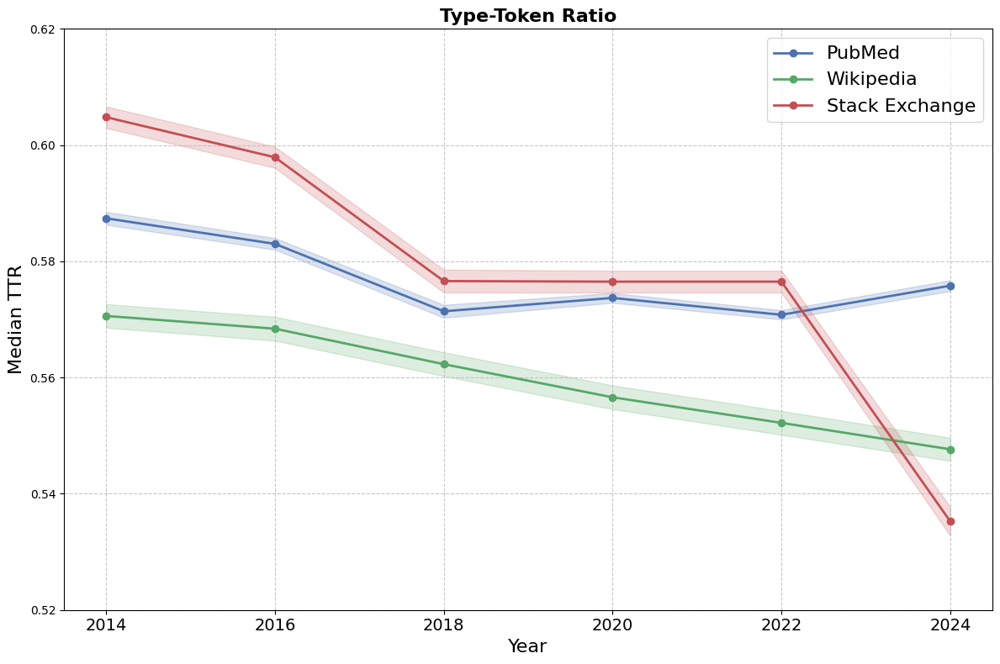

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats

# Data for each group by year
group1_2014 = ttr_list_pubmed_2014
group1_2016 = ttr_list_pubmed_2016
group1_2018 = ttr_list_pubmed_2018
group1_2020 = ttr_list_pubmed_2020
group1_2022 = ttr_list_pubmed_2022
group1_2024 = ttr_list_pubmed_2024

group2_2014 = ttr_list_wiki_2014
group2_2016 = ttr_list_wiki_2016
group2_2018 = ttr_list_wiki_2018
group2_2020 = ttr_list_wiki_2020
group2_2022 = ttr_list_wiki_2022
group2_2024 = ttr_list_wiki_2024

group3_2014 = ttr_list_stackexchange_2014
group3_2016 = ttr_list_stackexchange_2016
group3_2018 = ttr_list_stackexchange_2018
group3_2020 = ttr_list_stackexchange_2020
group3_2022 = ttr_list_stackexchange_2022
group3_2024 = ttr_list_stackexchange_2024

# Organize data into groups and years
groups = {
    "PubMed": [group1_2014, group1_2016, group1_2018, group1_2020, group1_2022, group1_2024],
    "Wikipedia": [group2_2014, group2_2016, group2_2018, group2_2020, group2_2022, group2_2024],
    "Stack Exchange": [group3_2014, group3_2016, group3_2018, group3_2020, group3_2022, group3_2024]
}

years = [2014, 2016, 2018, 2020, 2022, 2024]

# Calculate median and standard error for each group and year
medians = {}
errors = {}

for group_name, group_data in groups.items():
    medians[group_name] = []
    errors[group_name] = []

    for year_data in group_data:
        # Filter out NaN values before calculating stats
        filtered_data = [x for x in year_data if not np.isnan(x)]
        median = np.median(filtered_data)
        # Standard error = standard deviation / sqrt(n)
        std_err = np.std(filtered_data, ddof=1) / np.sqrt(len(filtered_data))

        medians[group_name].append(median)
        errors[group_name].append(std_err)

# Create the plot
plt.figure(figsize=(12, 8))

# Custom colors for each group
colors = {
    "PubMed": "#4C72B0",  # Blue
    "Wikipedia": "#55A868",  # Green
    "Stack Exchange": "#C44E52"   # Red
}

# Create the figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot all three groups on a single plot
for group_name, color in colors.items():
    ax.plot(years, medians[group_name], 'o-', label=group_name, color=color, linewidth=2)

    # Add shaded error regions
    ax.fill_between(years,
                    [m - e for m, e in zip(medians[group_name], errors[group_name])],
                    [m + e for m, e in zip(medians[group_name], errors[group_name])],
                    alpha=0.2, color=color)

# Add labels and title
ax.set_xlabel('Year', fontsize=16)
ax.set_ylabel('Median TTR', fontsize=16)
ax.set_title('Type-Token Ratio', fontsize=16, fontweight='bold')
ax.set_ylim(0.52, 0.62)

# Add grid
ax.grid(True, linestyle='--', alpha=0.7)

# Set x-ticks to years
ax.set_xticks(years)
ax.set_xticklabels(years, fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=16)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()